In [1]:
### basic library
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
from collections import Counter
### ETC
from tqdm.notebook import tqdm
import pathlib

### graph library
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import seaborn as sns
sns.set



### 분석관련 library
import statistics
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score,accuracy_score
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.utils.vis_utils import plot_model

print(tf.__version__)

2.4.0


In [2]:
## 데이터 불러오기
data_com = pd.read_excel(r"C:\Users\Samsung\jupyter\Project_PCB\data\Data_preprocessing5.xlsx")
## 결측값을 "0"으로 채우기
data_com = data_com.fillna(0)
data_com.head()

,Model,LayerNum,PP,MatlMaker,RD,GD,MatlNum,RC,MatlG,Cu1,CP1,Cu2,CP2,Input_T,Thickness
0,1,1,1,DS7402M,1.36,2.56,1080.0,61.0,46.8,8.21,55,14.29,73,60,67.70
1,1,2,0,DS7402M,1.36,2.56,0.0,0.0,0.0,14.29,73,15.04,56,75,73.71
2,1,3,1,DS7402M,1.36,2.56,7628.0,47.0,203.4,15.04,56,14.58,46,200,187.25
3,1,4,0,DS7402M,1.36,2.56,0.0,0.0,0.0,14.58,46,14.29,75,75,77.47
4,1,5,1,DS7402M,1.36,2.56,3313.0,53.0,81.4,14.29,75,15.04,48,90,80.48


In [3]:
## 사전만들기: MatlG를 통해서 MatlNum을 불러오기 위해
dic_glass = {}
keys = data_com["MatlG"].groupby(data_com["MatlNum"]).mean().keys()
values = data_com["MatlG"].groupby(data_com["MatlNum"]).mean().values
for i in range(len(keys)):
    dic_glass[keys[i]] = round(values[i],2)
## 사전만들기: 위랑 반대로 MatlNum을 통해서 MatlG를 불러올때
MatMaker_dic = {}
for i in range(len(data_com)):
    MatMaker_dic[data_com["MatlG"][i]] = data_com["MatlNum"][i]

In [4]:
## 사전 만들었으니 필요 없는 columns 지우기 
data_com = data_com.drop(columns=["RD","GD","MatlNum"])
data_com.head()

,Model,LayerNum,PP,MatlMaker,RC,MatlG,Cu1,CP1,Cu2,CP2,Input_T,Thickness
0,1,1,1,DS7402M,61.0,46.8,8.21,55,14.29,73,60,67.70
1,1,2,0,DS7402M,0.0,0.0,14.29,73,15.04,56,75,73.71
2,1,3,1,DS7402M,47.0,203.4,15.04,56,14.58,46,200,187.25
3,1,4,0,DS7402M,0.0,0.0,14.58,46,14.29,75,75,77.47
4,1,5,1,DS7402M,53.0,81.4,14.29,75,15.04,48,90,80.48


# Blind testset 만들기

## Dataset 개수 count 

In [5]:
len(data_com[data_com["LayerNum"]==17])

3

In [6]:
Molist = data_com["Model"].value_counts().keys().tolist()
mo_li,max_li,set_li,total_li = [],[],[],[]
for mo in Molist:
    tar_com = data_com[data_com["Model"]==mo]
    max_layer = tar_com["LayerNum"].max()
    count_ = len(tar_com[tar_com["LayerNum"]==max_layer])
    total_count_ = len(tar_com)
    mo_li.append(mo)
    max_li.append(max_layer)
    set_li.append(count_)
    total_li.append(total_count_)
set_df = pd.DataFrame([mo_li,max_li,set_li,total_li]).T.rename(columns={0:"Model",1:"Max_layer",2:"set_count",3:"total_count"})
set_df = set_df.sort_values(by=["Model"]).reset_index(drop=True)
set_df.head()

,Model,Max_layer,set_count,total_count
0,1,11,5,55
1,2,11,5,55
2,3,7,5,35
3,4,9,10,90
4,5,14,10,140


In [7]:
set_df

,Model,Max_layer,set_count,total_count
0,1,11,5,55
1,2,11,5,55
2,3,7,5,35
3,4,9,10,90
4,5,14,10,140
...,...,...,...,...
60,61,10,5,50
61,62,7,5,35
62,63,9,5,45
63,64,9,5,45


In [8]:
data_g2 = pd.DataFrame(set_df["set_count"].value_counts()).reset_index(drop=False).rename(columns={"index":"Set_Count","set_count":"Count"})
data_g2 = data_g2.sort_values(by=["Set_Count"])
data_g2["Set_Count"] = data_g2["Set_Count"].map(lambda x: str(x))
data_g2.head()

,Set_Count,Count
1,3,22
0,5,32
3,6,5
2,10,6


([<matplotlib.axis.XTick at 0x21fd6edaec8>,
 <a list of 4 Text xticklabel objects>)

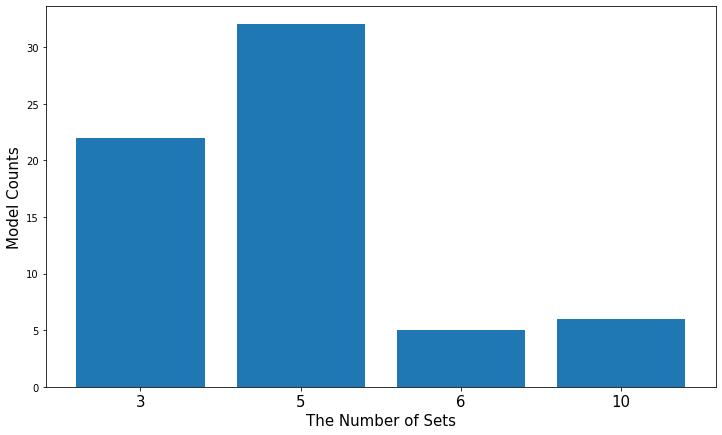

In [9]:
plt.figure(figsize=(12, 7))
plt.bar(data_g2["Set_Count"],data_g2["Count"])
plt.ylabel("Model Counts",fontsize=15)
plt.xlabel("The Number of Sets",fontsize=15)
plt.xticks(data_g2["Set_Count"],fontsize=15)

In [10]:
fig = px.bar(data_g2, x="Set_Count", y="Count")

fig.update_layout(annotations = [dict(xref='paper', yref='paper', x=0.0, y=1.02,
                              xanchor='left', yanchor='bottom',
                              text='Set Count',
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False)])
fig.update_yaxes(showline=True, linewidth=2, gridcolor='rgb(204, 204, 204)')

fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=-0.13,
    xanchor="right",
    x=1),
    font=dict(size=15),
    plot_bgcolor='white')

fig.show()

In [11]:
## 사용자함수(def_1): 각 Model 별 하나의 Blind testset(set: 1층~n층) 추출하기
def extraction_dataset(data_2,number):
    """
    data_2 = 전체 data
    number = 추출하려고 하는 model(:1~65)
    """
    ### 전체 data에서 model="number"인 것만 지정
    test_model = data_2[data_2["Model"]==number]
    
    ### 하나의 set를 가져오기 위해서, model에 있는 layer값들을 정렬(1층~...)
    a = list(test_model["LayerNum"].value_counts().sort_index().keys())
    a_index = [i-1 for i in a]
    ## 뽑아내기
    df_ = test_model.iloc[a_index,:]
    return df_

In [12]:
### model_list = model_1 ~ model_64 
model_list = list(data_com["Model"].value_counts().keys())


testset_dic = {}

### test_list:  뽑힌 정보의 index 정보를 저장하기 위해서 이용
#blinde testset으로 뽑힌 데이터는 train 할때 제거해야 하기 때문에,

testset_list = []
for mo in model_list:
    ### 각 model의 testset을 model_(n) 이름의 변수로 저장하기
    """
    사용자함수: extraction_dataset
    """
    globals () ["model_{}".format(mo)] = extraction_dataset(data_com,mo)
    testset_list.append(globals () ["model_{}".format(mo)])
    testset_dic["model_{}".format(mo)] = globals () ["model_{}".format(mo)]

### total 용 bind testset

In [13]:
data_com2 = data_com.copy()
data_com2["MatlMaker_cate"] = data_com2["MatlMaker"].astype("category")
cat_col = data_com2.select_dtypes(["category"]).columns
data_com2[cat_col] = data_com2[cat_col].apply(lambda x: x.cat.codes)
#data_com2= data_com2.drop(columns="MatlMaker")    
data_com2.head()

,Model,LayerNum,PP,MatlMaker,RC,MatlG,Cu1,CP1,Cu2,CP2,Input_T,Thickness,MatlMaker_cate
0,1,1,1,DS7402M,61.0,46.8,8.21,55,14.29,73,60,67.70,1
1,1,2,0,DS7402M,0.0,0.0,14.29,73,15.04,56,75,73.71,1
2,1,3,1,DS7402M,47.0,203.4,15.04,56,14.58,46,200,187.25,1
3,1,4,0,DS7402M,0.0,0.0,14.58,46,14.29,75,75,77.47,1
4,1,5,1,DS7402M,53.0,81.4,14.29,75,15.04,48,90,80.48,1


In [14]:
### total 용으로 
model_list_2 = list(data_com2["Model"].value_counts().keys())


testset_dic_2 = {}

### test_list:  뽑힌 정보의 index 정보를 저장하기 위해서 이용
#blinde testset으로 뽑힌 데이터는 train 할때 제거해야 하기 때문에,

testset_list_2 = []
for mo in model_list_2:
    ### 각 model의 testset을 model_(n) 이름의 변수로 저장하기
    """
    사용자함수: extraction_dataset
    """
    globals () ["model_{}_total".format(mo)] = extraction_dataset(data_com2,mo)
    testset_list_2.append(globals () ["model_{}_total".format(mo)])
    testset_dic_2["model_{}_total".format(mo)] = globals () ["model_{}".format(mo)]

In [15]:
## 예시: model_1 의 testset 불러오기
testset_dic["model_1"]

,Model,LayerNum,PP,MatlMaker,RC,MatlG,Cu1,CP1,Cu2,CP2,Input_T,Thickness
0,1,1,1,DS7402M,61.0,46.8,8.21,55,14.29,73,60,67.70
1,1,2,0,DS7402M,0.0,0.0,14.29,73,15.04,56,75,73.71
2,1,3,1,DS7402M,47.0,203.4,15.04,56,14.58,46,200,187.25
3,1,4,0,DS7402M,0.0,0.0,14.58,46,14.29,75,75,77.47
4,1,5,1,DS7402M,53.0,81.4,14.29,75,15.04,48,90,80.48
5,1,6,0,DS7402M,0.0,0.0,15.04,48,14.29,48,180,173.75
6,1,7,1,DS7402M,53.0,81.4,14.29,48,14.29,75,90,81.44
7,1,8,0,DS7402M,0.0,0.0,14.29,75,15.04,50,75,73.71
8,1,9,1,DS7402M,47.0,203.4,15.04,50,15.80,60,200,193.23
9,1,10,0,DS7402M,0.0,0.0,15.80,60,15.04,73,75,75.97


In [16]:
### train 할 데이터에서 Blind에서 뽑힌 데이터 제거하기
# 위의 testset_list 이용
drop_index = []
for i in testset_list:
    drop_index.extend(list(i.index))
data_drop = data_com.drop(drop_index).reset_index(drop=True)

### 제거된 데이터 = data_drop: 학습에 이용

In [17]:
data_drop.head()

,Model,LayerNum,PP,MatlMaker,RC,MatlG,Cu1,CP1,Cu2,CP2,Input_T,Thickness
0,1,1,1,DS7402M,61.0,46.8,8.37,55,14.29,73,60,66.19
1,1,2,0,DS7402M,0.0,0.0,14.29,73,15.04,56,75,74.47
2,1,3,1,DS7402M,47.0,203.4,15.04,56,15.04,46,200,196.32
3,1,4,0,DS7402M,0.0,0.0,15.04,46,15.04,75,75,75.22
4,1,5,1,DS7402M,53.0,81.4,15.04,75,15.04,48,90,82.26


In [18]:
data_total = data_drop.copy()
data_total["Model"] = "0"
data_total["MatlMaker"] = "All"
data_total.head()

,Model,LayerNum,PP,MatlMaker,RC,MatlG,Cu1,CP1,Cu2,CP2,Input_T,Thickness
0,0,1,1,All,61.0,46.8,8.37,55,14.29,73,60,66.19
1,0,2,0,All,0.0,0.0,14.29,73,15.04,56,75,74.47
2,0,3,1,All,47.0,203.4,15.04,56,15.04,46,200,196.32
3,0,4,0,All,0.0,0.0,15.04,46,15.04,75,75,75.22
4,0,5,1,All,53.0,81.4,15.04,75,15.04,48,90,82.26


## CCL PP의 차이

In [19]:
data_drop[data_drop["PP"]==1].head()

,Model,LayerNum,PP,MatlMaker,RC,MatlG,Cu1,CP1,Cu2,CP2,Input_T,Thickness
0,1,1,1,DS7402M,61.0,46.8,8.37,55,14.29,73,60,66.19
2,1,3,1,DS7402M,47.0,203.4,15.04,56,15.04,46,200,196.32
4,1,5,1,DS7402M,53.0,81.4,15.04,75,15.04,48,90,82.26
6,1,7,1,DS7402M,53.0,81.4,14.58,48,14.58,75,90,80.48
8,1,9,1,DS7402M,47.0,203.4,15.80,50,15.04,60,200,202.85


In [20]:
data_drop[data_drop["PP"]==0]["RC"].value_counts()

0.0     774
61.0     45
58.0     36
57.0     18
44.0     18
Name: RC, dtype: int64

([<matplotlib.axis.XTick at 0x21fd957f508>,
 <a list of 5 Text xticklabel objects>)

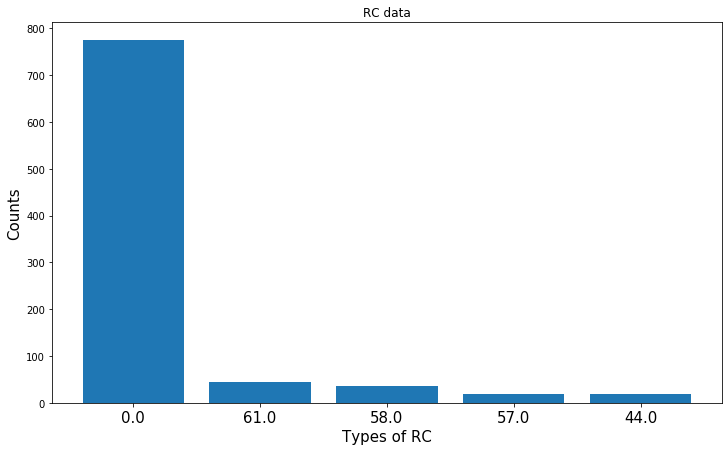

In [21]:
plt.figure(figsize=(12, 7))
x = data_drop[data_drop["PP"]==0]["RC"].value_counts().keys().map(lambda x:str(x))
y = data_drop[data_drop["PP"]==0]["RC"].value_counts().values
plt.bar(x,y)
plt.ylabel("Counts",fontsize=15)
plt.xlabel("Types of RC",fontsize=15)
plt.title("RC data")
plt.xticks(x,fontsize=15)

# 1. CCL 층 예측기 만들기

### 1.1 CCL data preprocessing(데이터 전처리)

In [22]:
### pp = 0 인 데이터만 추출하기
data_cc = data_drop[data_drop["PP"]==0]
data_cc.head()

,Model,LayerNum,PP,MatlMaker,RC,MatlG,Cu1,CP1,Cu2,CP2,Input_T,Thickness
1,1,2,0,DS7402M,0.0,0.0,14.29,73,15.04,56,75,74.47
3,1,4,0,DS7402M,0.0,0.0,15.04,46,15.04,75,75,75.22
5,1,6,0,DS7402M,0.0,0.0,15.04,48,14.58,48,180,177.51
7,1,8,0,DS7402M,0.0,0.0,14.58,75,15.80,50,75,74.47
9,1,10,0,DS7402M,0.0,0.0,15.04,60,14.29,73,75,73.23


In [23]:
### 사용자함수(def_2): CCL train을 위하여, data 전처리하기
def make_ccl(data_cc,drop_list):
    """
    data_cc: 기존데이터
    drop_list: 기존데이터에서 제거하고 싶은 columns 이름
    """
    ### 필요없는 columns 제거
    data_cc2 = data_cc.drop(columns=drop_list)
    
    ### MatlMaker 정보를 categorical data로 변경하기.
    # MatlMaker의 string 정보를 --> MatlMaker_cate라는 columns에 nominal scale로 변경
    data_cc2["MatlMaker_cate"] = data_cc2["MatlMaker"].astype("category")
    cat_col = data_cc2.select_dtypes(["category"]).columns
    # categroical 형태로 변경
    data_cc2[cat_col] = data_cc2[cat_col].apply(lambda x: x.cat.codes)
    
    # (PS: 내용이 복잡해도 결과보면 어떤 작업인지 알꺼야 미영아)
    dic_ = {}
    for i in data_cc.index:
        # 삽입
        dic_[data_cc2.loc[i,"MatlMaker"]] = data_cc2.loc[i,"MatlMaker_cate"]
    data_cc2 = data_cc2.drop(columns="MatlMaker")
    return data_cc2

In [24]:
"""
사용자함수: make_ccl
"""
data_cc2 = make_ccl(data_cc,["Model","PP","MatlG"])
data_cc2.head()

,LayerNum,RC,Cu1,CP1,Cu2,CP2,Input_T,Thickness,MatlMaker_cate
1,2,0.0,14.29,73,15.04,56,75,74.47,1
3,4,0.0,15.04,46,15.04,75,75,75.22,1
5,6,0.0,15.04,48,14.58,48,180,177.51,1
7,8,0.0,14.58,75,15.80,50,75,74.47,1
9,10,0.0,15.04,60,14.29,73,75,73.23,1


### 1.2 분석하기

In [25]:
### 사용자함수(def_3)
def rsq(y_pred,y_test):
    se = y_test - y_pred
    se2 = se ** 2
    s = sum(i for i in se2)

    st = y_test - np.mean(y_test)
    st2 = st ** 2
    t = sum(i for i in st2)

    r_sqr = 1 - (s/t)
    return r_sqr

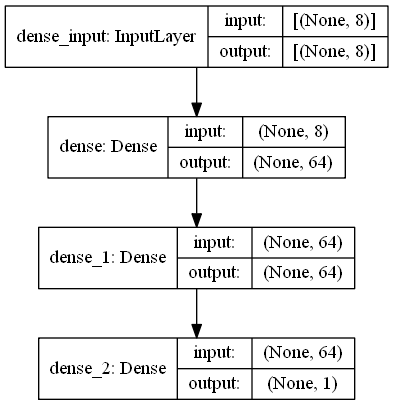

In [26]:
### 1) train test data 나누기 

y = data_cc2.loc[:,"Thickness"]
x = data_cc2.drop(columns="Thickness")

# parameter: test_size=0.2("전체 데이터에서 20%를 test용, 80%를 train 용으로 써라")
# parameter: random_state=42("나누는 기준을 42로해라",)
# PS:  42값 자체가 큰 의미가 있는게 아니라, 나눌때마다 동일하게 나누기 위해서 하는거야 알았지??
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

### 2) ANN structure 만들기 

model_ccl = keras.Sequential([
    # node= 64개, 활성함수= Relu함수
    layers.Dense(64, activation='relu', input_shape=[len(X_train.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

### 3) backprobagation을 하기위한 setting
# optimizer: RMS(0.001)은 통상적으로 성능이 좋다고 하기 때문에 사용
# loss= MSE로 update, metrics = 기록을 mae와 mse로 해라
optimizer = tf.keras.optimizers.RMSprop(0.001)
model_ccl.compile(loss='mse',optimizer=optimizer,metrics=['mae', 'mse'])

# 내가 구축한 ANN model 시각적으로 확인하기
plot_model(model_ccl, show_shapes=True, show_layer_names=True)

In [27]:
### 4) 데이터 분석하기.
history_ccl = model_ccl.fit(X_train, y_train, epochs=300,verbose=0)
# 분석기록을 dataframe 형태로 만들기
hist_ccl = pd.DataFrame(history_ccl.history)
hist_ccl['epoch'] = history_ccl.epoch

### 5) 성능평가하기
loss_, mae_, mse_ = model_ccl.evaluate(X_test, y_test, verbose=2)
### 6) 예측하기
y_pred = model_ccl.predict(X_test).flatten()

"""
사용자함수: rsq
"""
rsqr_ = rsq(y_pred,y_test)
rsqr_

6/6 - 0s - loss: 4.2950 - mae: 1.5449 - mse: 4.2950


0.999583494934791

In [28]:
### 7) 분석결과 그래프로 확인하기


def make_graph(y_test,y_pred):
    """
    y_test: 실제값
    y_pred: 예측값
    """
    # graph 사이즈 결정
    plt.figure(figsize=(12, 7))
    
    ### subplot(2,1,1) = 한번에 (2개의 가로축, 1개의 새로축으로, 총2개의 graph를 표현하겠다.) # 그 중에서 1번을 표현하겠다.
    plt.subplot(2,1,1)
    # graph 표현할 데이터
    plt.hist(y_test-y_pred, label="y_test")
    # x축 이름
    plt.xlabel("Gap")
    # x축 범위
    plt.xlim([-20,20])
    # graph 이름
    plt.title("Test - Pred")
    
    ### subplot(2,1,1) = 한번에 (2개의 가로축, 1개의 새로축으로, 총2개의 graph를 표현하겠다.) # 그 중에서 1번을 표현하겠다.
    plt.subplot(2,1,2)
    # graph에 표현할 데이터
    sns.distplot(y_test,hist=False, label="y_test")
    sns.distplot(y_pred,hist=False,  label="y_pred")
    
    # x축 이름
    plt.xlabel("Thickness")
    # graph 이름
    plt.title("Test & Pred")
    # 2개의 praph의 요소들이 겹치지 않게 해라
    plt.tight_layout()
    plt.show()

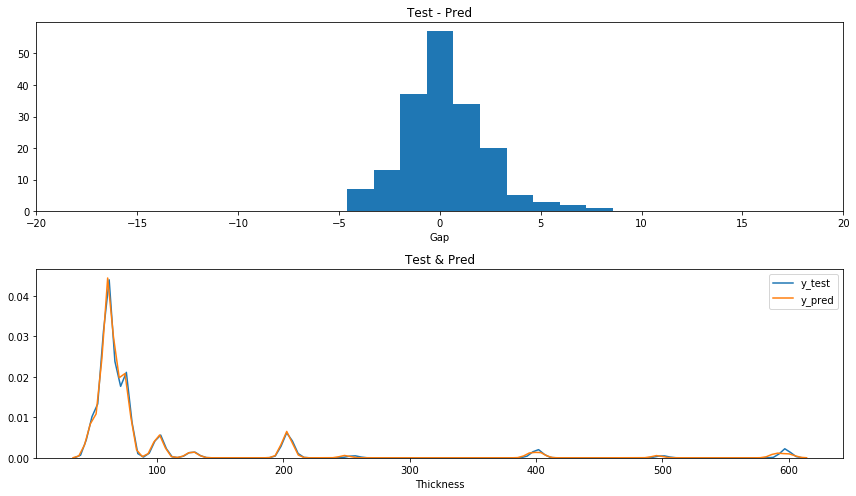

0.999583494934791

In [29]:
make_graph(y_pred,y_test)
rsqr_

# 2. PP층 분석하기

## 2.1 Total data 만들기

In [30]:
data_pp_total = data_drop[data_drop["PP"]==1]
#data_ = data_.fillna(0)
data_pp_total = data_pp_total.drop(columns=["PP"])
data_pp_total["MatlMaker_cate"] = data_pp_total["MatlMaker"].astype("category")
cat_col = data_pp_total.select_dtypes(["category"]).columns
data_pp_total[cat_col] = data_pp_total[cat_col].apply(lambda x: x.cat.codes)
maker_dic = {}
for row,col in data_pp_total.iterrows():
    maker_dic[col["MatlMaker_cate"]] = col["MatlMaker"]
data_pp_total= data_pp_total.drop(columns="MatlMaker")
data_pp_total.head()

,Model,LayerNum,RC,MatlG,Cu1,CP1,Cu2,CP2,Input_T,Thickness,MatlMaker_cate
0,1,1,61.0,46.8,8.37,55,14.29,73,60,66.19,1
2,1,3,47.0,203.4,15.04,56,15.04,46,200,196.32,1
4,1,5,53.0,81.4,15.04,75,15.04,48,90,82.26,1
6,1,7,53.0,81.4,14.58,48,14.58,75,90,80.48,1
8,1,9,47.0,203.4,15.80,50,15.04,60,200,202.85,1


In [31]:
data_pp_total["MatlMaker_cate"].unique()

array([1, 5, 2, 0, 4, 3], dtype=int8)

In [32]:
y = data_pp_total.loc[:,"Thickness"]
x = data_pp_total.drop(columns="Thickness")
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

## 2.1.1 LR

In [33]:
LR_all = linear_model.LinearRegression()
LR_all.fit(X_train, y_train)
y_pred = LR_all.predict(X_test)
rsqr_ = rsq(y_pred,y_test)

mse_ = mean_squared_error(y_test, y_pred)
min_ = round(min(abs(y_test - y_pred)),3)
max_ = round(max(abs(y_test - y_pred)),3)
mean_ = round((abs(y_test - y_pred)).mean(),3)
std_ = round(statistics.stdev(y_test - y_pred),3)
print(rsqr_,mse_,[min_,max_,mean_,std_])

0.9778132704189191 63.931468125024914 [0.086, 26.238, 6.257, 7.988]


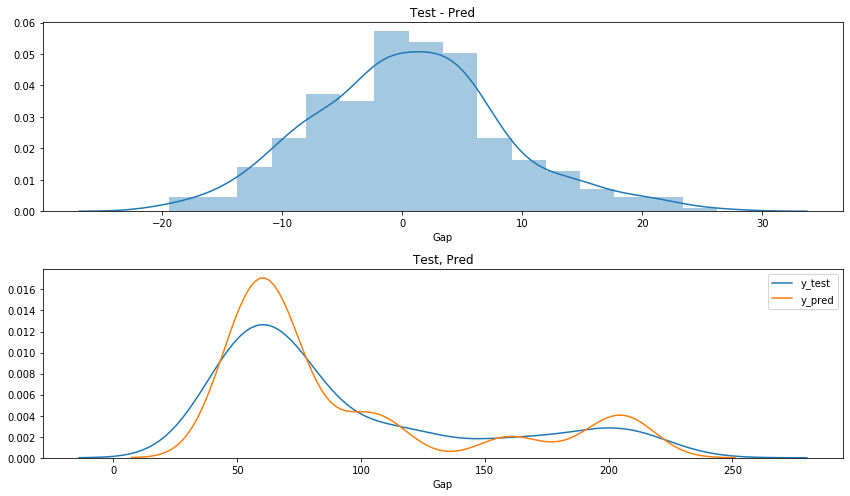

In [34]:
plt.figure(figsize=(12, 7))
plt.subplot(2,1,1)
sns.distplot(y_test-y_pred,hist=True, label="y_test")
plt.xlabel("Gap")
#plt.xlim([-40,40])
plt.title("Test - Pred")

plt.subplot(2,1,2)
sns.distplot(y_test,hist=False, label="y_test")
sns.distplot(y_pred,hist=False,  label="y_pred")
plt.xlabel("Gap")
plt.title("Test, Pred")
plt.tight_layout()
plt.show()

### 2.1.2 ANN

In [35]:
tf.keras.backend.clear_session()


ANN_all = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(X_train.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
  ])

optimizer = tf.keras.optimizers.RMSprop(0.001)

ANN_all.compile(loss='mse',
            optimizer=optimizer,
            metrics=['mae', 'mse'])

history = ANN_all.fit(X_train, y_train, epochs=300,verbose=0)


hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch


loss_, mae_, mse_ = ANN_all.evaluate(X_test, y_test, verbose=2)

y_pred = ANN_all.predict(X_test).flatten()

rsqr_ = rsq(y_pred,y_test)

min_ = round(min(abs(y_test - y_pred)),3)
max_ = round(max(abs(y_test - y_pred)),3)
mean_ = round((abs(y_test - y_pred)).mean(),3)
std_ = round(statistics.stdev(y_test - y_pred),3)

print(rsqr_,mse_,[min_,max_,mean_,std_])

10/10 - 0s - loss: 17.1435 - mae: 3.1974 - mse: 17.1435
0.9940505458856562 17.143457412719727 [0.007, 11.758, 3.197, 3.972]


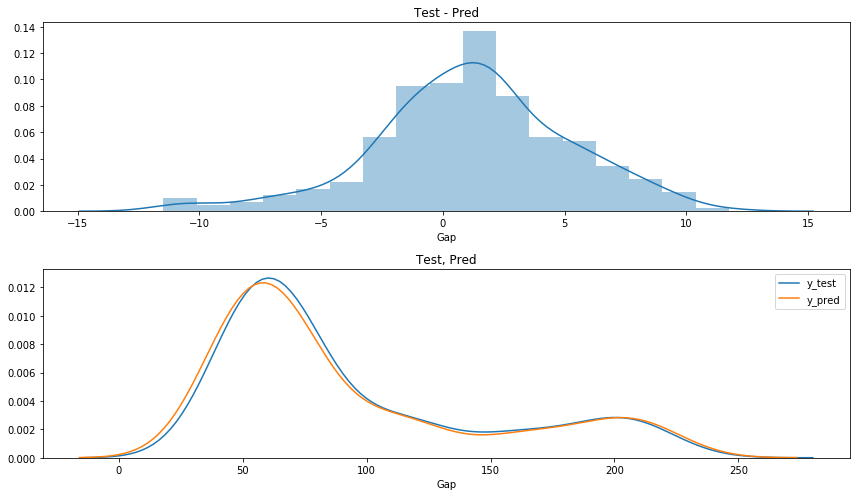

In [36]:
plt.figure(figsize=(12, 7))
plt.subplot(2,1,1)
sns.distplot(y_test-y_pred,hist=True, label="y_test")
plt.xlabel("Gap")
#plt.xlim([-40,40])
plt.title("Test - Pred")

plt.subplot(2,1,2)
sns.distplot(y_test,hist=False, label="y_test")
sns.distplot(y_pred,hist=False,  label="y_pred")
plt.xlabel("Gap")
plt.title("Test, Pred")
plt.tight_layout()
plt.show()

## 2.2 bind test

In [37]:
## for total
def ann_test(testset,drop_list):
    """
    testset: 앞 부분에서 testset으로 뽑아낸 blind test 용 데이터
    drop_list: 분석에 필요없는 columns list
    """
    # pp층은 "matmaker"를 제거해야 함으로 제거 목록 추가

    drop_list_ccl = drop_list + ["MatlMaker_cate"]
    
    # model_: pp 층용 데이터, model_2: ccl층 데이터
    model_ = testset.reset_index(drop=True)
    model_2 = make_ccl(model_,drop_list_ccl)       
    

    thick_ = []
    
    ### testset의 한층씩 예측값 산출하기
    for i in range(len(model_)):
        # i 번째 층 불러오기
        target_data = model_.loc[i,:]

        # 해당층의 값들 정리하기
        maker_name = maker_dic[target_data["MatlMaker_cate"]]
        glass_name = str(target_data["MatlG"]).replace(".","_")
        
        full_1 = maker_name +"/"+glass_name
        full =  maker_name +"_"+glass_name
        ### CCL 층 값 예측하기
        if target_data["PP"] == 0:
            test_data = model_2.loc[i,:]
            # y값
            y_t = test_data["Thickness"]
            # x값
            x_t1 = test_data.drop("Thickness")
            x_t = np.array(x_t1).reshape(1, -1).astype('float32')
            # 값예측
            """
            위에서 학습한 CCL 분류기: model_ccl
            """
            prdi_ = model_ccl.predict(x_t)[0][0]
            # 결과저장
            thick_.append((full_1,prdi_,y_t))
            
        else:
            
            test_data = target_data.drop(["PP","MatlMaker"])

            # y값
            y_t = test_data["Thickness"]
            # x 값
            x_t1 = test_data.drop("Thickness")
            x_t = np.array(x_t1).reshape(1, -1).astype('float32')
            # 값예측
            """
            위에서 학습한 ANN 모델 불러오기
            """

            prdi_ = ANN_all.predict(x_t)[0][0]
            # 결과 저장
            thick_.append((full_1,prdi_,y_t))

    return thick_

In [38]:
maker_dic

{1: 'DS7402M',
 5: 'NPG-151',
 2: 'EM-370Z',
 0: 'DS7402LC',
 4: 'IT150G',
 3: 'EM-526'}

In [39]:
### 사용자함수 LR을 통한 blind test
## ANN 거의 동일해서 따로 위에 보면 될 것 같아 미영아
def lr_test(testset,drop_list):

    drop_list_ccl = drop_list + ["MatlMaker_cate"]
    model_ = testset.reset_index(drop=True)
    model_2 = make_ccl(model_,drop_list_ccl)



    thick_ = []
    for i in range(len(model_)):
        target_data = model_.loc[i,:]
        maker_name = maker_dic[target_data["MatlMaker_cate"]]
        glass_name = str(target_data["MatlG"]).replace(".","_")
        full_1 = maker_name +"/"+glass_name
        full =  maker_name +"_"+glass_name
        
        if target_data["PP"] == 0:
            test_data = model_2.loc[i,:]
            # y값
            y_t = test_data["Thickness"]
            x_t1 = test_data.drop("Thickness")
            x_t = np.array(x_t1).reshape(1, -1).astype('float32')
            
            prdi_ = model_ccl.predict(x_t)[0][0]
            thick_.append((full_1,prdi_,y_t))
            
        else:
            test_data = target_data.drop(["PP","MatlMaker"])
            # y값
            y_t = test_data["Thickness"]
            x_t1 = test_data.drop("Thickness")
            x_t = np.array(x_t1).reshape(1, -1).astype('float32')
            
            prdi_ = LR_all.predict(x_t)[0]
            thick_.append((full_1,prdi_,y_t))
            
    return thick_

In [40]:
dl = ["Model","PP","MatlG"]

## path_만 원하는 곳으로 고치면 될꺼야 
path_ = r"C:\Users\Samsung\jupyter\Project_PCB\result\0217\ANN_total_all.xlsx"
default_ = pd.DataFrame()


for mo in tqdm(sorted(model_list)):
    mo_,maker_,glass_,pr_,actual_ = [],[],[],[],[]

    target_ = globals()["model_{}_total".format(mo)]

    blind_test = ann_test(target_,dl)
    for i in blind_test:
        maker,glass = i[0].split("/")
        maker_.append(maker)
        glass_.append(glass.replace("_","."))
        pr_.append(i[1])
        actual_.append(i[2])
        mo_.append(mo)

    out_put = pd.DataFrame([mo_,maker_,glass_,pr_,actual_]).T.rename(columns={0:"Model",1:"Maker",2:"Glass",3:"pred_",4:"actual"})
    default_ = pd.concat([default_,out_put])
default_ANN_total = default_.reset_index(drop=True)
default_ANN_total.to_excel(path_)

  0%|          | 0/65 [00:00<?, ?it/s]

In [41]:
dl = ["Model","PP","MatlG"]

## path_만 원하는 곳으로 고치면 될꺼야 
path_ = r"C:\Users\Samsung\jupyter\Project_PCB\result\0217\LR_total_all.xlsx"
default_ = pd.DataFrame()


for mo in tqdm(sorted(model_list)):
    mo_,maker_,glass_,pr_,actual_ = [],[],[],[],[]

    target_ = globals()["model_{}_total".format(mo)]

    blind_test = lr_test(target_,dl)
    for i in blind_test:
        maker,glass = i[0].split("/")
        maker_.append(maker)
        glass_.append(glass.replace("_","."))
        pr_.append(i[1])
        actual_.append(i[2])
        mo_.append(mo)

    out_put = pd.DataFrame([mo_,maker_,glass_,pr_,actual_]).T.rename(columns={0:"Model",1:"Maker",2:"Glass",3:"pred_",4:"actual"})
    default_ = pd.concat([default_,out_put])
default_LR_total = default_.reset_index(drop=True)
default_LR_total.to_excel(path_)

  0%|          | 0/65 [00:00<?, ?it/s]

In [42]:
def error_abs(pre_,real_):
    return abs(pre_-real_)/pre_

### ANN

In [43]:
tar_total = default_ANN_total

tar_total["error_rate"] = tar_total.apply(lambda x : error_abs(x["pred_"],x["actual"]),axis=1)
tar_total.head()

,Model,Maker,Glass,pred_,actual,error_rate
0,1,DS7402M,46.8,66.3589,67.7,0.020210
1,1,DS7402M,0.0,74.0854,73.71,0.005067
2,1,DS7402M,203.4,199.814,187.25,0.062880
3,1,DS7402M,0.0,74.9981,77.47,0.032959
4,1,DS7402M,81.4,80.9237,80.48,0.005482


In [44]:
### CCL 예측기의 평균오차
ccl_1 = tar_total[tar_total["Glass"]=="0.0"]["error_rate"]
ccl_1.mean()

0.023608868723488715

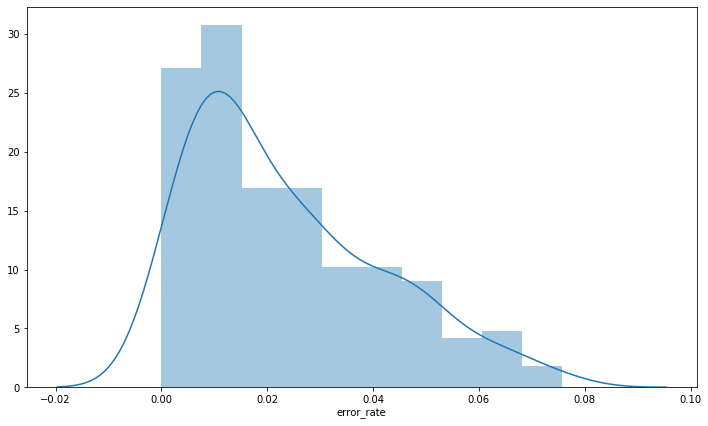

In [45]:
plt.figure(figsize=(12, 7))
sns.distplot(ccl_1,hist=True,label="y_test")

In [46]:
tar_total.head()

,Model,Maker,Glass,pred_,actual,error_rate
0,1,DS7402M,46.8,66.3589,67.7,0.020210
1,1,DS7402M,0.0,74.0854,73.71,0.005067
2,1,DS7402M,203.4,199.814,187.25,0.062880
3,1,DS7402M,0.0,74.9981,77.47,0.032959
4,1,DS7402M,81.4,80.9237,80.48,0.005482


DS7402M_46.8's Avg Error rate: 0.049503324056849464


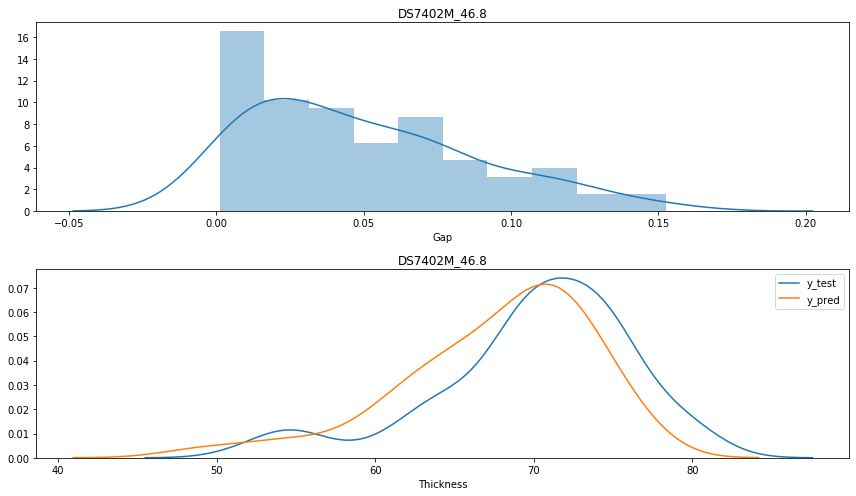

--------------------------------------------------
DS7402M_0.0's Avg Error rate: 0.022260133494642374


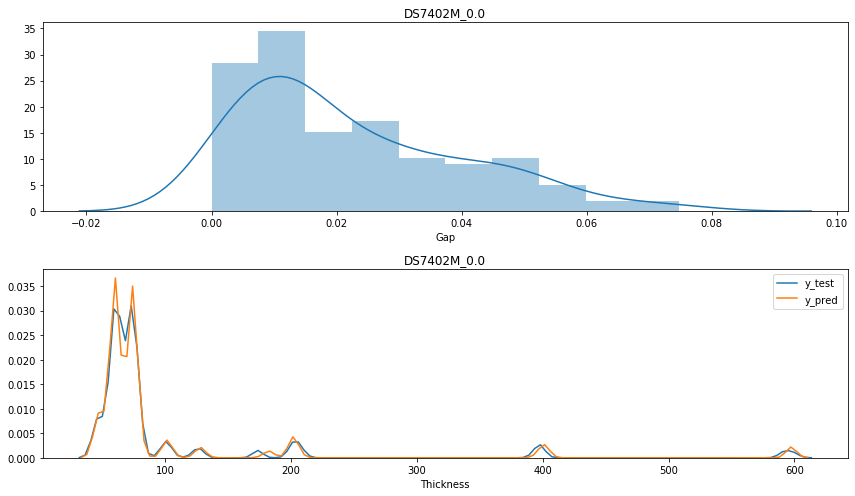

--------------------------------------------------
DS7402M_203.4's Avg Error rate: 0.02619905384900301


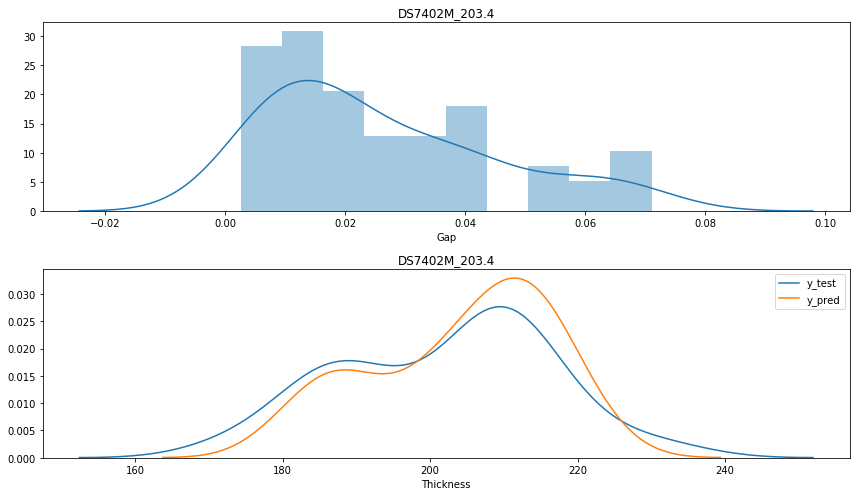

--------------------------------------------------
DS7402M_81.4's Avg Error rate: 0.02109289815933661


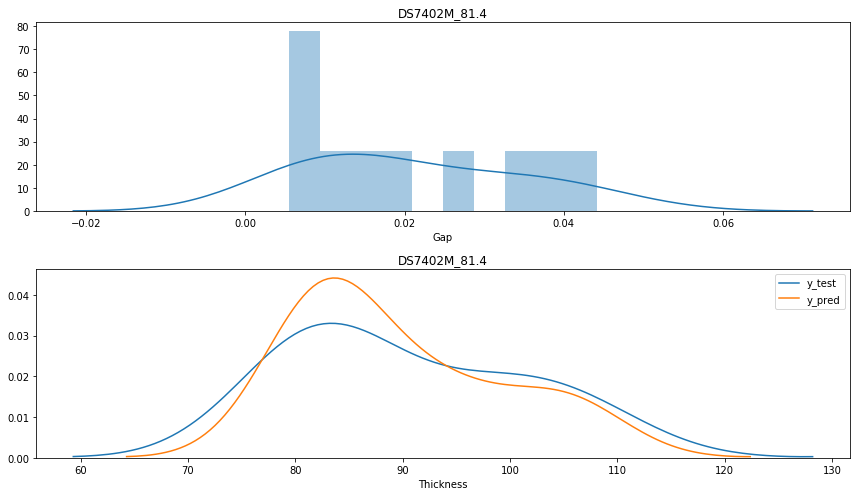

--------------------------------------------------
DS7402M_165.0's Avg Error rate: 0.016220652069054563


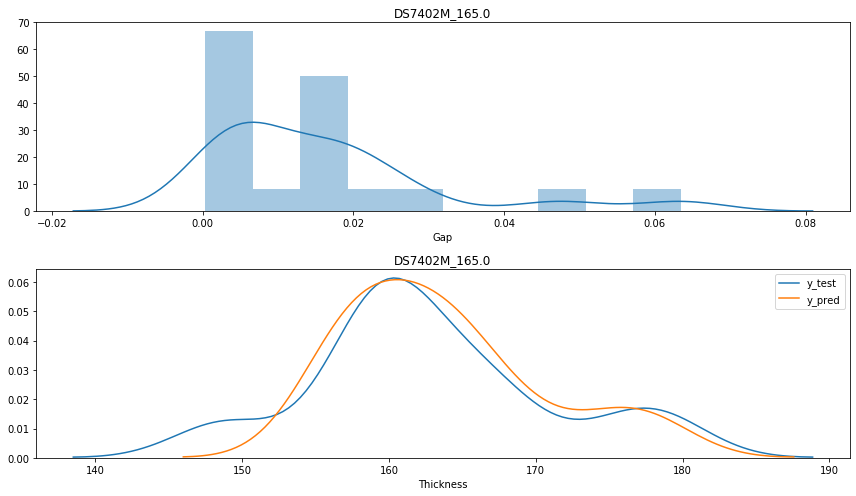

--------------------------------------------------
DS7402M_31.0's Avg Error rate: 0.06979941967809851


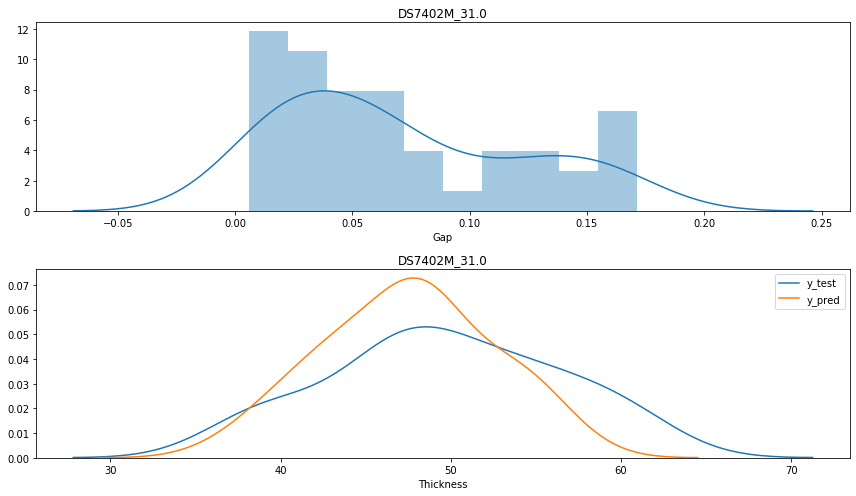

--------------------------------------------------
DS7402M_103.8's Avg Error rate: 0.019869145503183767


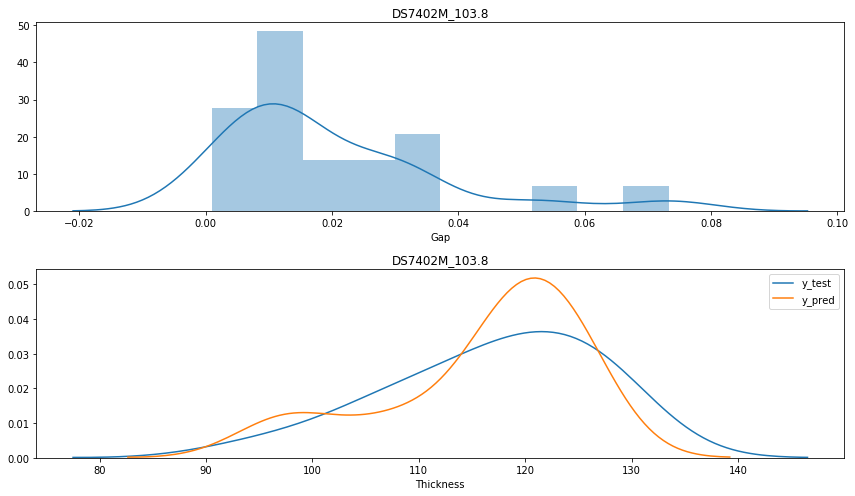

--------------------------------------------------
DS7402M_24.4's Avg Error rate: 0.09098095110217522


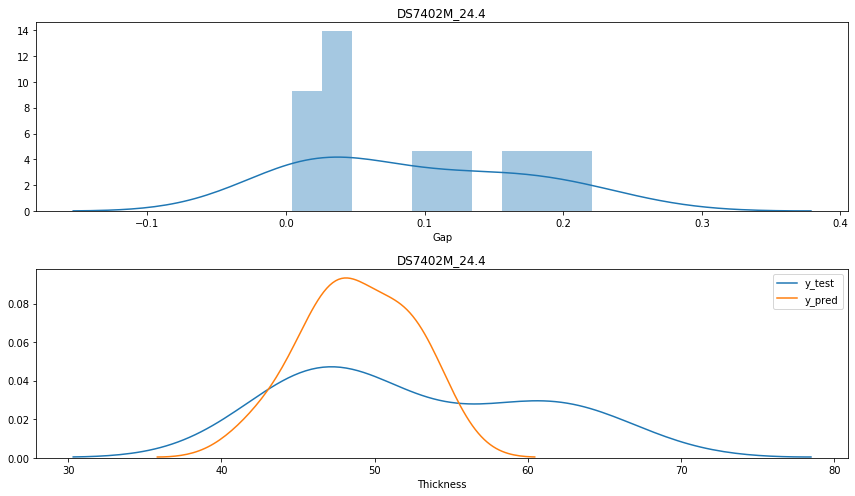

--------------------------------------------------
NPG-151_46.8's Avg Error rate: 0.04011720451366363


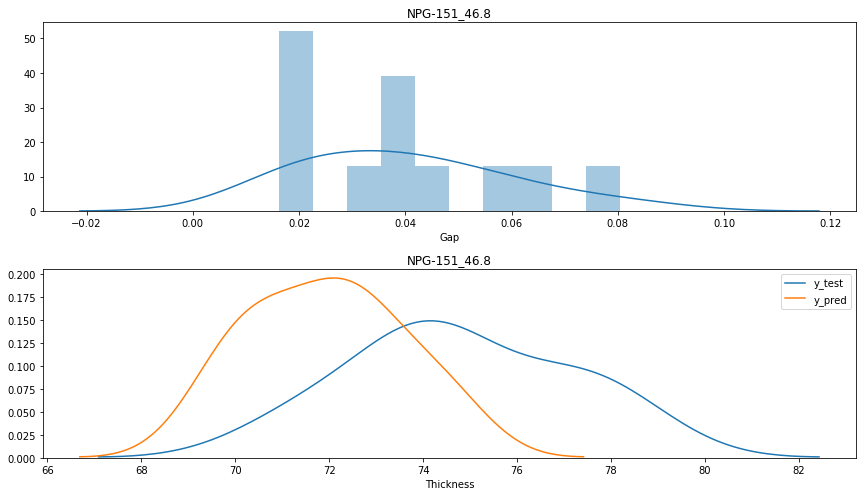

--------------------------------------------------
NPG-151_0.0's Avg Error rate: 0.021816966008810307


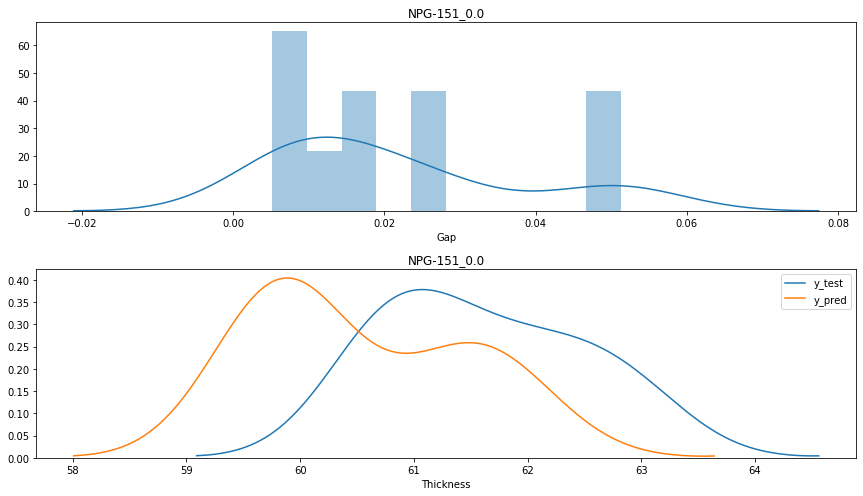

--------------------------------------------------
EM-370Z_46.8's Avg Error rate: 0.03236387350459138


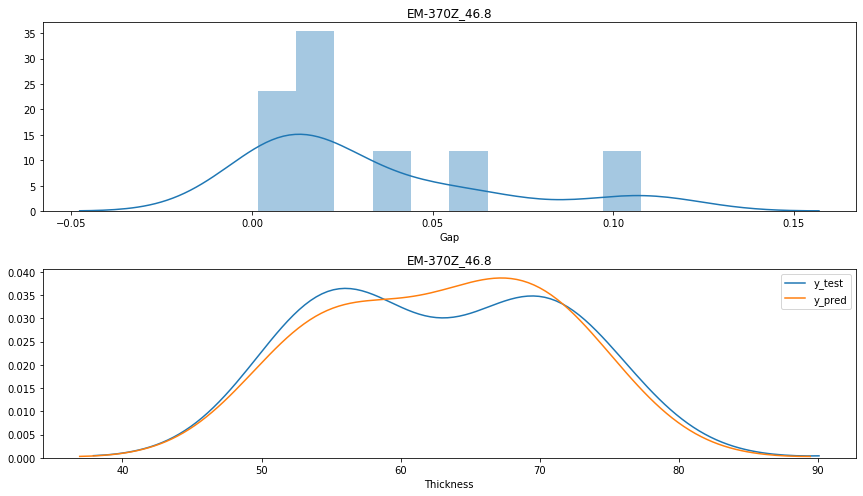

--------------------------------------------------
EM-370Z_48.0's Avg Error rate: 0.01040086563300433


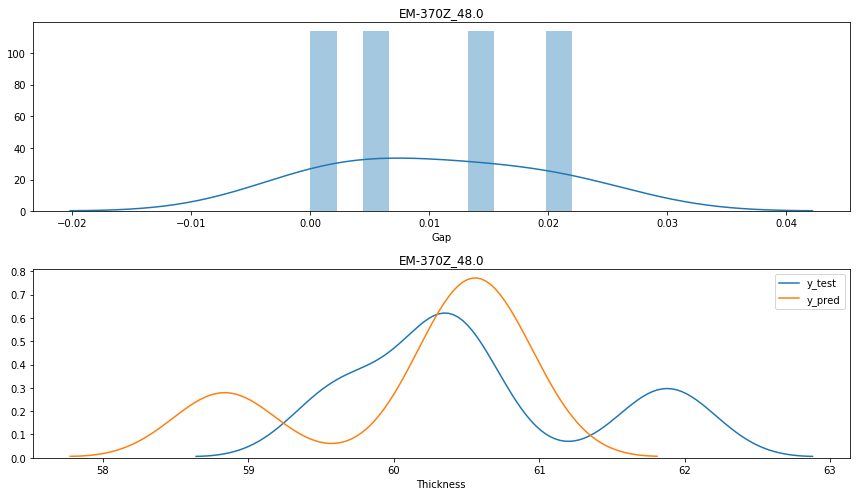

--------------------------------------------------
EM-370Z_103.8's Avg Error rate: 0.01353676753036179


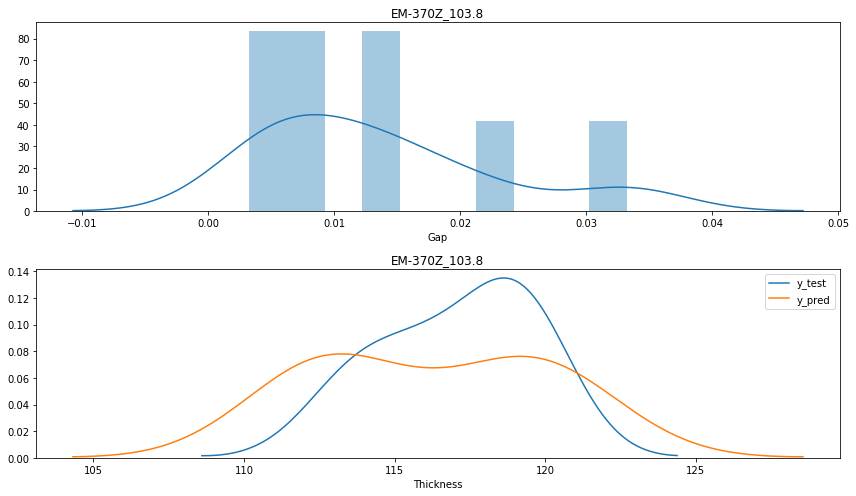

--------------------------------------------------
EM-370Z_81.4's Avg Error rate: 0.02079533204129307


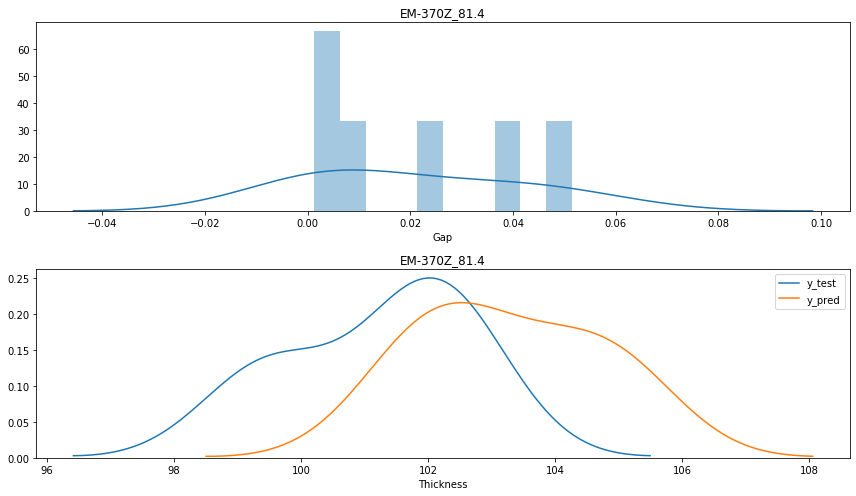

--------------------------------------------------
EM-370Z_31.0's Avg Error rate: 0.06959863753094774


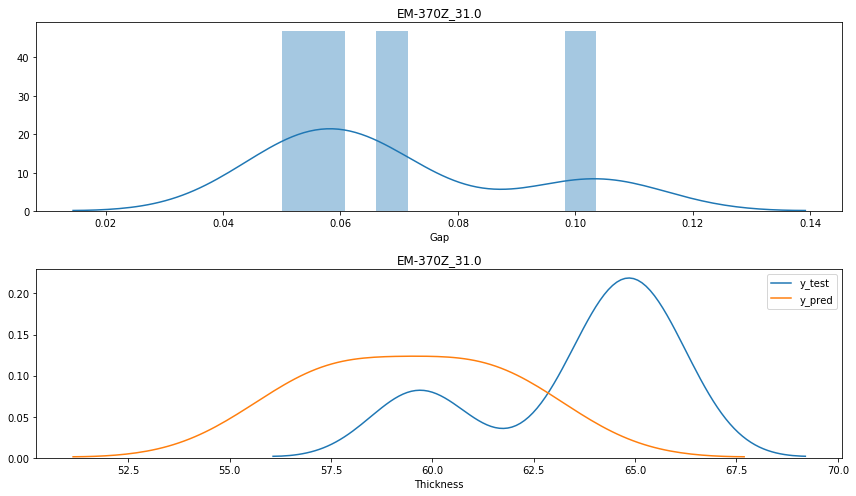

--------------------------------------------------
EM-370Z_0.0's Avg Error rate: 0.04161798928436879


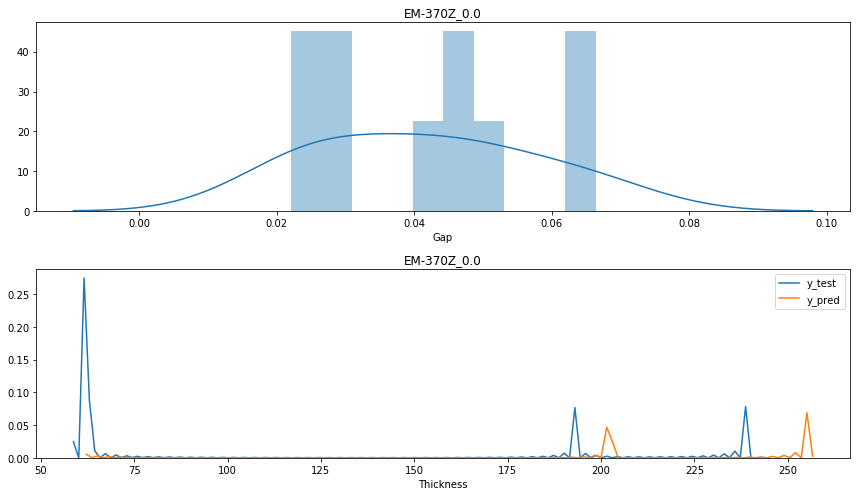

--------------------------------------------------
DS7402LC_31.0's Avg Error rate: 0.07282971763971922


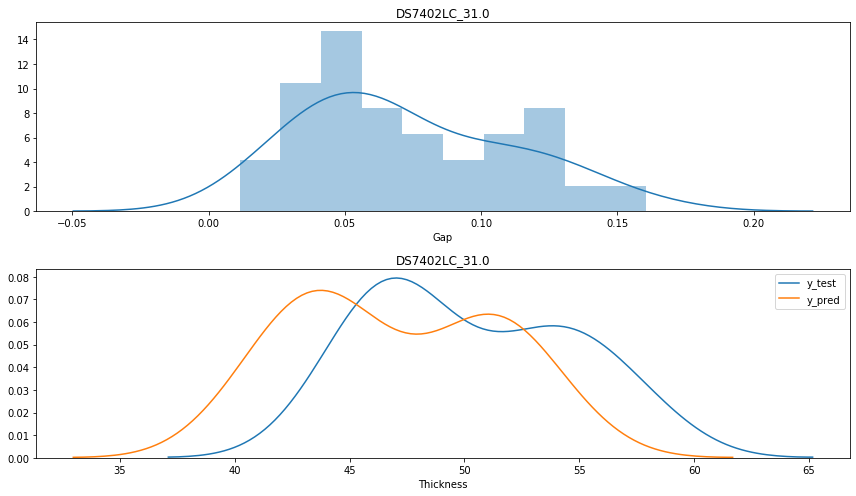

--------------------------------------------------
DS7402LC_0.0's Avg Error rate: 0.019227237794769248


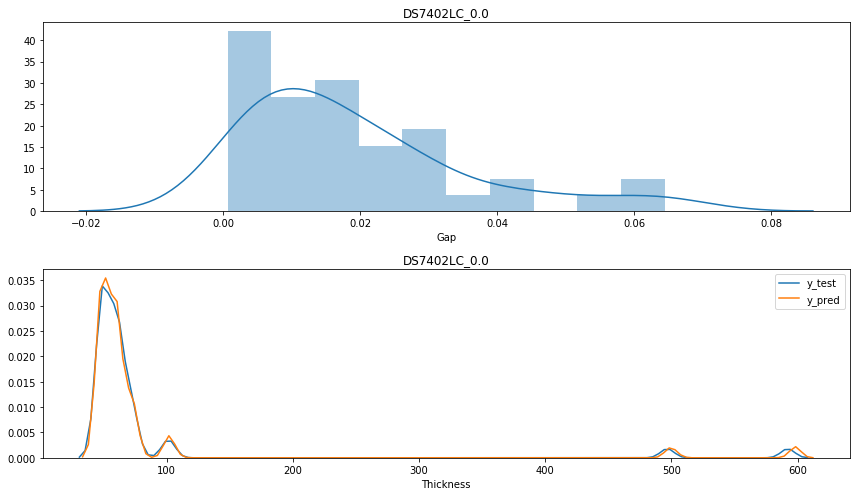

--------------------------------------------------
DS7402LC_103.8's Avg Error rate: 0.018587364541903507


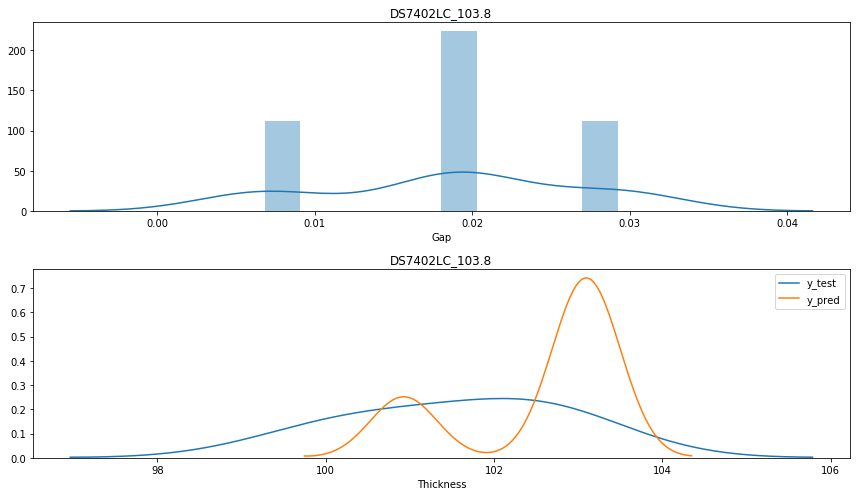

--------------------------------------------------
DS7402LC_46.8's Avg Error rate: 0.039032323248909664


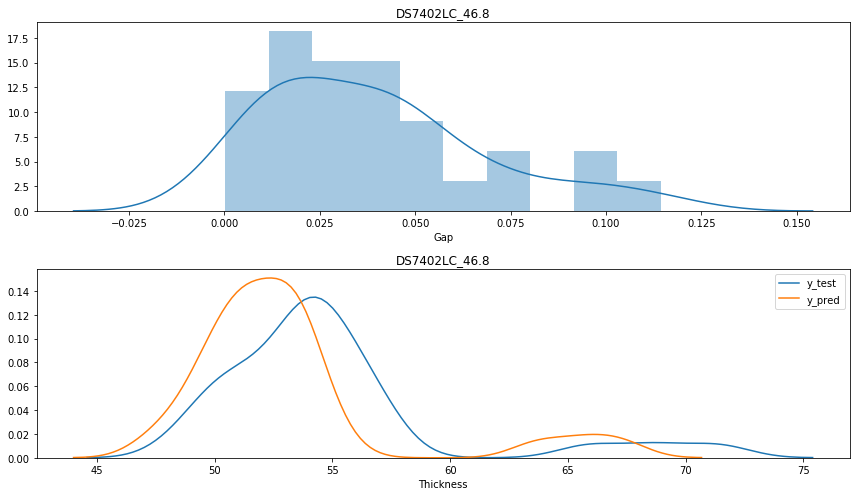

--------------------------------------------------
DS7402LC_24.4's Avg Error rate: 0.060277829001347843


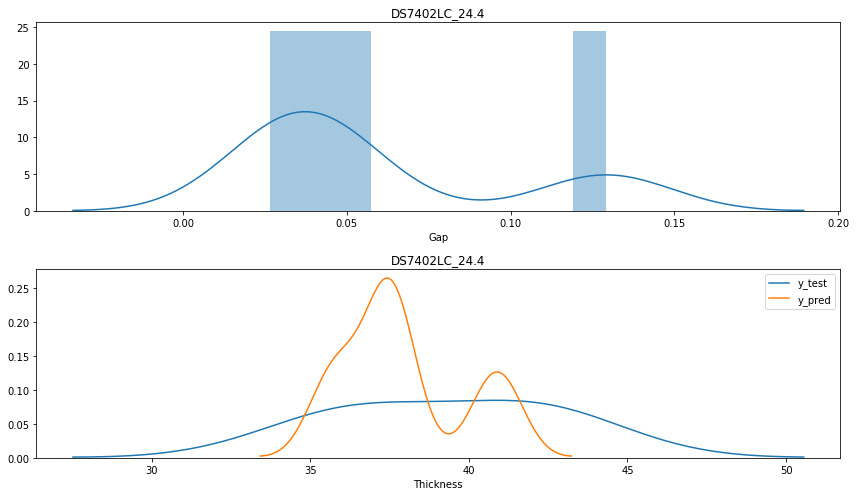

--------------------------------------------------
DS7402LC_81.4's Avg Error rate: 0.03293727746213737


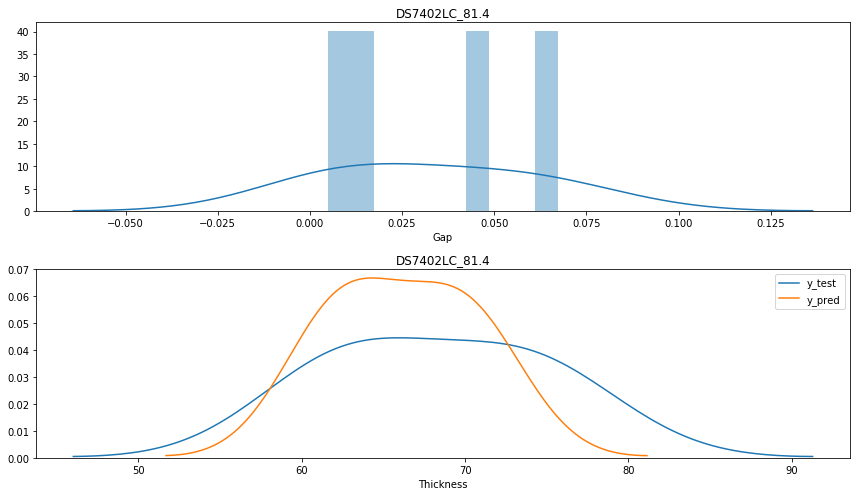

--------------------------------------------------
DS7402LC_165.0's Avg Error rate: 0.017665428047310375


C:\Users\Samsung\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning:

Data must have variance to compute a kernel density estimate.



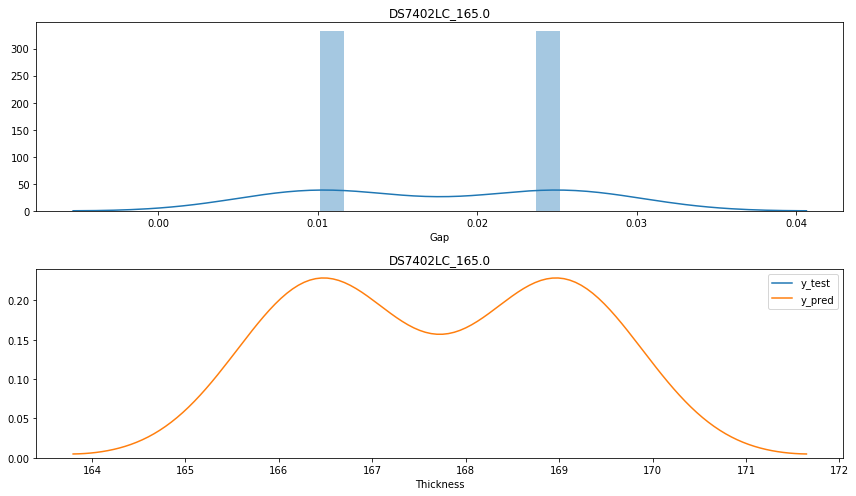

--------------------------------------------------
IT150G_46.8's Avg Error rate: 0.046717029291790946


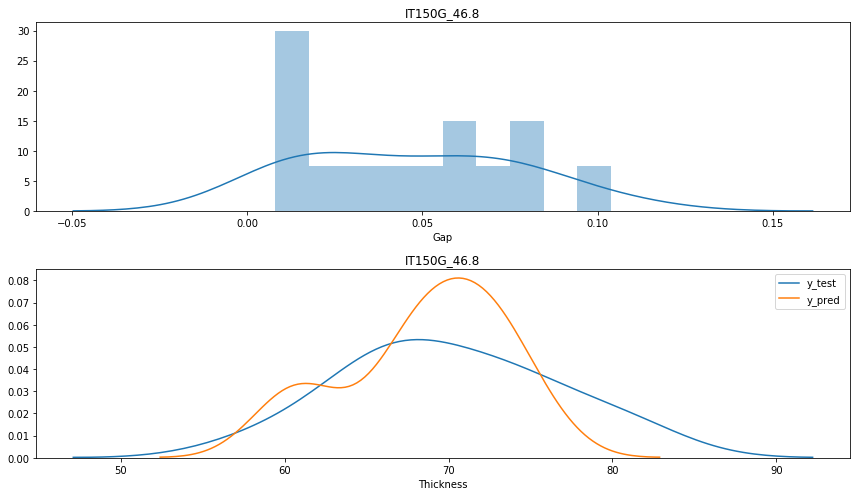

--------------------------------------------------
IT150G_0.0's Avg Error rate: 0.028682473627882364


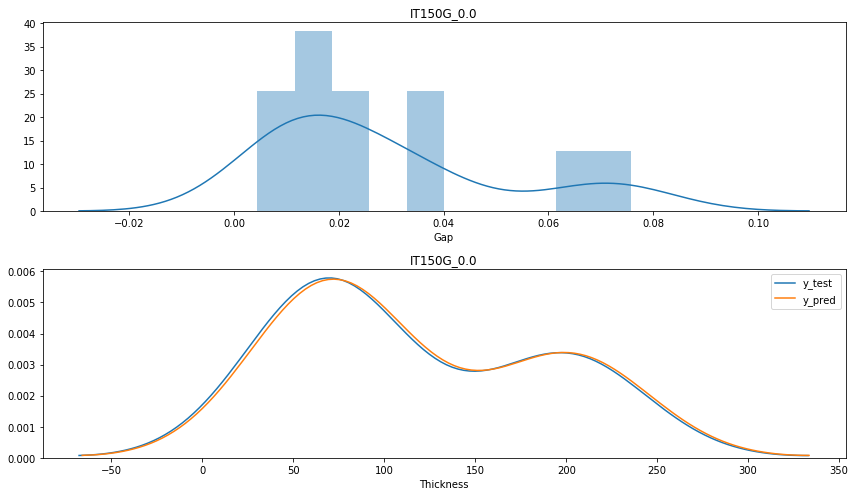

--------------------------------------------------
IT150G_203.4's Avg Error rate: 0.017048990165473506


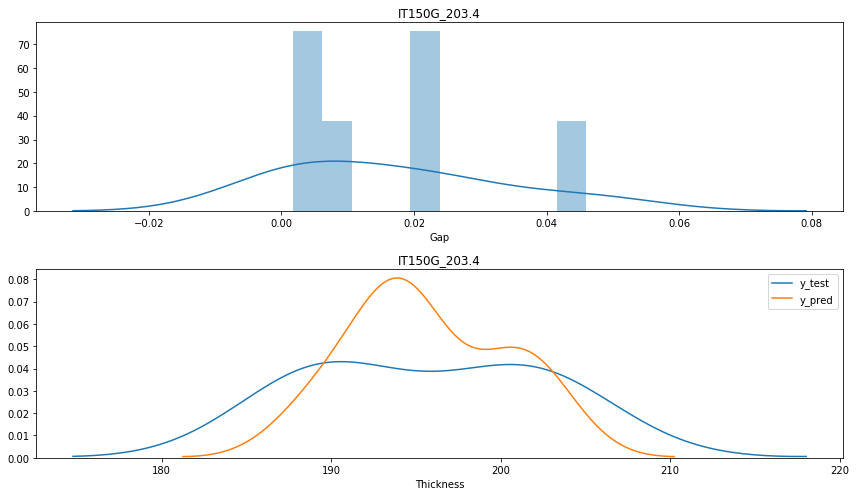

--------------------------------------------------
EM-526_46.8's Avg Error rate: 0.04682276313951623


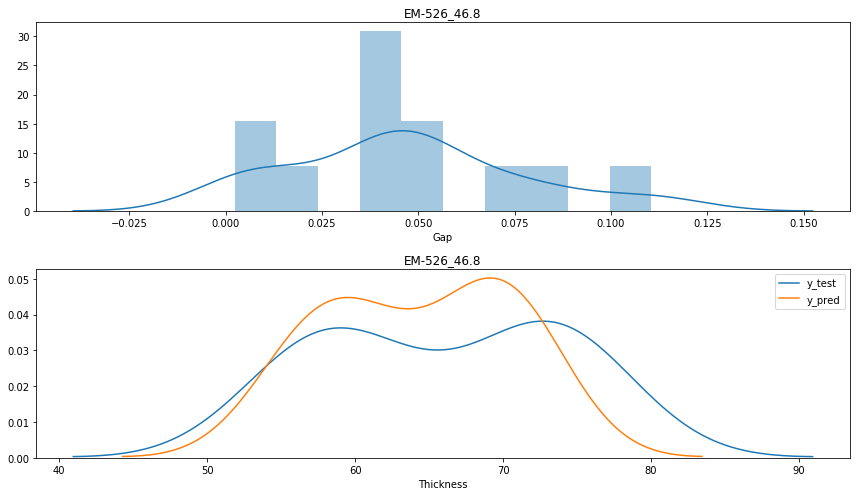

--------------------------------------------------
EM-526_0.0's Avg Error rate: 0.0329220744484798


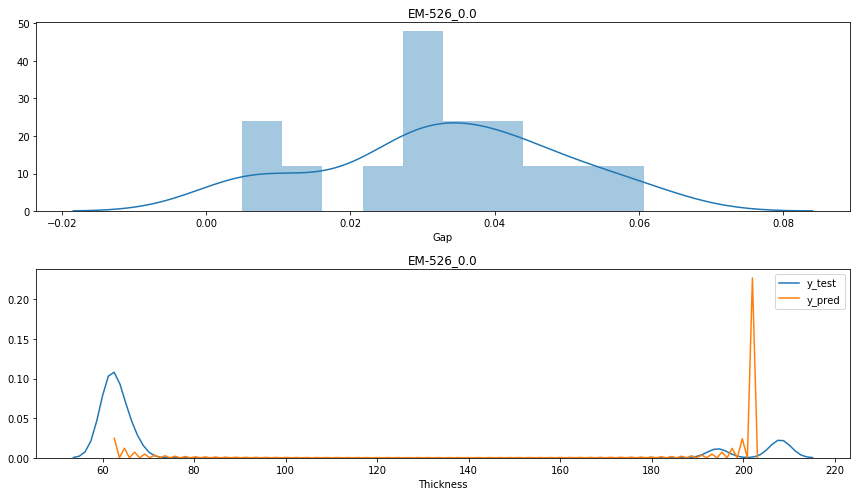

--------------------------------------------------
EM-526_103.8's Avg Error rate: 0.043186769617326516


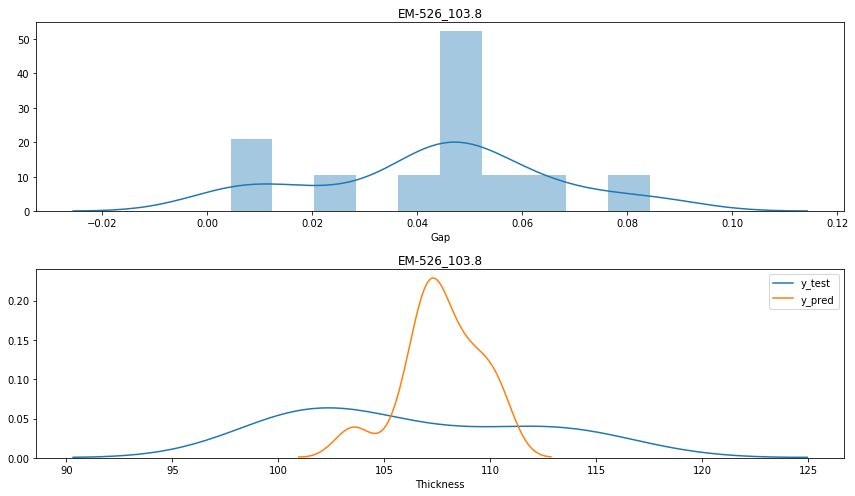

--------------------------------------------------


In [47]:
ta_ma = tar_total["Maker"].unique()
maker_,glass_,error_hist,error_rate = [],[],[],[]
for ma in ta_ma:
    df_ma = tar_total[tar_total["Maker"]==ma]
    ta_gl = df_ma["Glass"].unique()
    for gl in ta_gl:
        df_ = df_ma[df_ma["Glass"]==gl]
        maker_.append(ma)
        glass_.append(gl)
        error_hist.append(df_["error_rate"])
        error_rate.append(df_["error_rate"].mean())
        
        print("{}_{}'s Avg Error rate: {}".format(ma,gl,df_["error_rate"].mean()))

        plt.figure(figsize=(12, 7))
        plt.subplot(2,1,1)
        sns.distplot(df_["error_rate"],hist=True,label="{}_{}".format(ma,gl),bins=10)
        plt.xlabel("Gap")
        #plt.xlim([-40,40])
        plt.title("{}_{}".format(ma,gl))

        plt.subplot(2,1,2)
        sns.distplot(df_["actual"],hist=False, label="y_test")
        sns.distplot(df_["pred_"],hist=False,  label="y_pred")
        plt.xlabel("Thickness")
        plt.title("{}_{}".format(ma,gl))
        plt.tight_layout()
        plt.show()

        
        print("-"*50)

In [48]:
ann_total_result = pd.DataFrame([maker_,glass_,error_rate]).T.rename(columns={0:"Maker",1:"Glass",2:"Avg_Error"})
ann_total_result.to_excel(r"C:\Users\Samsung\jupyter\Project_PCB\result\0217\ANN_total_avg_error.xlsx")
ann_total_result.head()

,Maker,Glass,Avg_Error
0,DS7402M,46.8,0.0495033
1,DS7402M,0.0,0.0222601
2,DS7402M,203.4,0.0261991
3,DS7402M,81.4,0.0210929
4,DS7402M,165.0,0.0162207


### LR

In [49]:
tar_total = default_LR_total

tar_total["error_rate"] = tar_total.apply(lambda x : error_abs(x["pred_"],x["actual"]),axis=1)
tar_total.head()

,Model,Maker,Glass,pred_,actual,error_rate
0,1,DS7402M,46.8,65.1521,67.7,0.039107
1,1,DS7402M,0.0,74.0854,73.71,0.005067
2,1,DS7402M,203.4,203.692,187.25,0.080719
3,1,DS7402M,0.0,74.9981,77.47,0.032959
4,1,DS7402M,81.4,88.7855,80.48,0.093546


In [50]:
### CCL 예측기의 평균오차
ccl_1 = tar_total[tar_total["Glass"]=="0.0"]["error_rate"]
ccl_1.mean()

0.023608868723488715

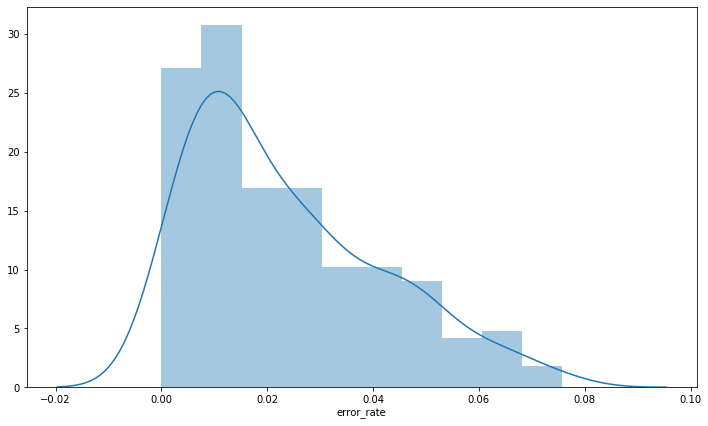

In [51]:
plt.figure(figsize=(12, 7))
sns.distplot(ccl_1,hist=True,label="y_test")

In [52]:
tar_total.head()

,Model,Maker,Glass,pred_,actual,error_rate
0,1,DS7402M,46.8,65.1521,67.7,0.039107
1,1,DS7402M,0.0,74.0854,73.71,0.005067
2,1,DS7402M,203.4,203.692,187.25,0.080719
3,1,DS7402M,0.0,74.9981,77.47,0.032959
4,1,DS7402M,81.4,88.7855,80.48,0.093546


DS7402M_46.8's Avg Error rate: 0.08902926596959487


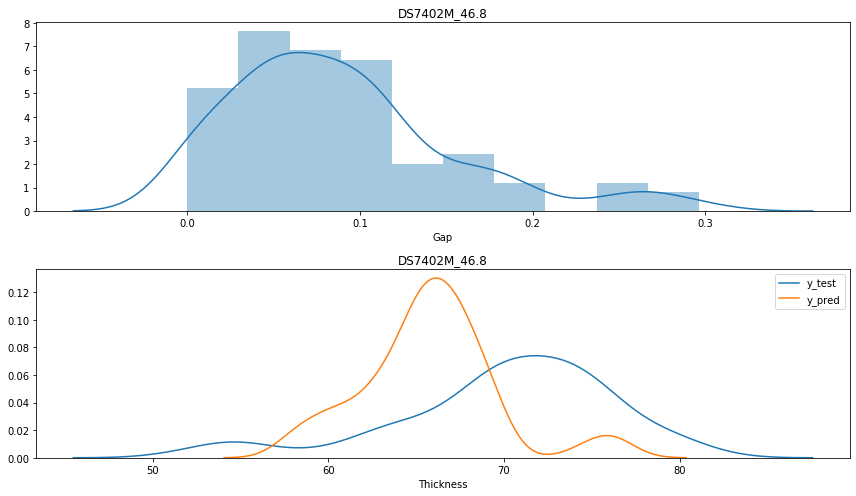

--------------------------------------------------
DS7402M_0.0's Avg Error rate: 0.022260133494642374


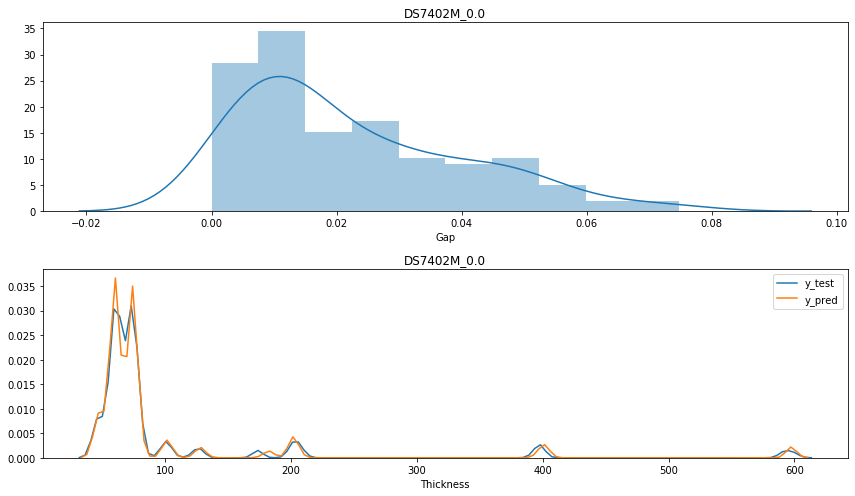

--------------------------------------------------
DS7402M_203.4's Avg Error rate: 0.03305564985652207


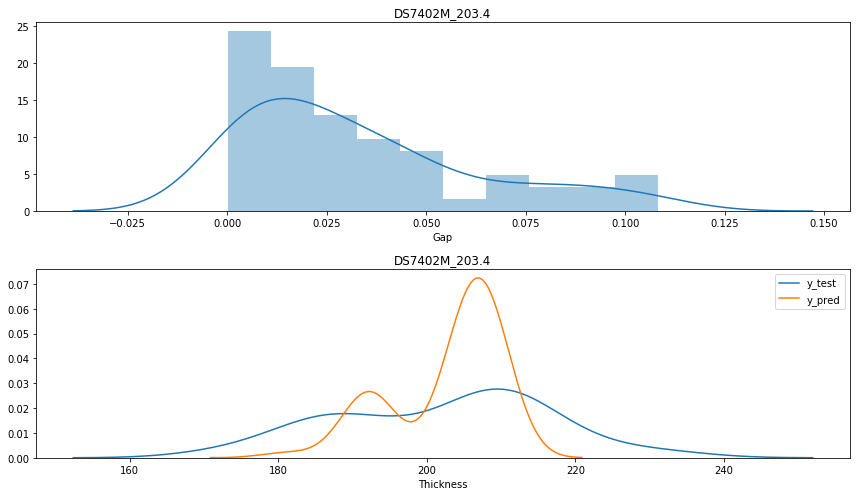

--------------------------------------------------
DS7402M_81.4's Avg Error rate: 0.09655202775694097


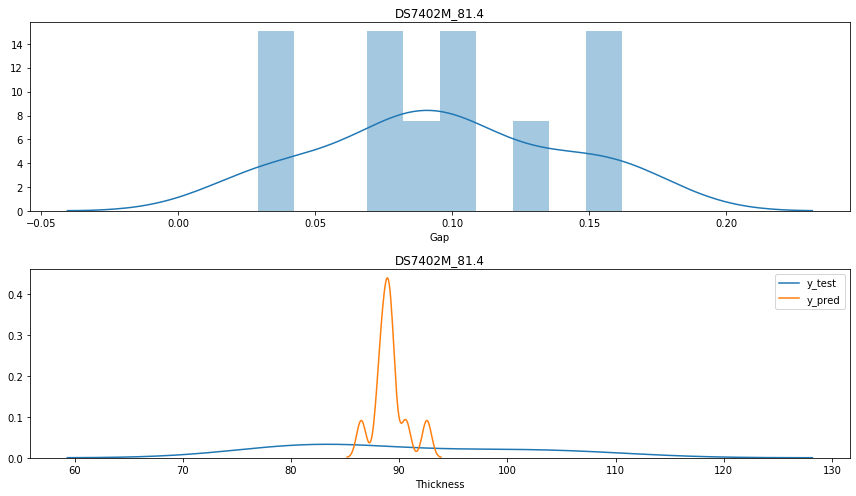

--------------------------------------------------
DS7402M_165.0's Avg Error rate: 0.030884588028132168


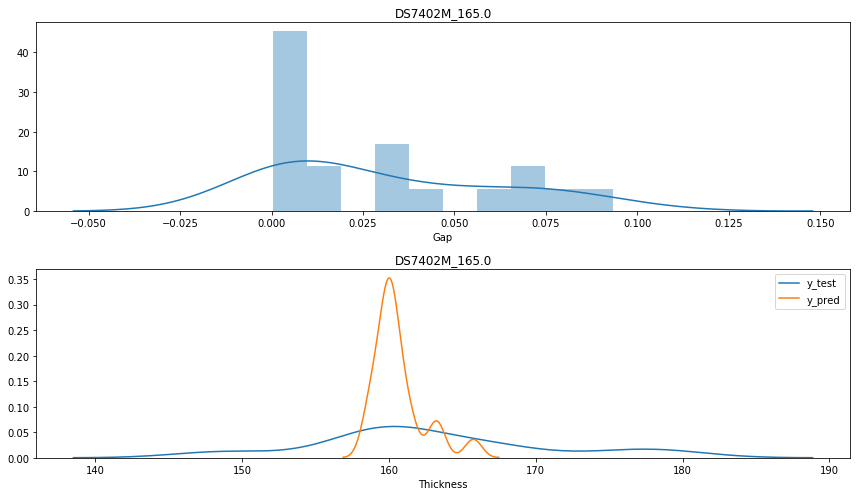

--------------------------------------------------
DS7402M_31.0's Avg Error rate: 0.08950818428055995


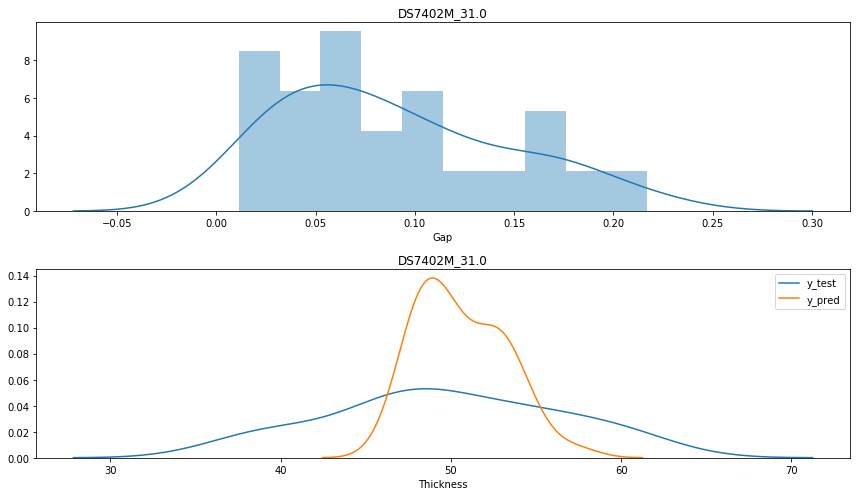

--------------------------------------------------
DS7402M_103.8's Avg Error rate: 0.09980456829344694


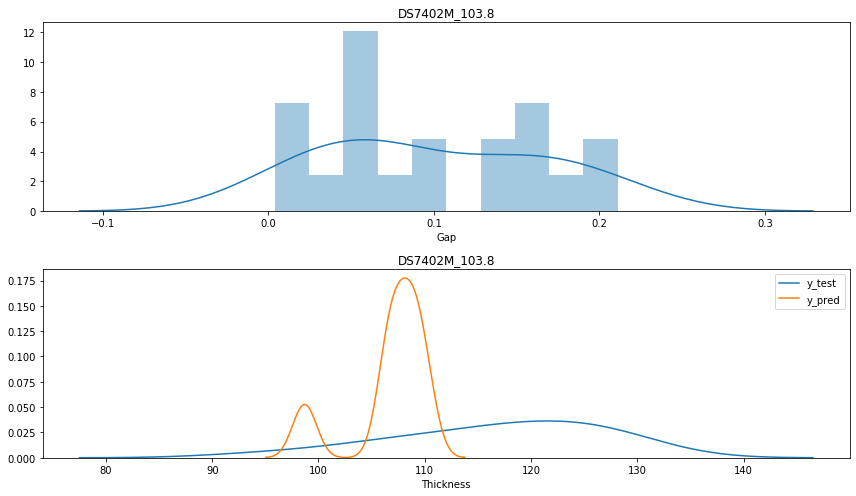

--------------------------------------------------
DS7402M_24.4's Avg Error rate: 0.09323874530922648


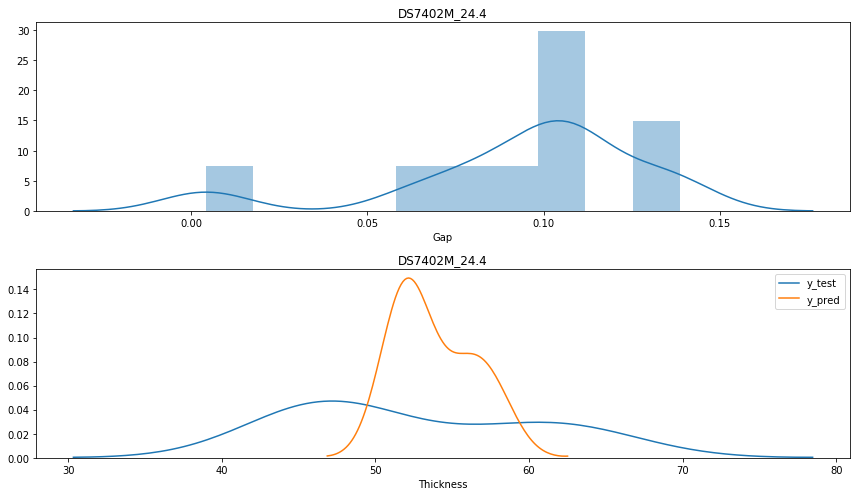

--------------------------------------------------
NPG-151_46.8's Avg Error rate: 0.01600736381024379


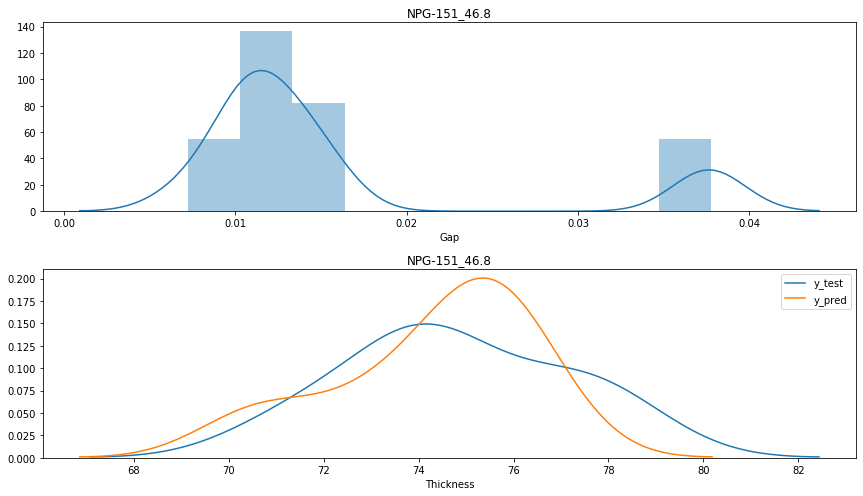

--------------------------------------------------
NPG-151_0.0's Avg Error rate: 0.021816966008810307


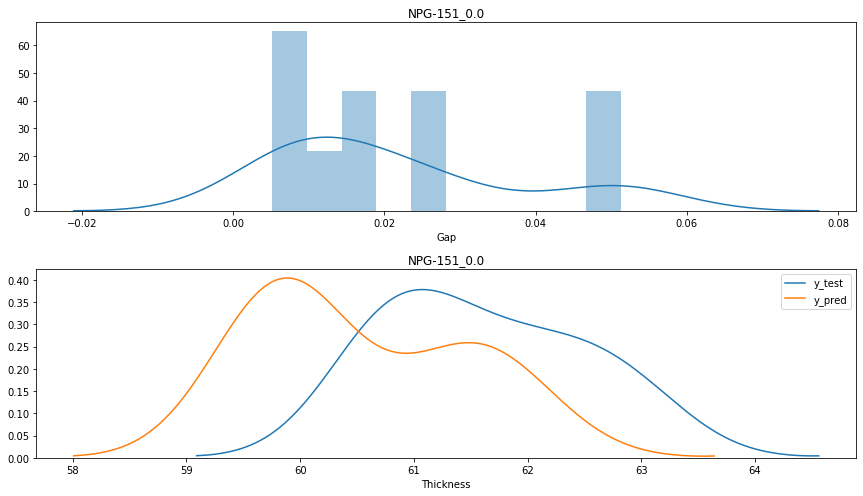

--------------------------------------------------
EM-370Z_46.8's Avg Error rate: 0.10290620080199586


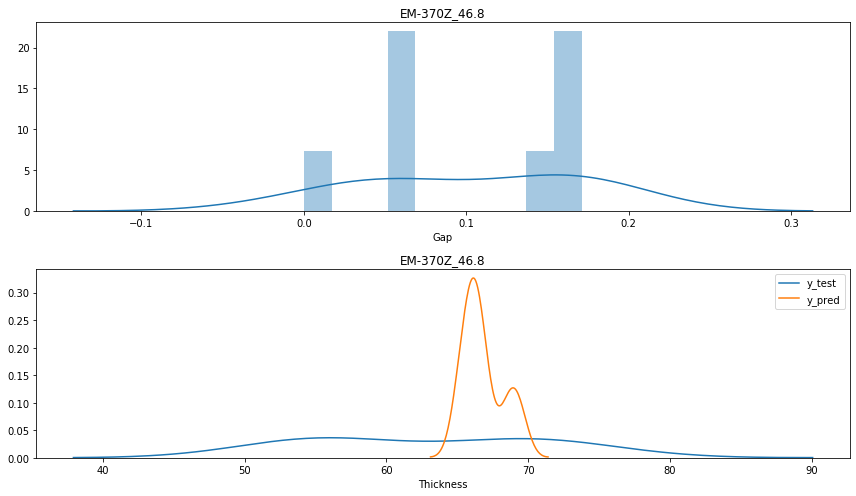

--------------------------------------------------
EM-370Z_48.0's Avg Error rate: 0.01040086563300433


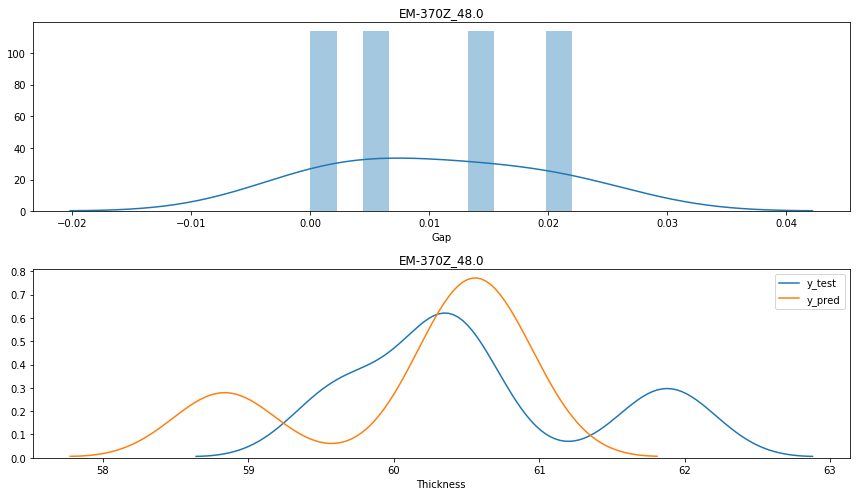

--------------------------------------------------
EM-370Z_103.8's Avg Error rate: 0.041740893802015934


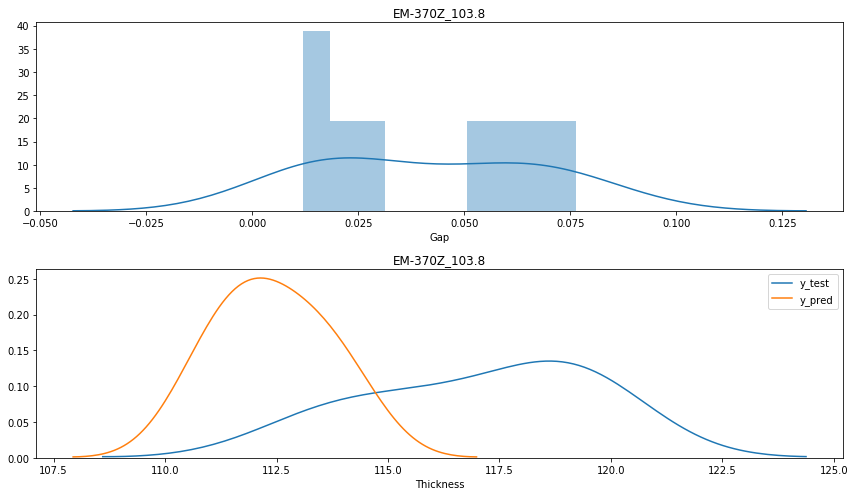

--------------------------------------------------
EM-370Z_81.4's Avg Error rate: 0.01747159206188174


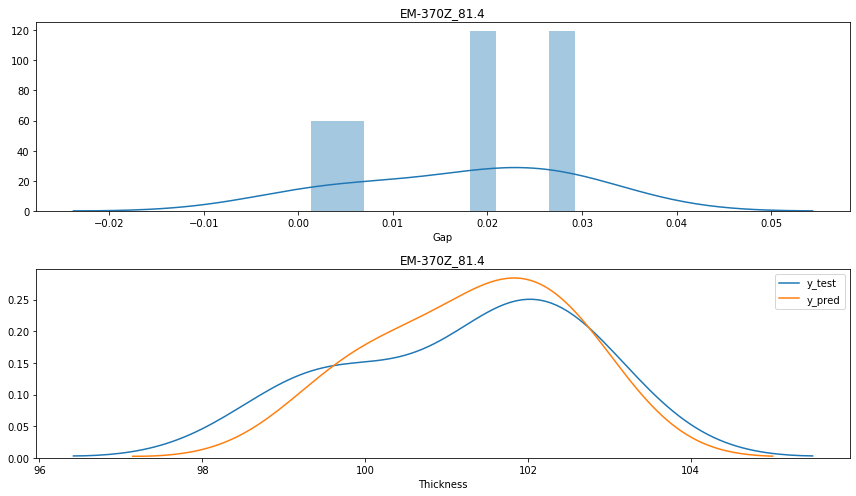

--------------------------------------------------
EM-370Z_31.0's Avg Error rate: 0.07982212534999858


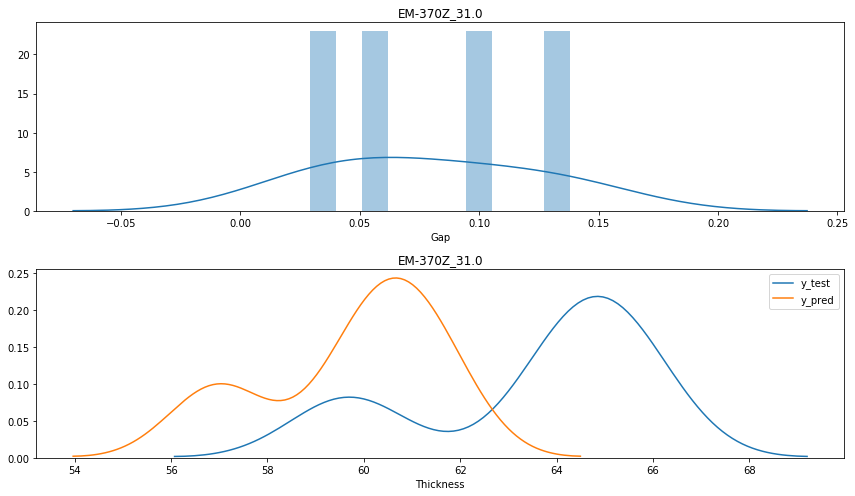

--------------------------------------------------
EM-370Z_0.0's Avg Error rate: 0.04161798928436879


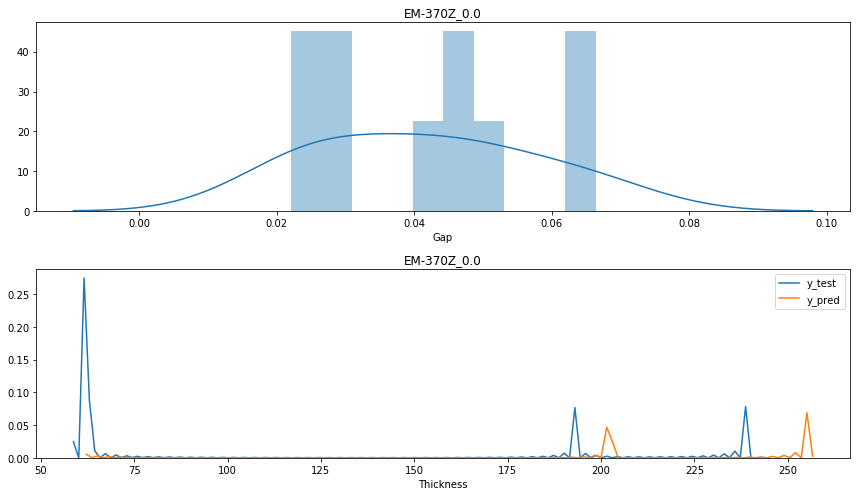

--------------------------------------------------
DS7402LC_31.0's Avg Error rate: 0.06298290455098027


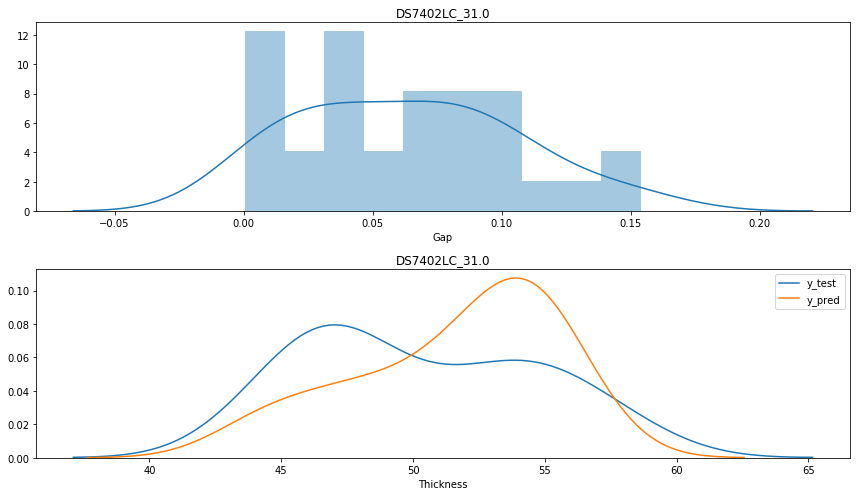

--------------------------------------------------
DS7402LC_0.0's Avg Error rate: 0.019227237794769248


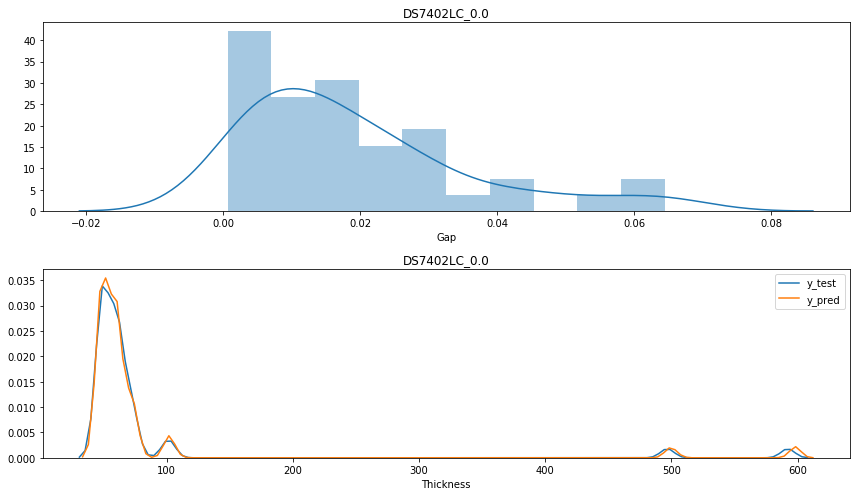

--------------------------------------------------
DS7402LC_103.8's Avg Error rate: 0.03375195240349165


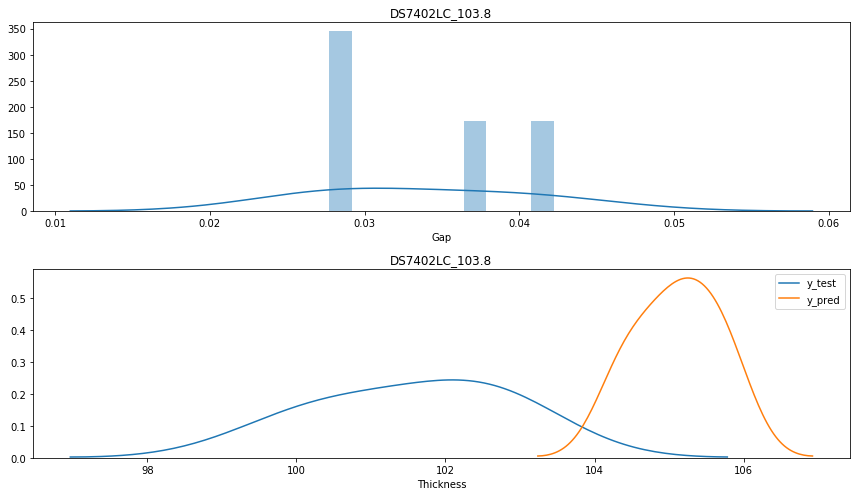

--------------------------------------------------
DS7402LC_46.8's Avg Error rate: 0.12644282331643025


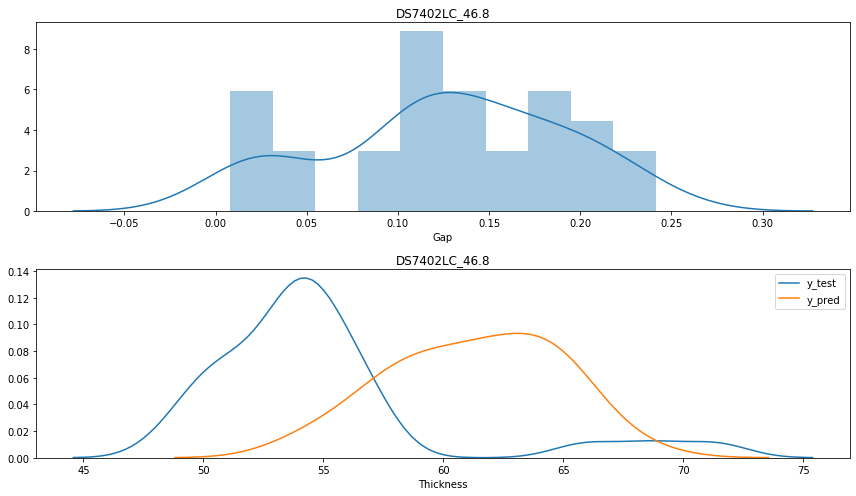

--------------------------------------------------
DS7402LC_24.4's Avg Error rate: 0.23180801850682478


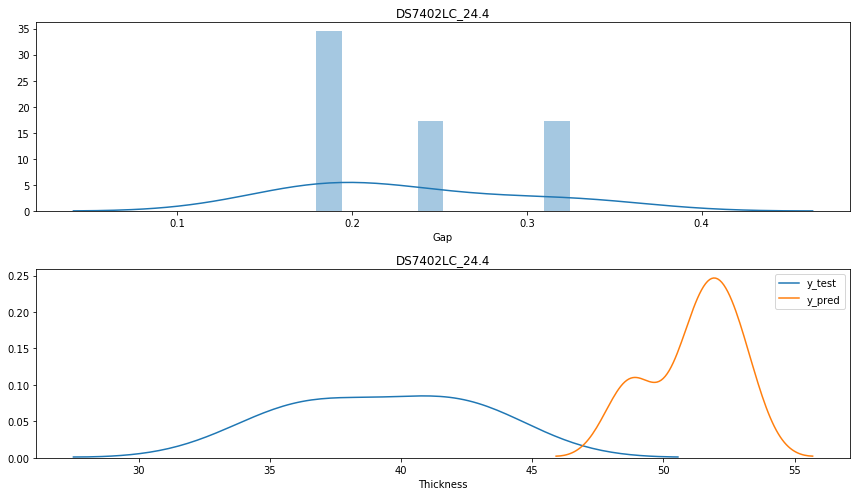

--------------------------------------------------
DS7402LC_81.4's Avg Error rate: 0.19118546752056342


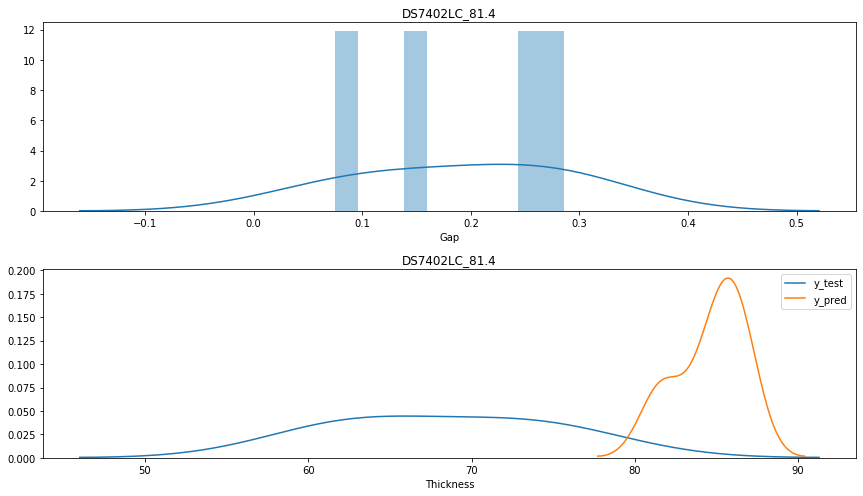

--------------------------------------------------
DS7402LC_165.0's Avg Error rate: 0.030251657995122347


C:\Users\Samsung\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning:

Data must have variance to compute a kernel density estimate.



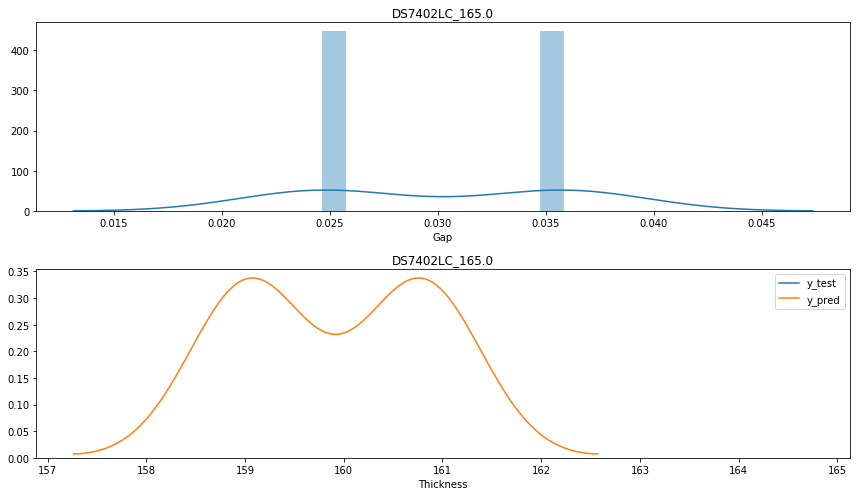

--------------------------------------------------
IT150G_46.8's Avg Error rate: 0.0669518550565795


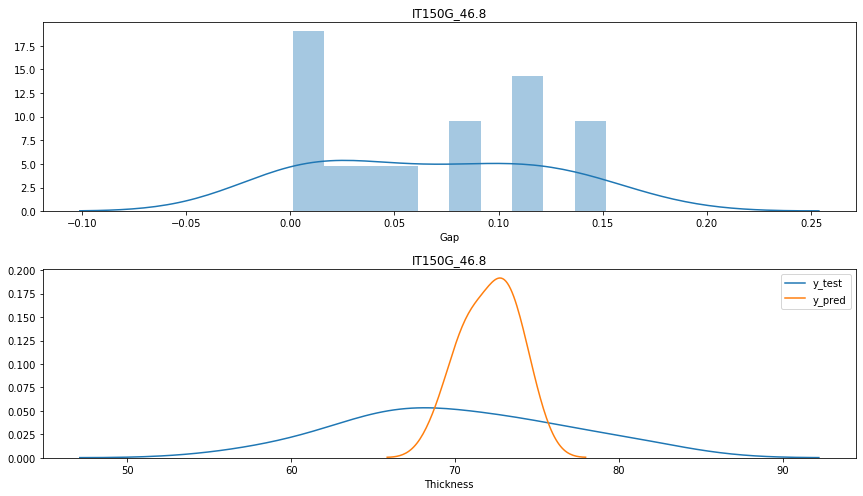

--------------------------------------------------
IT150G_0.0's Avg Error rate: 0.028682473627882364


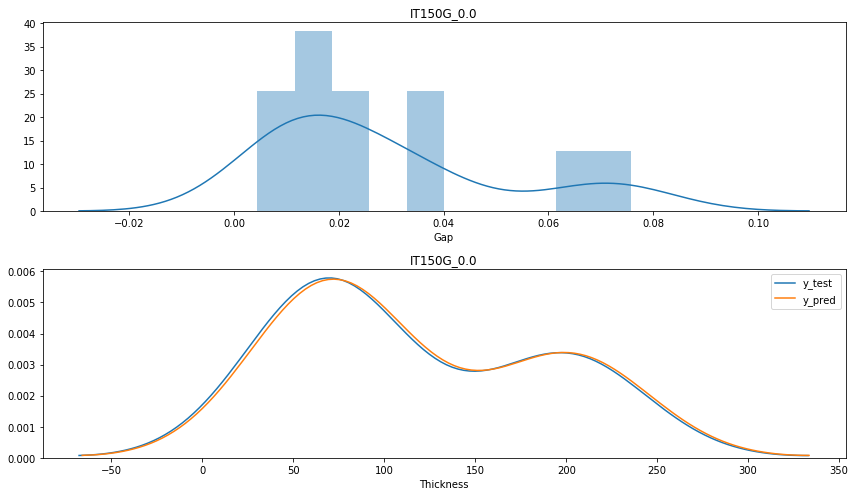

--------------------------------------------------
IT150G_203.4's Avg Error rate: 0.07826675585255875


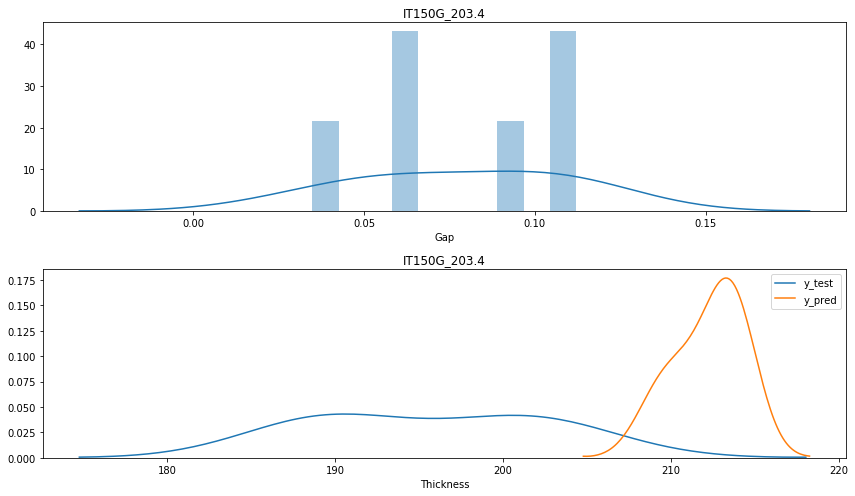

--------------------------------------------------
EM-526_46.8's Avg Error rate: 0.09586050479441947


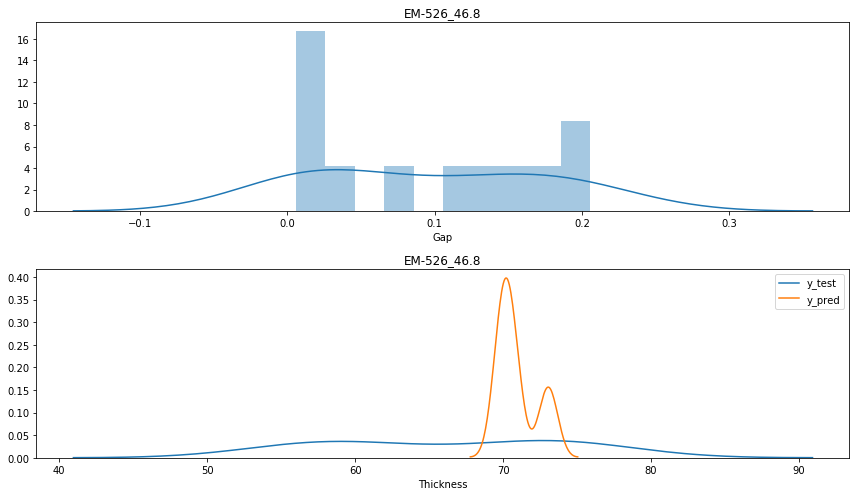

--------------------------------------------------
EM-526_0.0's Avg Error rate: 0.0329220744484798


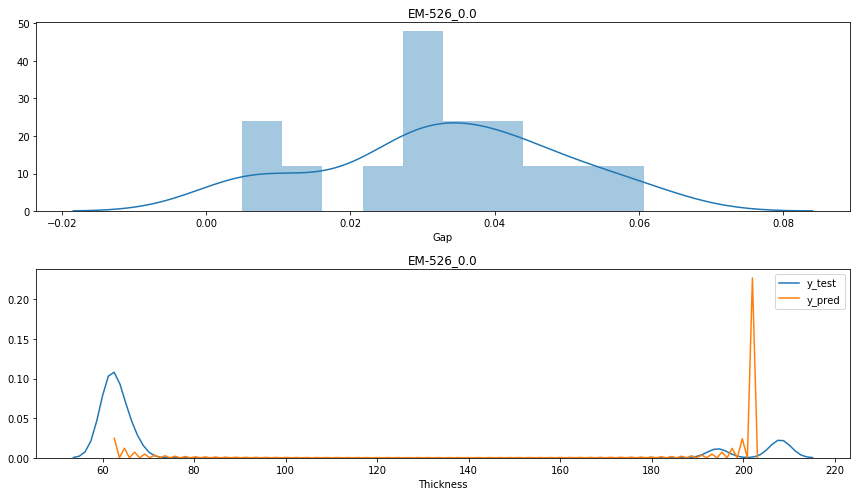

--------------------------------------------------
EM-526_103.8's Avg Error rate: 0.061191932968606276


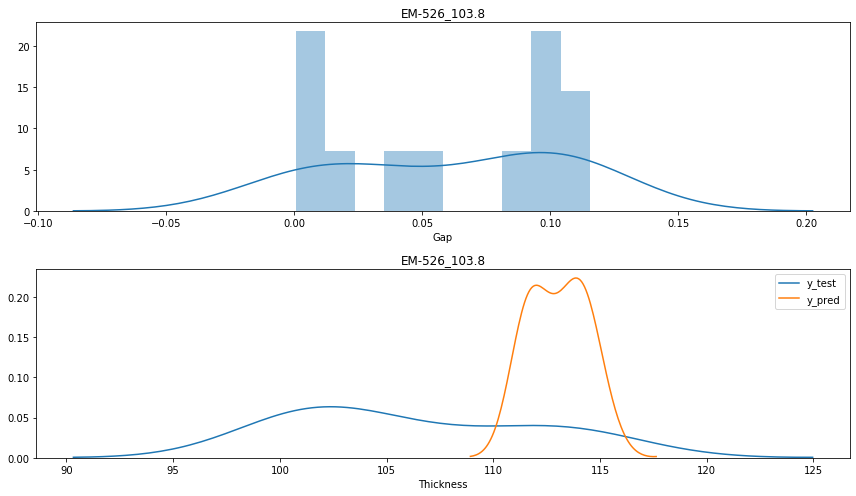

--------------------------------------------------


In [53]:
ta_ma = tar_total["Maker"].unique()
maker_,glass_,error_hist,error_rate = [],[],[],[]
for ma in ta_ma:
    df_ma = tar_total[tar_total["Maker"]==ma]
    ta_gl = df_ma["Glass"].unique()
    for gl in ta_gl:
        df_ = df_ma[df_ma["Glass"]==gl]
        maker_.append(ma)
        glass_.append(gl)
        error_hist.append(df_["error_rate"])
        error_rate.append(df_["error_rate"].mean())
        
        print("{}_{}'s Avg Error rate: {}".format(ma,gl,df_["error_rate"].mean()))

        plt.figure(figsize=(12, 7))
        plt.subplot(2,1,1)
        sns.distplot(df_["error_rate"],hist=True,label="{}_{}".format(ma,gl),bins=10)
        plt.xlabel("Gap")
        #plt.xlim([-40,40])
        plt.title("{}_{}".format(ma,gl))

        plt.subplot(2,1,2)
        sns.distplot(df_["actual"],hist=False, label="y_test")
        sns.distplot(df_["pred_"],hist=False,  label="y_pred")
        plt.xlabel("Thickness")
        plt.title("{}_{}".format(ma,gl))
        plt.tight_layout()
        plt.show()

        
        print("-"*50)

In [54]:
lr_total_result = pd.DataFrame([maker_,glass_,error_rate]).T.rename(columns={0:"Maker",1:"Glass",2:"Avg_Error"})
lr_total_result.to_excel(r"C:\Users\Samsung\jupyter\Project_PCB\result\0217\LR_total_avg_error.xlsx")
lr_total_result.head()

,Maker,Glass,Avg_Error
0,DS7402M,46.8,0.0890293
1,DS7402M,0.0,0.0222601
2,DS7402M,203.4,0.0330556
3,DS7402M,81.4,0.096552
4,DS7402M,165.0,0.0308846


### 2.2 pp data 만들기

In [55]:
### 이번에는 pp층만 불러오기
data_pp = data_drop[data_drop["PP"]==1]
data_pp.head()

,Model,LayerNum,PP,MatlMaker,RC,MatlG,Cu1,CP1,Cu2,CP2,Input_T,Thickness
0,1,1,1,DS7402M,61.0,46.8,8.37,55,14.29,73,60,66.19
2,1,3,1,DS7402M,47.0,203.4,15.04,56,15.04,46,200,196.32
4,1,5,1,DS7402M,53.0,81.4,15.04,75,15.04,48,90,82.26
6,1,7,1,DS7402M,53.0,81.4,14.58,48,14.58,75,90,80.48
8,1,9,1,DS7402M,47.0,203.4,15.80,50,15.04,60,200,202.85


In [56]:
data_pp.drop(columns=["PP","MatlMaker","Model","MatlG"]).head()

,LayerNum,RC,Cu1,CP1,Cu2,CP2,Input_T,Thickness
0,1,61.0,8.37,55,14.29,73,60,66.19
2,3,47.0,15.04,56,15.04,46,200,196.32
4,5,53.0,15.04,75,15.04,48,90,82.26
6,7,53.0,14.58,48,14.58,75,90,80.48
8,9,47.0,15.80,50,15.04,60,200,202.85


In [57]:
### 사용자함수: 기본 통계값을 산출해주는 함수
def print_statis(y_pred,y_test):
    rsqr_ = rsq(y_pred,y_test)
    min_ = round(min(abs(y_test - y_pred)),3)
    max_ = round(max(abs(y_test - y_pred)),3)
    mean_ = round((abs(y_test - y_pred)).mean(),3)
    std_ = round(statistics.stdev(y_test - y_pred),3)
    print("R SQR :" , rsqr_)        
    print("Min :" , min_)
    print("Max :" , max_)
    print("Mean : " , mean_)
    print("Std : ", std_)

In [58]:
def linear_reg(i,j,X_train,y_train,X_test,y_test):
    """
    i: Maker이름
    j: Glass이름
    나머지= data
    """

    tf.keras.backend.clear_session()

    
    globals()['LR_{}_{}'.format(i,str(j).replace(".","_"))] = linear_model.LinearRegression()
    globals()['LR_{}_{}'.format(i,str(j).replace(".","_"))].fit(X_train, y_train)

    y_pred = globals()['LR_{}_{}'.format(i,str(j).replace(".","_"))].predict(X_test)

    rsqr_ = rsq(y_pred,y_test)

    mse_ = mean_squared_error(y_test, y_pred)

    min_ = round(min(abs(y_test - y_pred)),3)
    max_ = round(max(abs(y_test - y_pred)),3)
    mean_ = round((abs(y_test - y_pred)).mean(),3)
    std_ = round(statistics.stdev(y_test - y_pred),3)
    return rsqr_,mse_,y_test,y_pred,[min_,max_,mean_,std_]

In [59]:
def ann_model(i,j,X_train,y_train,X_test,y_test):
    """
    i: Maker이름
    j: Glass이름
    나머지= data
    """

    tf.keras.backend.clear_session()
    

    globals()['ANN_{}_{}'.format(i,str(j).replace(".","_"))] = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=[len(X_train.keys())]),
        layers.Dense(64, activation='relu'),
        layers.Dense(1)
      ])

    optimizer = tf.keras.optimizers.RMSprop(0.001)

    globals()['ANN_{}_{}'.format(i,str(j).replace(".","_"))].compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])

    history = globals()['ANN_{}_{}'.format(i,str(j).replace(".","_"))].fit(X_train, y_train, epochs=300,verbose=0)
    

    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch
    

    loss_, mae_, mse_ = globals()['ANN_{}_{}'.format(i,str(j).replace(".","_"))].evaluate(X_test, y_test, verbose=2)

    y_pred = globals()['ANN_{}_{}'.format(i,str(j).replace(".","_"))].predict(X_test).flatten()

    rsqr_ = rsq(y_pred,y_test)

    min_ = round(min(abs(y_test - y_pred)),3)
    max_ = round(max(abs(y_test - y_pred)),3)
    mean_ = round((abs(y_test - y_pred)).mean(),3)
    std_ = round(statistics.stdev(y_test - y_pred),3)
    return rsqr_,mse_,y_test,y_pred,[min_,max_,mean_,std_]    

In [60]:
### 사용자 함수: Linear regression, ANN 같이 돌리는 함수
def anal(data_drop,Drop_col,Graph_show):
    """
    data_drop: 데이터
    Drop_col: 데이터에서 제거해야 하는  columns 목록
    Graph_show: (yes,no) yes면 학습된 결과 graph로 표현
    """
    # Data 에 있는 Maker 목록
    Maker = data_drop['MatlMaker'].unique()
    # Data 에 있는 Glass 목록
    Glass_all = data_drop['MatlG'].unique()
    all_lr_2 = {}
    all_ann_2 = {}

    for i in Maker:
        # data 에서 i Maker만 뽑아오기
        df = data_drop[data_drop['MatlMaker'] == i]
        # 뽑은 데이터에 있는 Glass 종류
        Glass = df['MatlG'].unique()
        for j in Glass:   
            # 해당 Maker의 j의 Glass 만 뽑아내기
            df2 = df[df['MatlG'] == j]
            # input 으로 받은 분석에 필요 없는 columns 제거하기
            df3 = df2.drop(columns=Drop_col)
            # x,y 나누기
            y = df3.loc[:,"Thickness"]
            x = df3.drop(columns="Thickness")
            # train, test 나누기
            X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)
            """
            사용자함수: linear_reg (LR 학습)
            """
            rsqr_LR,mse_LR,y_test_LR,y_pred_LR,statis_LR = linear_reg(i,j,X_train,y_train,X_test,y_test)
            """
            사용자함수: ann_model (ANN 학습)
            """
            rsqr_ANN,mse_ANN,y_test_ANN,y_pred_ANN,statis_ANN = ann_model(i,j,X_train,y_train,X_test,y_test)
            
            # 결과값 저장하기
            all_lr_2["LR_{}_{}".format(i,j)]= [rsqr_LR,mse_LR,statis_LR[0],statis_LR[1],statis_LR[2],statis_LR[3]]
            all_ann_2["ANN_{}_{}".format(i,j)]= [rsqr_ANN,mse_ANN,statis_ANN[0],statis_ANN[1],statis_ANN[2],statis_ANN[3]]
            
            if Graph_show=="yes":
                print("#"*50,"{}_{}".format(i,j),"#"*50)
                display(" "*40,"LR"," "*40)
                """
                사용자함수: make_graph
                """
                make_graph(y_test_LR,y_pred_LR)
                """
                사용자함수: print_statis
                """
                print_statis(y_test_LR,y_pred_LR)
                display(" "*40,"ANN"," "*40)
                """
                사용자함수: make_graph
                """
                make_graph(y_test_ANN,y_pred_ANN)
                """
                사용자함수: print_statis
                """
                print_statis(y_test_ANN,y_pred_ANN)
            
                print("-"*120)
            else:
                pass
    # 결과값 저장
    hist_lr_2 = pd.DataFrame(all_lr_2).T
    hist_lr_2 = hist_lr_2.rename(columns={0:"R square",1:"MSE",2:"Min",3:"Max",4:"Mean",5:"Std"})

    hist_ann_2 = pd.DataFrame(all_ann_2).T
    hist_ann_2 = hist_ann_2.rename(columns={0:"R square",1:"MSE",2:"Min",3:"Max",4:"Mean",5:"Std"})
    return hist_lr_2,hist_ann_2

In [76]:
hist_lr

,R square,MSE,Min,Max,Mean,Std
LR_DS7402M_46.8,1.083586e-01,2.923969e+01,5.300000e-02,1.486700e+01,4.048000e+00,5.452
LR_DS7402M_203.4,8.484743e-01,2.786199e+01,4.050000e-01,1.691000e+01,4.050000e+00,5.345
LR_DS7402M_81.4,9.732697e-01,2.056970e+00,8.900000e-02,3.192000e+00,1.043000e+00,1.533
LR_DS7402M_165.0,7.760960e-01,9.966392e+00,8.400000e-02,6.398000e+00,2.588000e+00,3.182
LR_DS7402M_31.0,3.434853e-01,2.426069e+01,1.850000e-01,1.732100e+01,3.852000e+00,4.847
LR_DS7402M_103.8,9.057075e-01,9.765564e+00,4.000000e-02,5.839000e+00,2.450000e+00,3.214
LR_DS7402M_24.4,8.427243e-01,2.083664e+00,5.100000e-02,3.219000e+00,9.950000e-01,1.491
LR_NPG-151_46.8,7.140399e-01,1.650585e+00,3.800000e-02,2.305000e+00,1.028000e+00,1.172
LR_EM-370Z_46.8,9.149414e-01,4.200978e+00,1.470000e-01,4.215000e+00,1.470000e+00,2.119
LR_EM-370Z_103.8,-3.483210e-02,3.826734e+00,4.420000e-01,3.142000e+00,1.691000e+00,2.073


In [77]:
hist_ann

,R square,MSE,Min,Max,Mean,Std
ANN_DS7402M_46.8,0.367173,20.752337,0.009,9.027,3.787,3.209
ANN_DS7402M_203.4,0.822219,32.689701,0.158,16.251,4.171,5.302
ANN_DS7402M_81.4,0.897850,7.860721,0.452,4.582,2.506,1.344
ANN_DS7402M_165.0,0.694769,13.586481,0.101,7.556,2.886,3.658
ANN_DS7402M_31.0,0.783506,8.000280,0.011,10.833,1.988,2.858
ANN_DS7402M_103.8,0.702483,30.812870,0.563,9.281,4.958,2.903
ANN_DS7402M_24.4,0.587086,5.470482,0.155,4.255,1.965,2.385
ANN_NPG-151_46.8,0.276241,4.177607,0.302,3.533,1.803,2.134
ANN_EM-370Z_46.8,0.849832,7.416663,0.094,5.795,1.851,2.358
ANN_EM-370Z_103.8,-0.259752,4.658518,0.271,3.585,1.710,1.936


2/2 - 0s - loss: 11.8865 - mae: 2.5331 - mse: 11.8865
################################################## DS7402M_46.8 ##################################################


'                                        '

'LR'

'                                        '

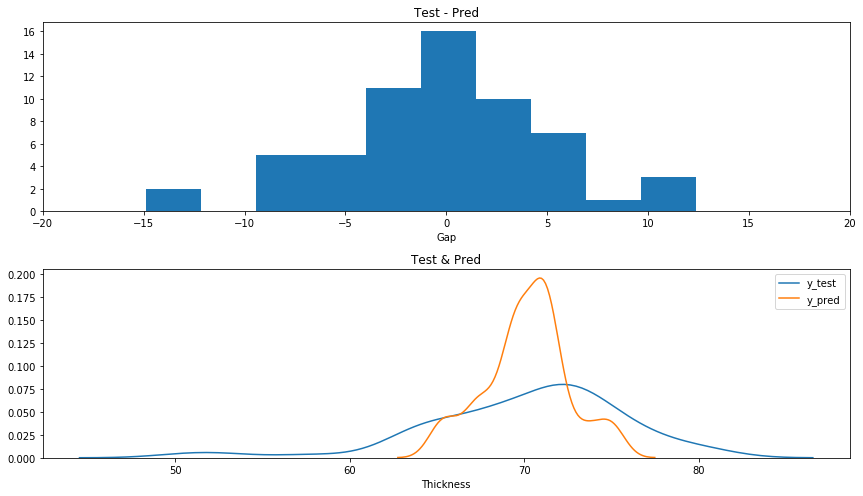

R SQR : -4.105887550366356
Min : 0.053
Max : 14.867
Mean :  4.048
Std :  5.452


'                                        '

'ANN'

'                                        '

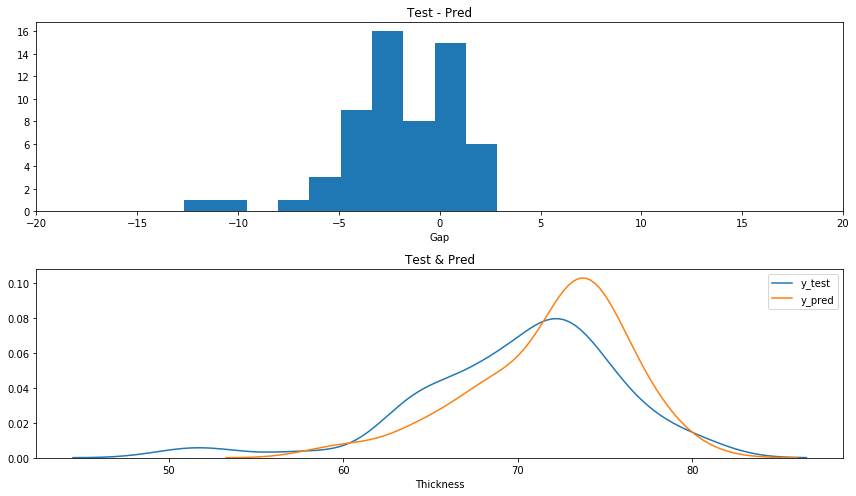

R SQR : 0.3510565541920616
Min : 0.001
Max : 12.661
Mean :  2.533
Std :  2.914
------------------------------------------------------------------------------------------------------------------------
2/2 - 0s - loss: 91.4658 - mae: 8.1078 - mse: 91.4658
################################################## DS7402M_203.4 ##################################################


'                                        '

'LR'

'                                        '

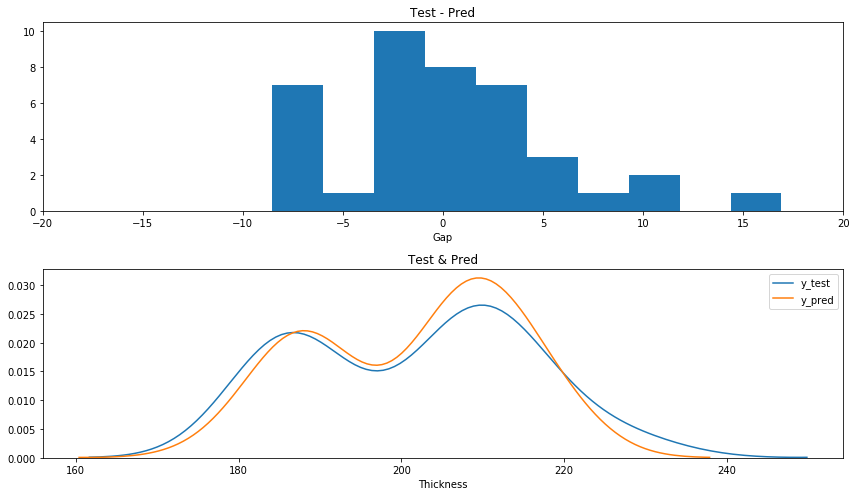

R SQR : 0.8052733889515509
Min : 0.405
Max : 16.91
Mean :  4.05
Std :  5.345


'                                        '

'ANN'

'                                        '

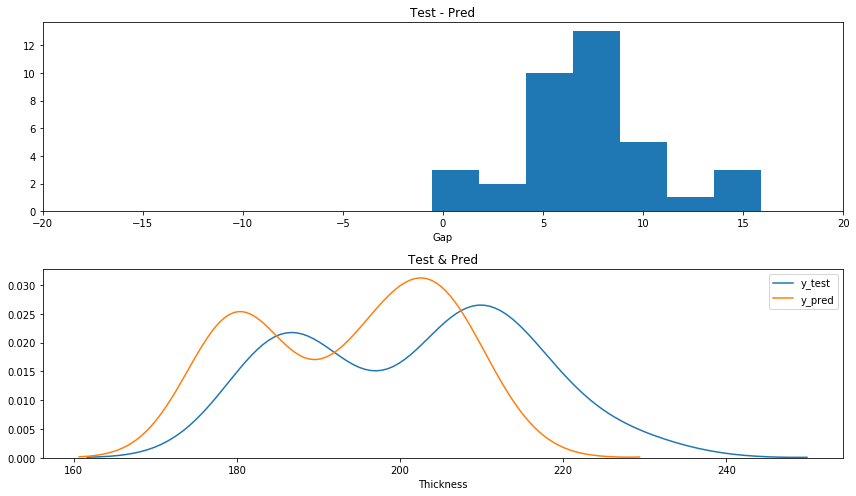

R SQR : 0.28840553238297006
Min : 0.161
Max : 22.922
Mean :  8.108
Std :  5.193
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 8.4832 - mae: 2.6470 - mse: 8.4832
################################################## DS7402M_81.4 ##################################################


'                                        '

'LR'

'                                        '

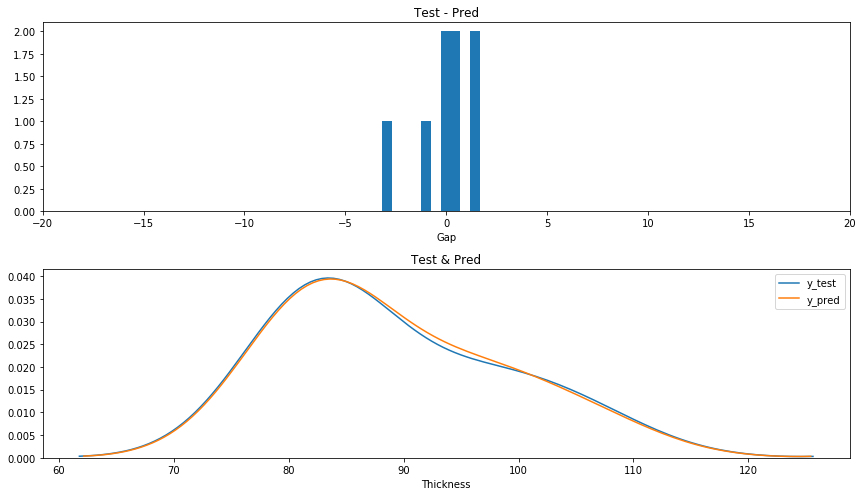

R SQR : 0.9724744407569516
Min : 0.089
Max : 3.192
Mean :  1.043
Std :  1.533


'                                        '

'ANN'

'                                        '

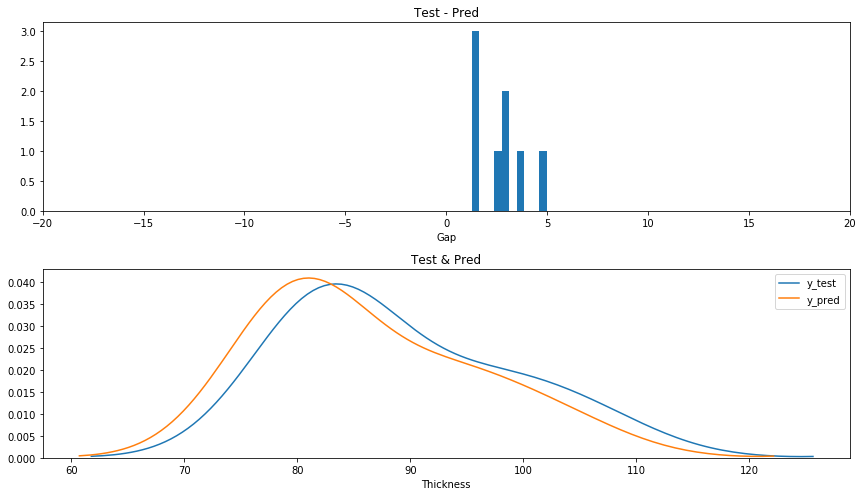

R SQR : 0.8816973789959275
Min : 1.265
Max : 4.975
Mean :  2.647
Std :  1.299
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 41.5795 - mae: 5.8565 - mse: 41.5795
################################################## DS7402M_165.0 ##################################################


'                                        '

'LR'

'                                        '

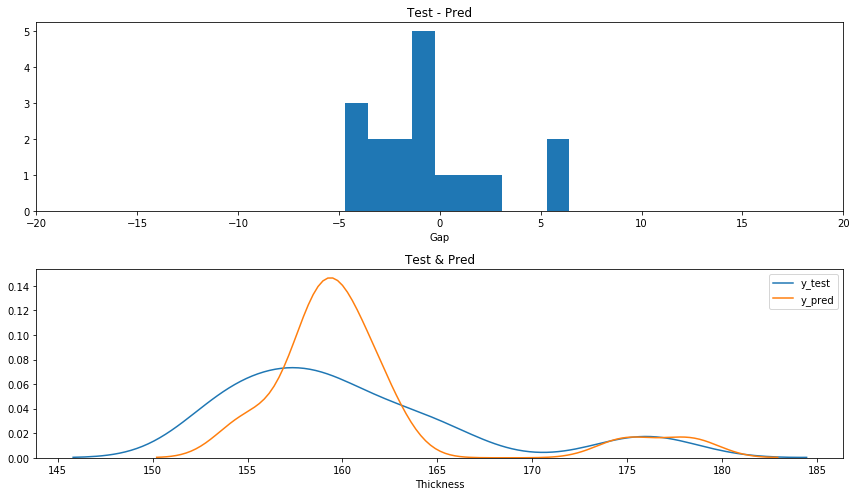

R SQR : 0.7228020507908526
Min : 0.084
Max : 6.398
Mean :  2.588
Std :  3.182


'                                        '

'ANN'

'                                        '

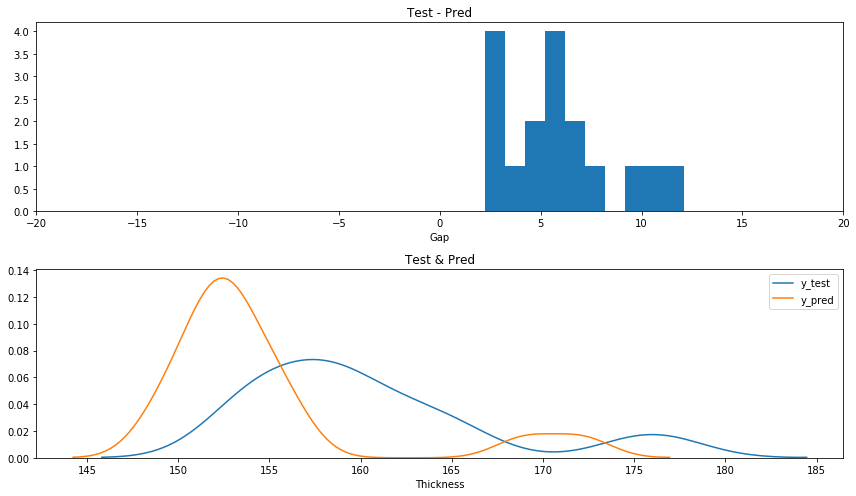

R SQR : -0.10197814965420049
Min : 2.243
Max : 12.127
Mean :  5.856
Std :  2.781
------------------------------------------------------------------------------------------------------------------------
2/2 - 0s - loss: 14.2462 - mae: 2.5935 - mse: 14.2462
################################################## DS7402M_31.0 ##################################################


'                                        '

'LR'

'                                        '

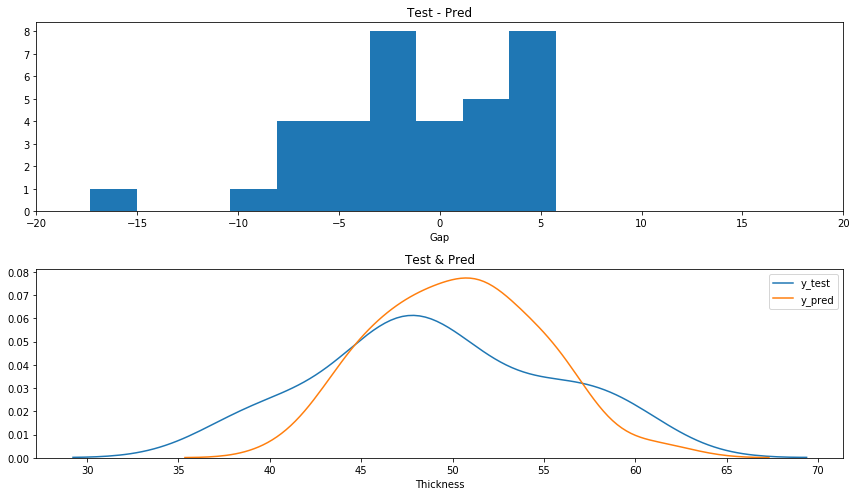

R SQR : -0.2819169146218157
Min : 0.185
Max : 17.321
Mean :  3.852
Std :  4.847


'                                        '

'ANN'

'                                        '

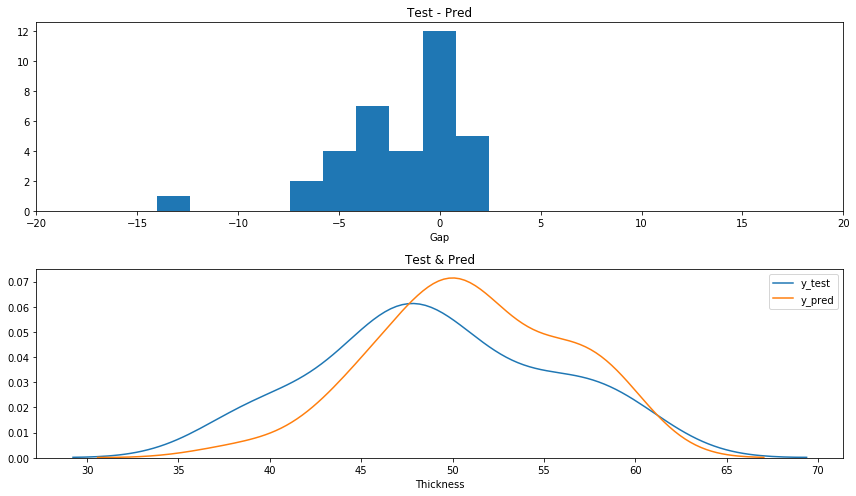

R SQR : 0.4294981326644217
Min : 0.14
Max : 14.017
Mean :  2.593
Std :  3.289
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 15.0200 - mae: 3.3999 - mse: 15.0200
################################################## DS7402M_103.8 ##################################################


'                                        '

'LR'

'                                        '

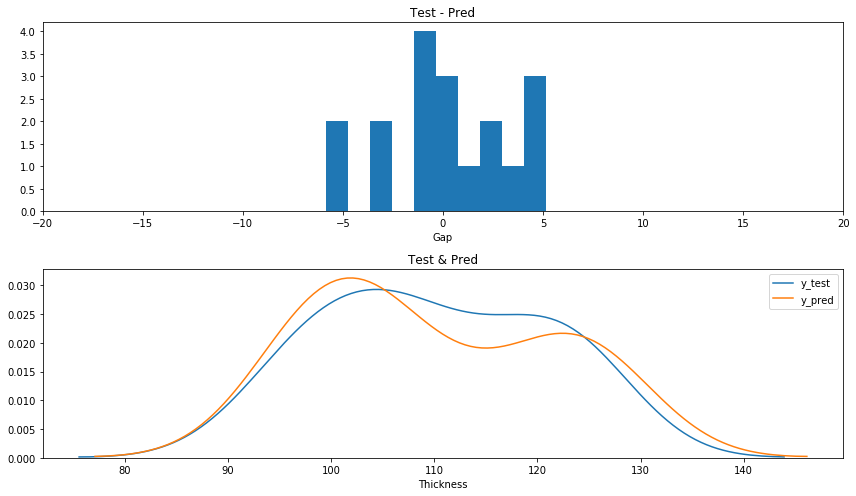

R SQR : 0.9184734752326504
Min : 0.04
Max : 5.839
Mean :  2.45
Std :  3.214


'                                        '

'ANN'

'                                        '

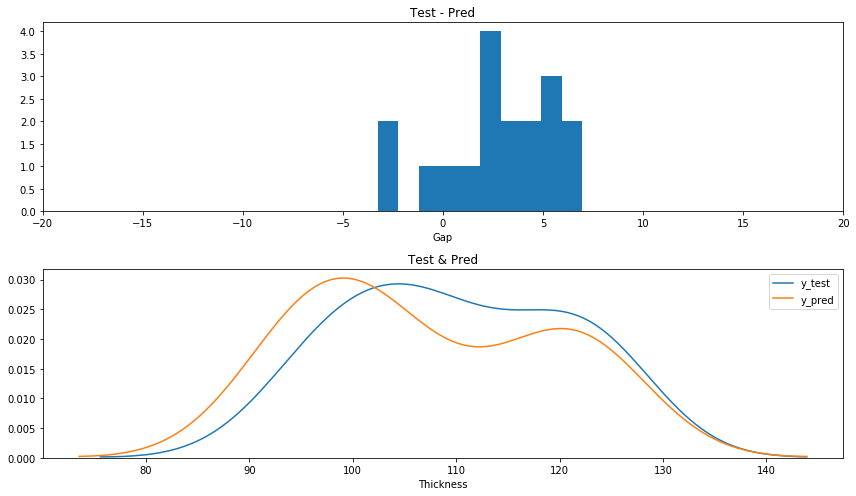

R SQR : 0.8797134515662847
Min : 0.23
Max : 6.956
Mean :  3.4
Std :  2.848
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 14.4262 - mae: 3.2092 - mse: 14.4262
################################################## DS7402M_24.4 ##################################################


'                                        '

'LR'

'                                        '

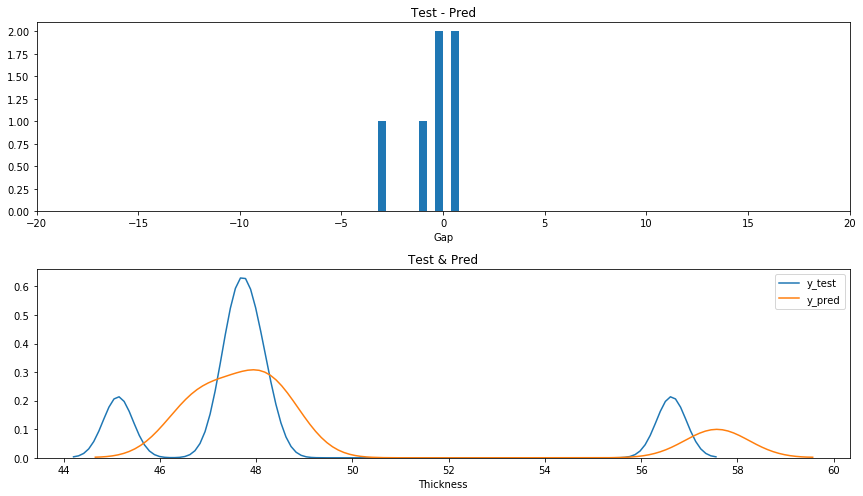

R SQR : 0.8533655420813597
Min : 0.051
Max : 3.219
Mean :  0.995
Std :  1.491


'                                        '

'ANN'

'                                        '

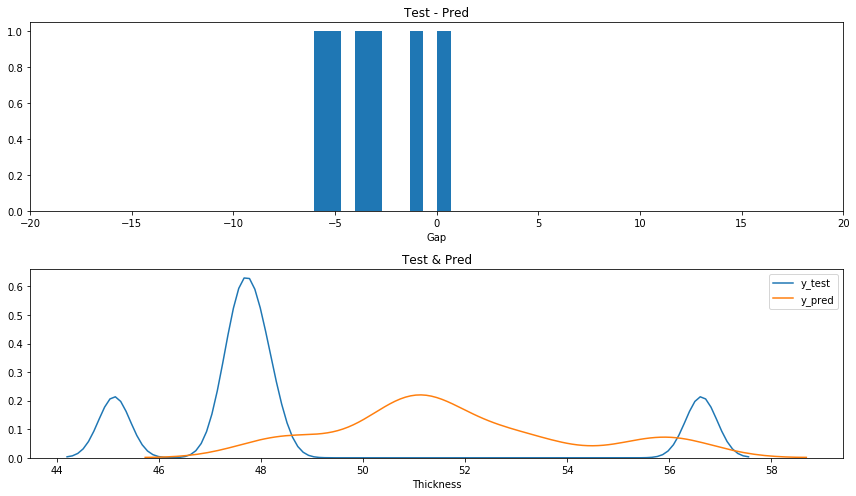

R SQR : -1.7717783765837312
Min : 0.702
Max : 6.059
Mean :  3.209
Std :  2.586
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 14.0487 - mae: 3.2828 - mse: 14.0487
################################################## NPG-151_46.8 ##################################################


'                                        '

'LR'

'                                        '

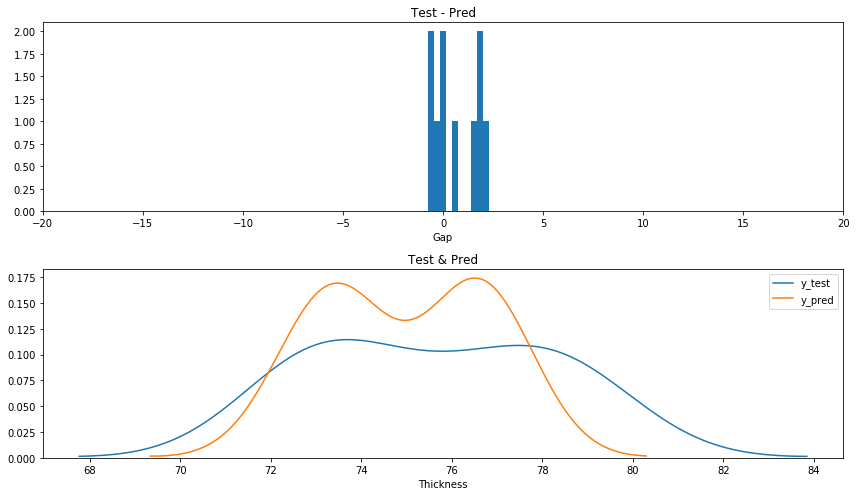

R SQR : 0.3868448222750772
Min : 0.038
Max : 2.305
Mean :  1.028
Std :  1.172


'                                        '

'ANN'

'                                        '

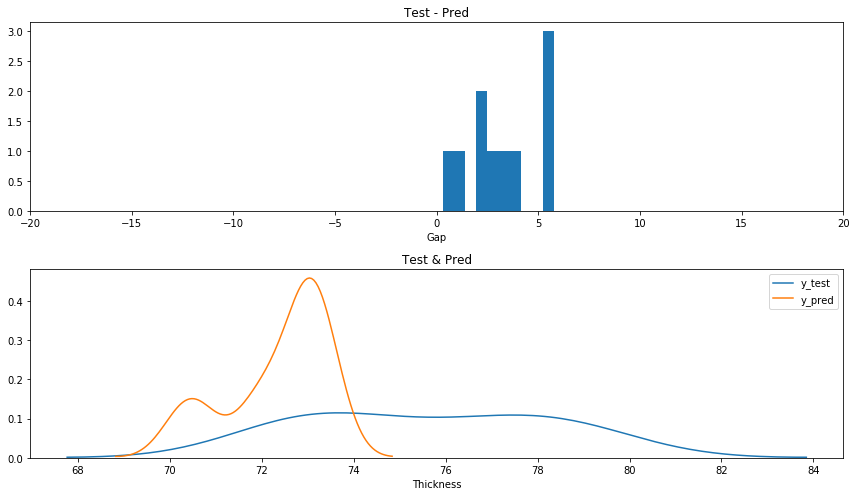

R SQR : -11.954761158176957
Min : 0.321
Max : 5.75
Mean :  3.283
Std :  1.907
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 23.6954 - mae: 4.1992 - mse: 23.6954
################################################## EM-370Z_46.8 ##################################################


'                                        '

'LR'

'                                        '

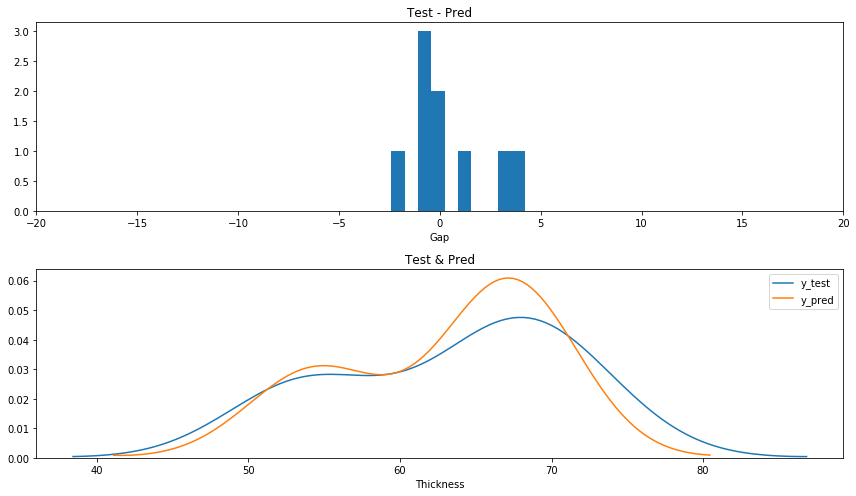

R SQR : 0.8844559545219088
Min : 0.147
Max : 4.215
Mean :  1.47
Std :  2.119


'                                        '

'ANN'

'                                        '

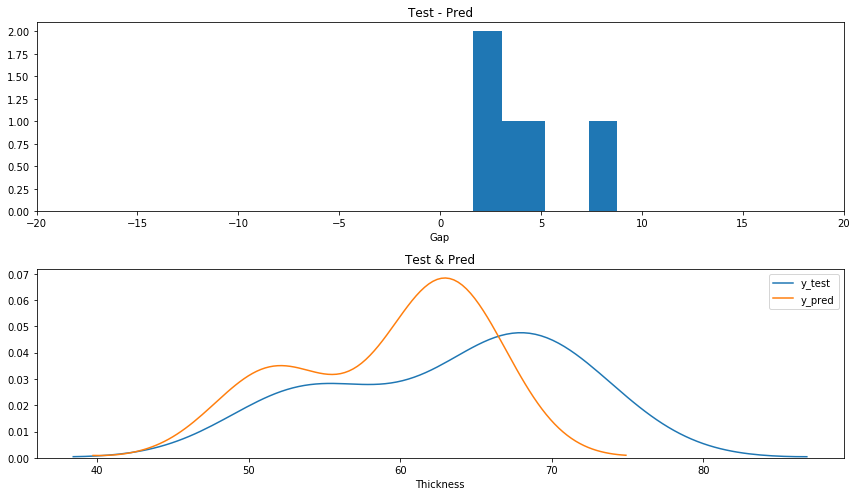

R SQR : 0.1773860009720224
Min : 1.64
Max : 8.791
Mean :  4.199
Std :  2.612
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 4.9740 - mae: 1.7019 - mse: 4.9740
################################################## EM-370Z_103.8 ##################################################


'                                        '

'LR'

'                                        '

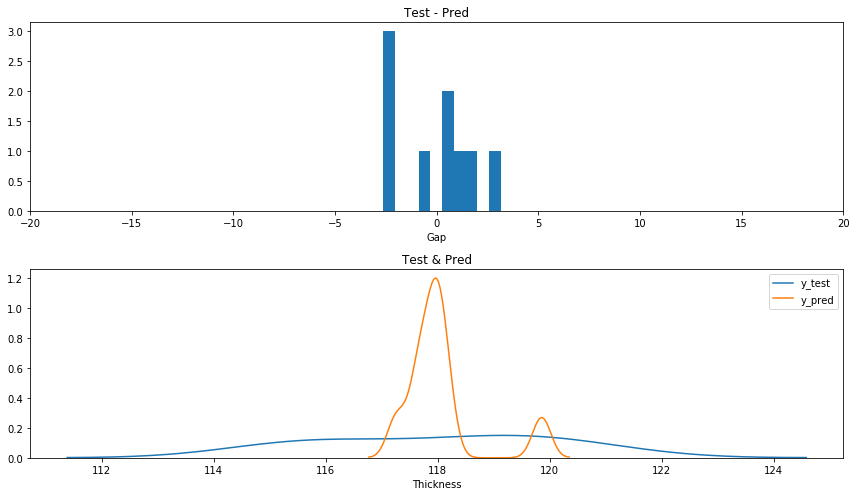

R SQR : -7.0818982414800296
Min : 0.442
Max : 3.142
Mean :  1.691
Std :  2.073


'                                        '

'ANN'

'                                        '

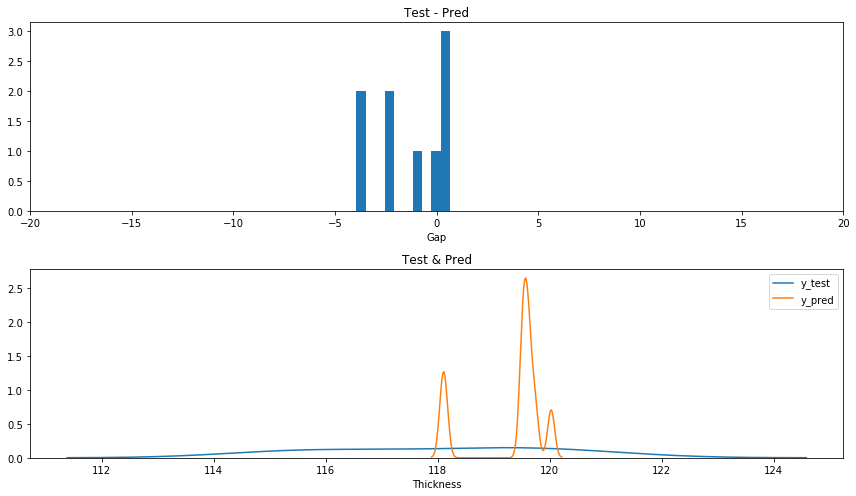

R SQR : -10.359919540254282
Min : 0.087
Max : 3.954
Mean :  1.702
Std :  1.886
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 79.7847 - mae: 8.8998 - mse: 79.7847
################################################## EM-370Z_31.0 ##################################################


'                                        '

'LR'

'                                        '

C:\Users\Samsung\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning:

Data must have variance to compute a kernel density estimate.



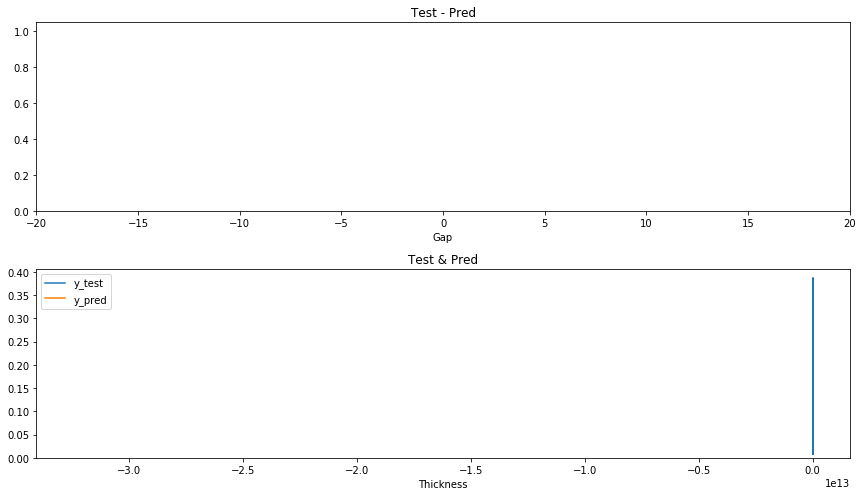

R SQR : -inf
Min : 32446792236056.773
Max : 32446792236058.293
Mean :  32446792236057.53
Std :  1.074


C:\Users\Samsung\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

divide by zero encountered in double_scalars



'                                        '

'ANN'

'                                        '

C:\Users\Samsung\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning:

Data must have variance to compute a kernel density estimate.



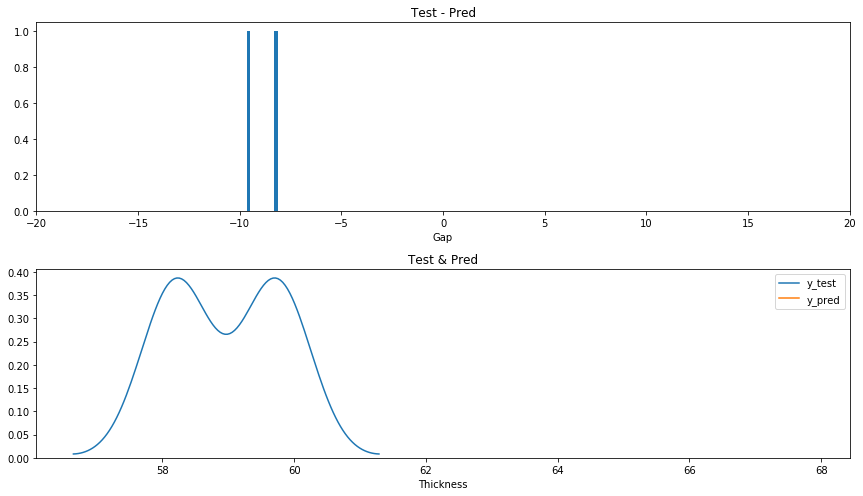

C:\Users\Samsung\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

divide by zero encountered in double_scalars



R SQR : -inf
Min : 8.14
Max : 9.66
Mean :  8.9
Std :  1.075
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 7.5739 - mae: 2.6535 - mse: 7.5739
################################################## EM-370Z_81.4 ##################################################


'                                        '

'LR'

'                                        '

C:\Users\Samsung\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning:

Data must have variance to compute a kernel density estimate.



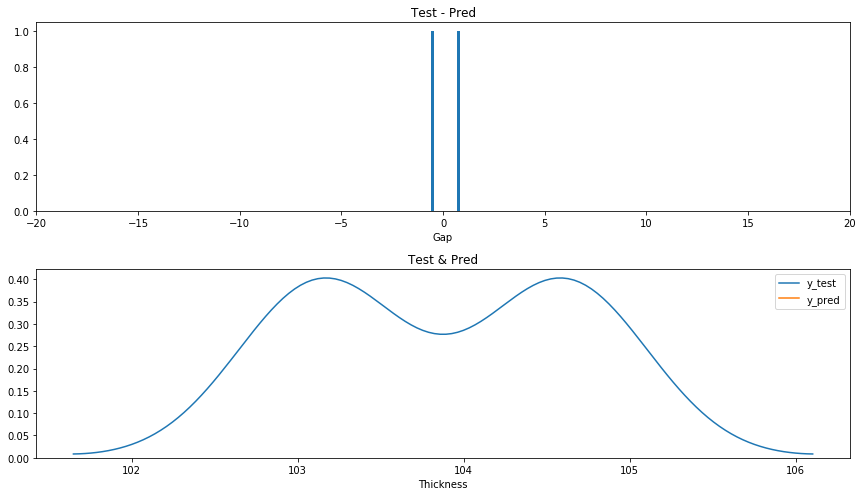

R SQR : -inf
Min : 0.604
Max : 0.856
Mean :  0.73
Std :  1.032


C:\Users\Samsung\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

divide by zero encountered in double_scalars



'                                        '

'ANN'

'                                        '

C:\Users\Samsung\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning:

Data must have variance to compute a kernel density estimate.



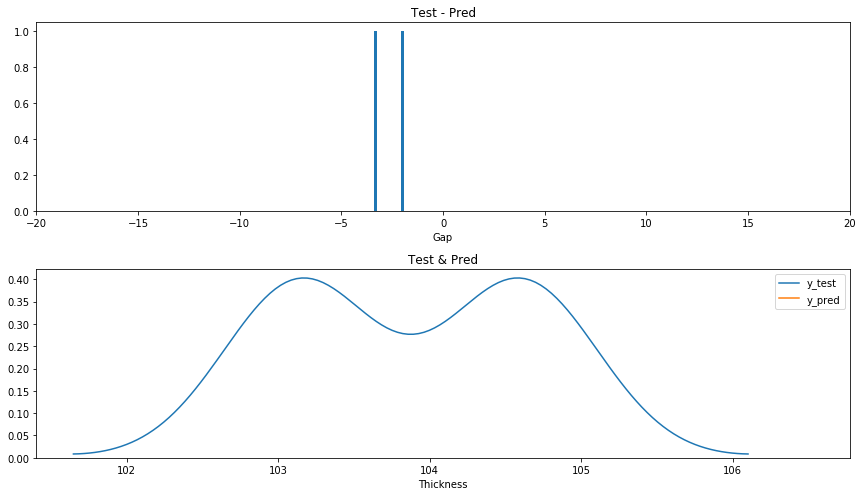

C:\Users\Samsung\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

divide by zero encountered in double_scalars



R SQR : -inf
Min : 1.923
Max : 3.383
Mean :  2.653
Std :  1.032
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 6.9530 - mae: 2.1129 - mse: 6.9530
################################################## DS7402LC_31.0 ##################################################


'                                        '

'LR'

'                                        '

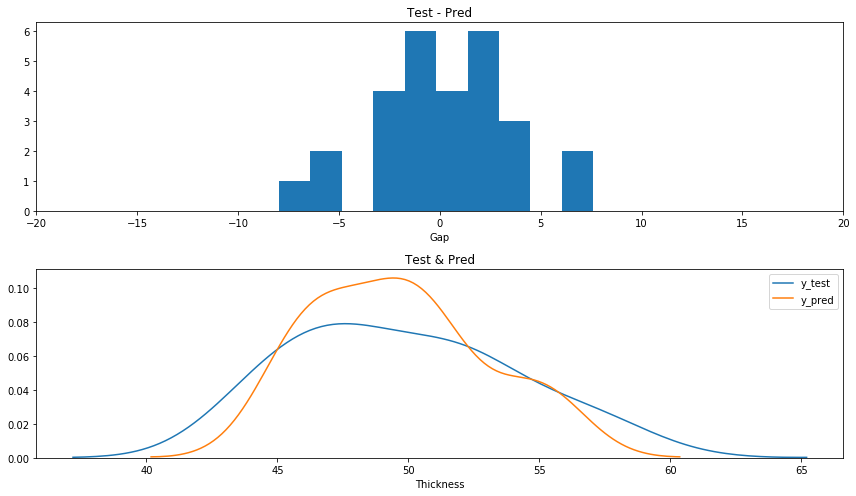

R SQR : -0.2245114217158406
Min : 0.393
Max : 7.972
Mean :  2.744
Std :  3.513


'                                        '

'ANN'

'                                        '

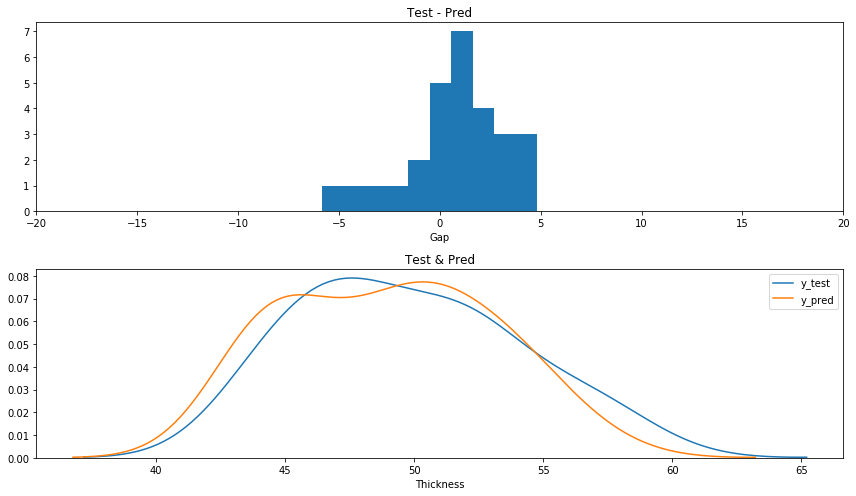

R SQR : 0.5356999542309622
Min : 0.1
Max : 5.822
Mean :  2.113
Std :  2.557
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 13.3591 - mae: 3.1851 - mse: 13.3591
################################################## DS7402LC_103.8 ##################################################


'                                        '

'LR'

'                                        '

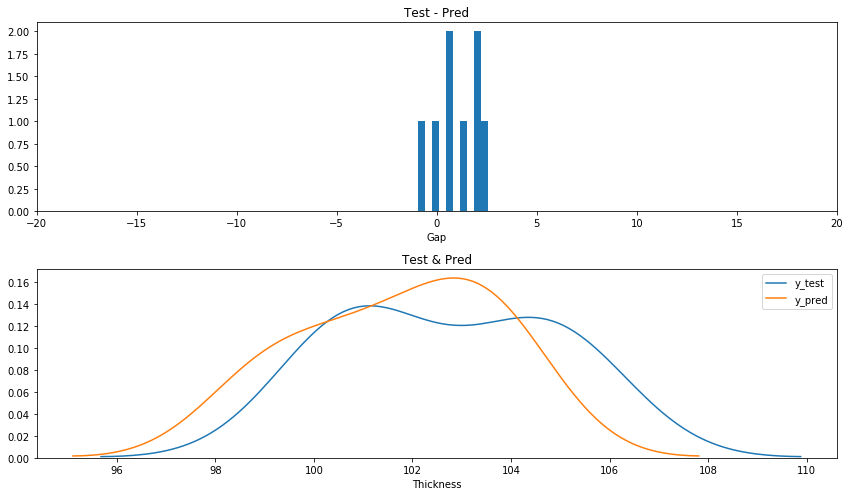

R SQR : 0.3213302940611601
Min : 0.247
Max : 2.537
Mean :  1.303
Std :  1.207


'                                        '

'ANN'

'                                        '

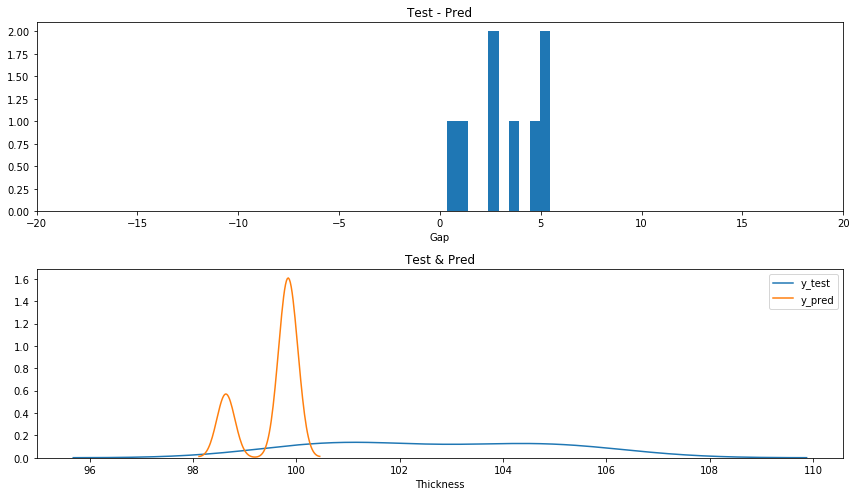

R SQR : -47.23525647598242
Min : 0.342
Max : 5.477
Mean :  3.185
Std :  1.917
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 8.4203 - mae: 2.4640 - mse: 8.4203
################################################## DS7402LC_46.8 ##################################################


'                                        '

'LR'

'                                        '

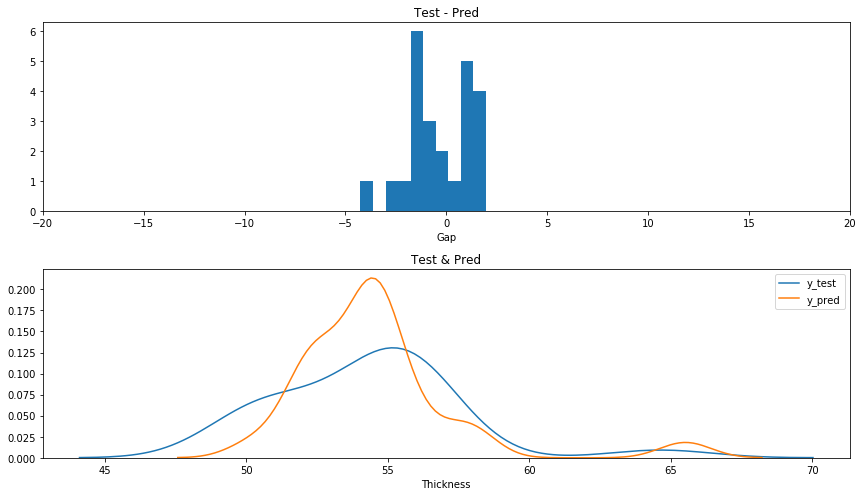

R SQR : 0.6900050598723126
Min : 0.096
Max : 4.254
Mean :  1.387
Std :  1.616


'                                        '

'ANN'

'                                        '

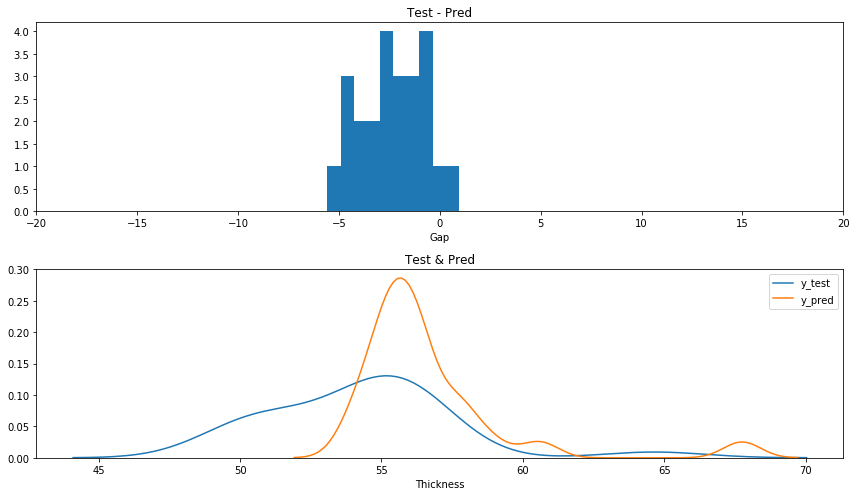

R SQR : -0.1126645646261315
Min : 0.258
Max : 5.572
Mean :  2.464
Std :  1.719
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 4.4680 - mae: 1.9608 - mse: 4.4680
################################################## DS7402LC_24.4 ##################################################


'                                        '

'LR'

'                                        '

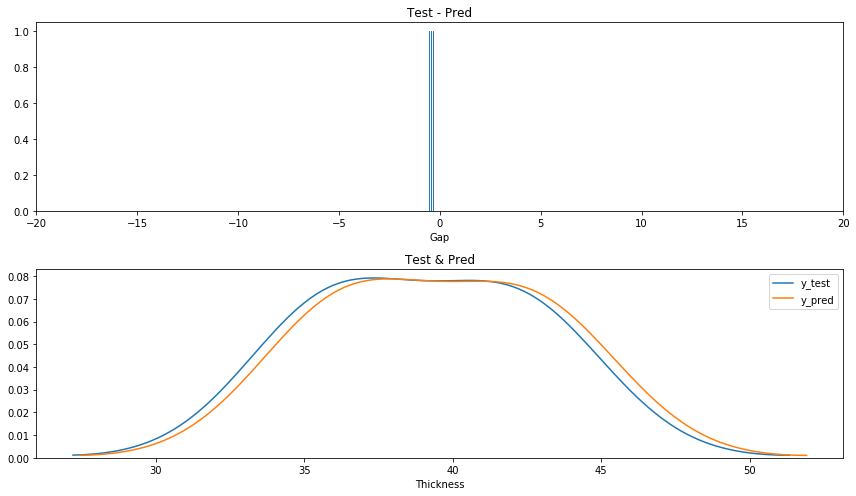

R SQR : 0.9776724517904968
Min : 0.289
Max : 0.596
Mean :  0.454
Std :  0.133


'                                        '

'ANN'

'                                        '

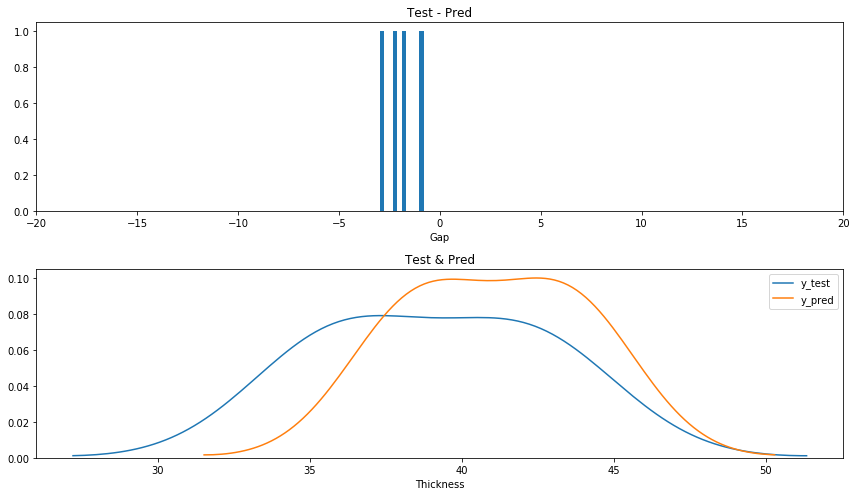

R SQR : 0.2558177172173304
Min : 0.801
Max : 2.985
Mean :  1.961
Std :  0.912
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 2.4464 - mae: 1.5006 - mse: 2.4464
################################################## DS7402LC_81.4 ##################################################


'                                        '

'LR'

'                                        '

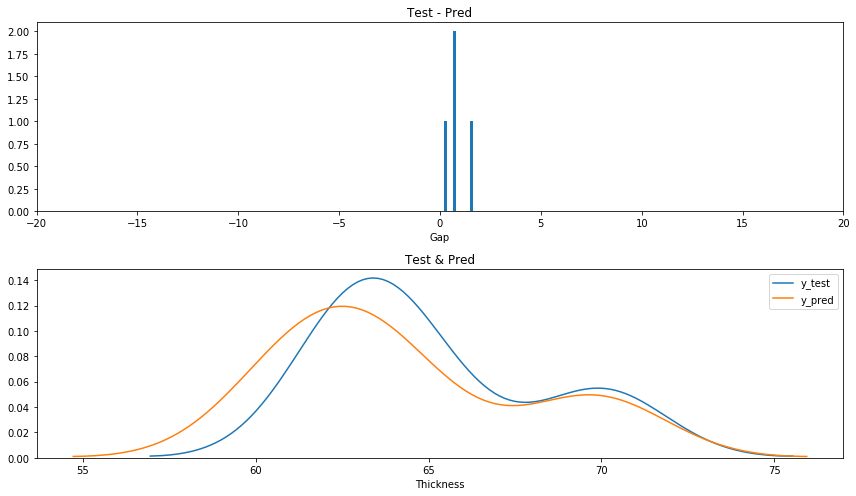

R SQR : 0.9221704175655503
Min : 0.215
Max : 1.615
Mean :  0.79
Std :  0.589


'                                        '

'ANN'

'                                        '

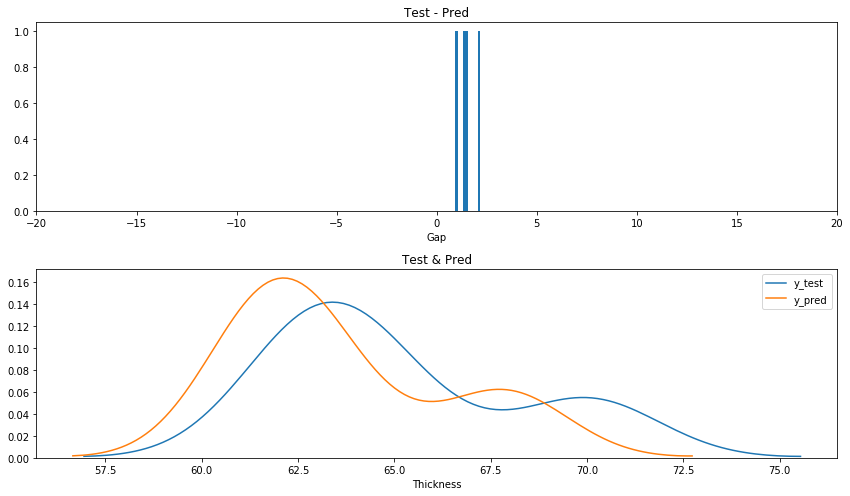

R SQR : 0.6215378673115639
Min : 0.933
Max : 2.17
Mean :  1.501
Std :  0.509
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 1.2830 - mae: 1.1088 - mse: 1.2830
################################################## DS7402LC_165.0 ##################################################


'                                        '

'LR'

'                                        '

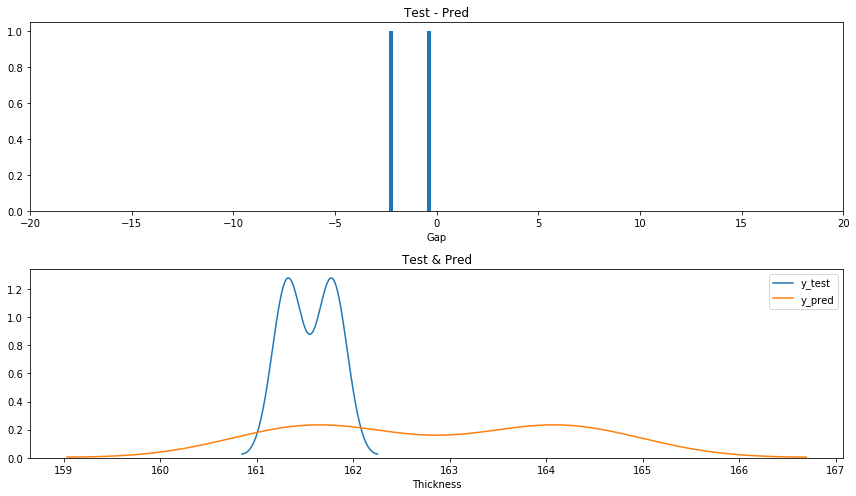

R SQR : -0.7650552602885792
Min : 0.29
Max : 2.341
Mean :  1.316
Std :  1.45


'                                        '

'ANN'

'                                        '

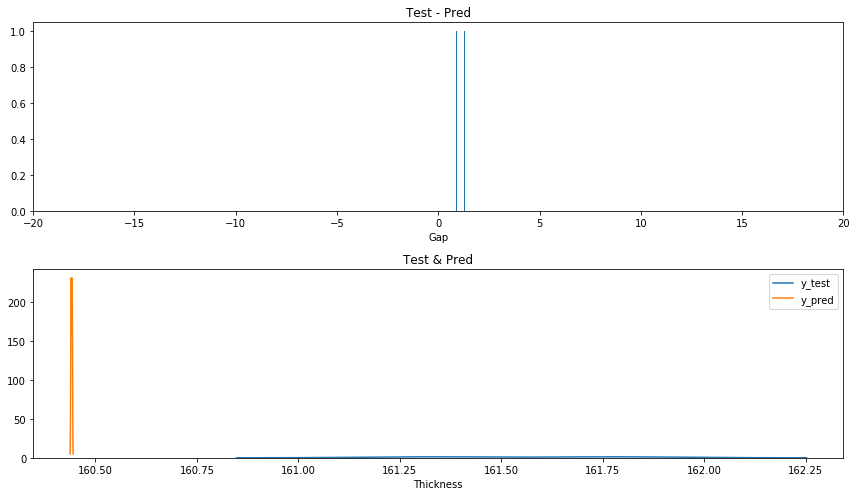

R SQR : -790284.3308366268
Min : 0.878
Max : 1.34
Mean :  1.109
Std :  0.327
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 15.0988 - mae: 3.4225 - mse: 15.0988
################################################## IT150G_46.8 ##################################################


'                                        '

'LR'

'                                        '

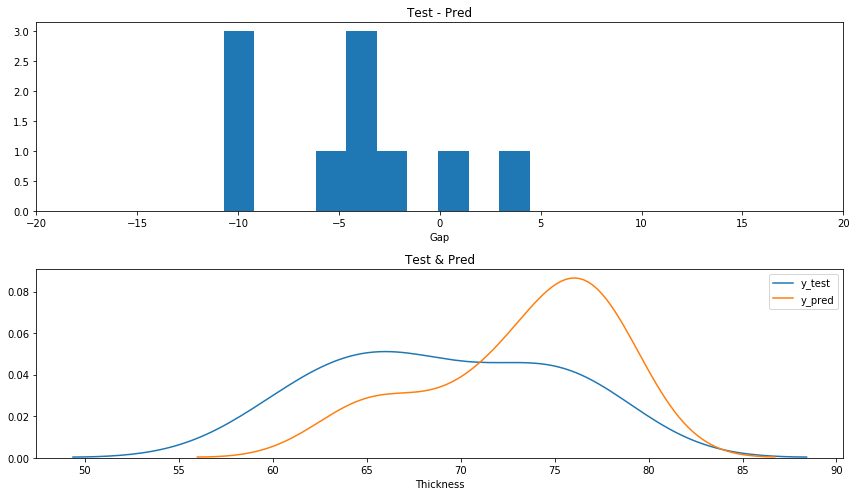

R SQR : -0.8853536118976888
Min : 0.445
Max : 10.703
Mean :  5.292
Std :  4.801


'                                        '

'ANN'

'                                        '

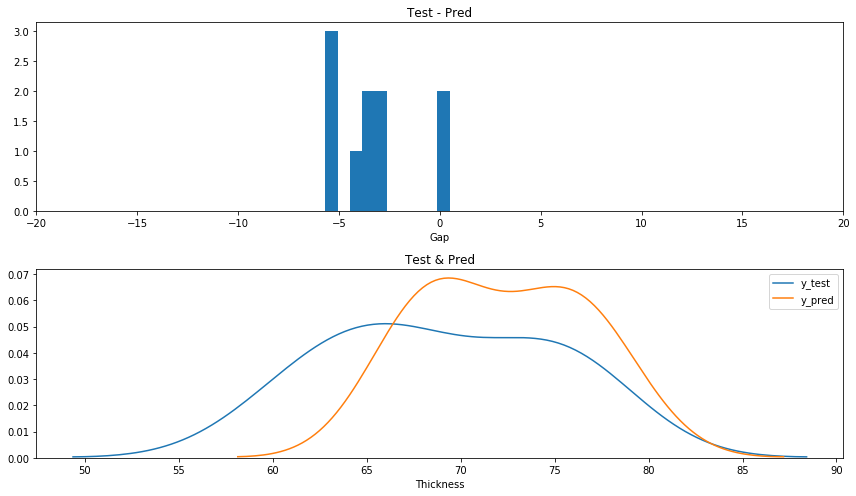

R SQR : 0.07564645381792012
Min : 0.315
Max : 5.681
Mean :  3.423
Std :  2.223
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 110.6994 - mae: 9.3050 - mse: 110.6994
################################################## IT150G_203.4 ##################################################


'                                        '

'LR'

'                                        '

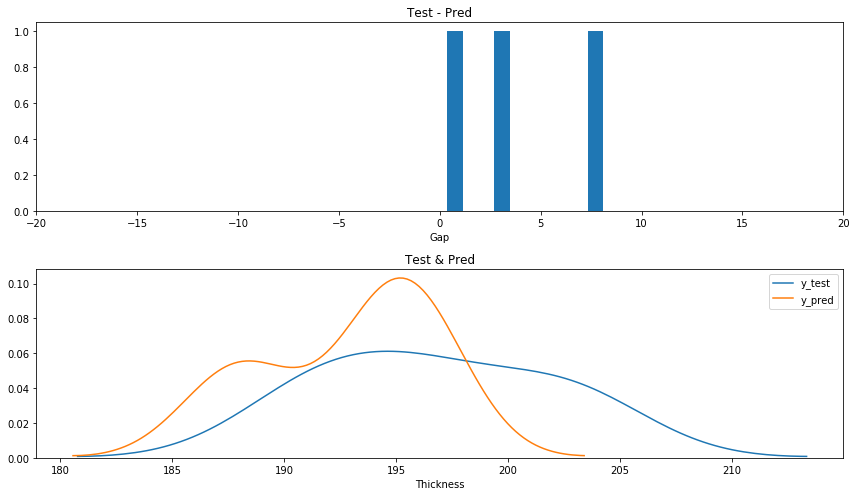

R SQR : -1.1632644277059025
Min : 0.375
Max : 8.098
Mean :  3.953
Std :  3.892


'                                        '

'ANN'

'                                        '

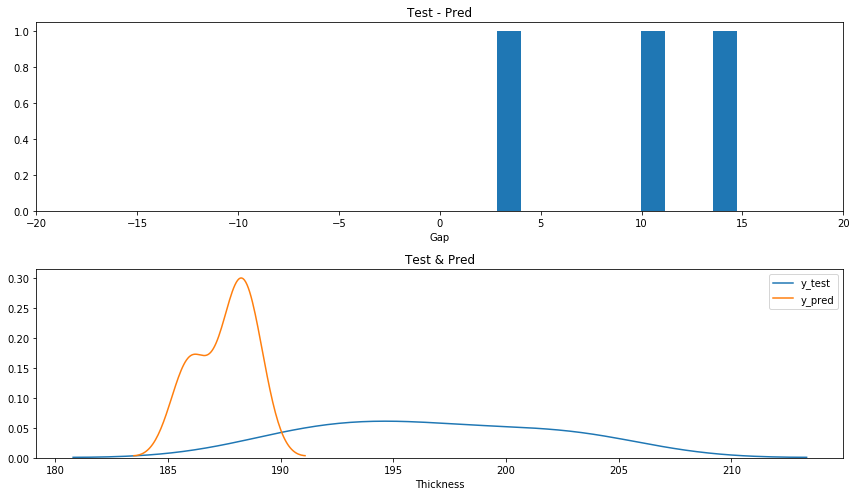

R SQR : -87.29458567276437
Min : 2.837
Max : 14.729
Mean :  9.305
Std :  6.015
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 2.9054 - mae: 1.6542 - mse: 2.9054
################################################## EM-526_46.8 ##################################################


'                                        '

'LR'

'                                        '

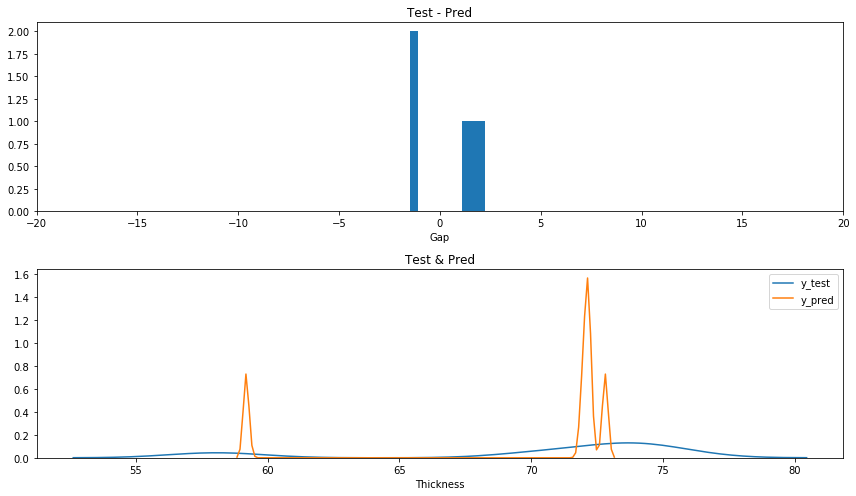

R SQR : 0.9128625944901699
Min : 1.131
Max : 2.214
Mean :  1.498
Std :  1.653


'                                        '

'ANN'

'                                        '

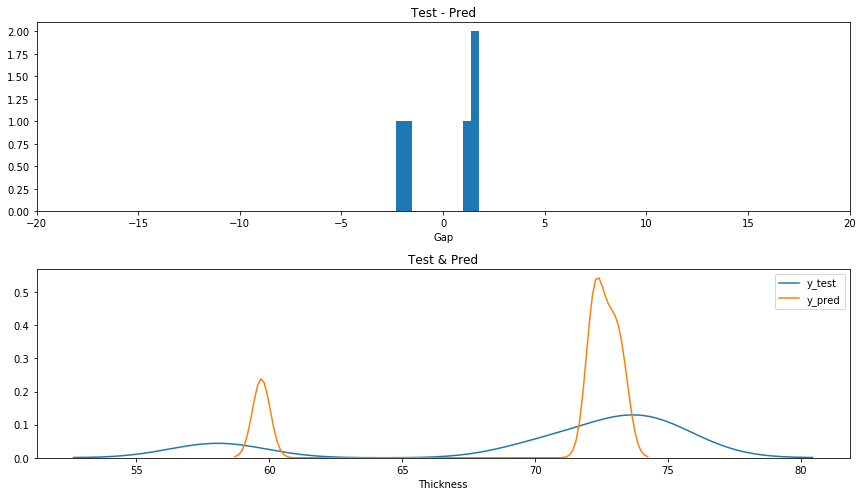

R SQR : 0.8921873066566074
Min : 1.09
Max : 2.334
Mean :  1.654
Std :  1.904
------------------------------------------------------------------------------------------------------------------------
1/1 - 0s - loss: 35.9148 - mae: 5.2013 - mse: 35.9148
################################################## EM-526_103.8 ##################################################


'                                        '

'LR'

'                                        '

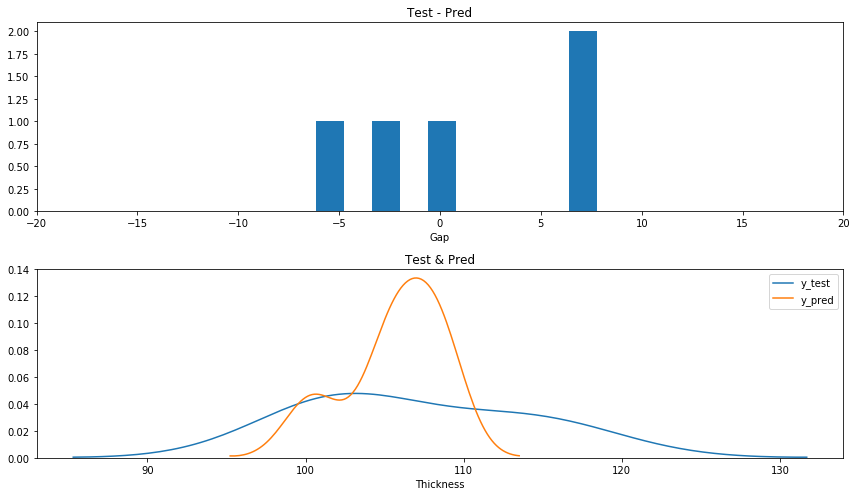

R SQR : -2.764145128147628
Min : 0.49
Max : 7.766
Mean :  4.772
Std :  6.031


'                                        '

'ANN'

'                                        '

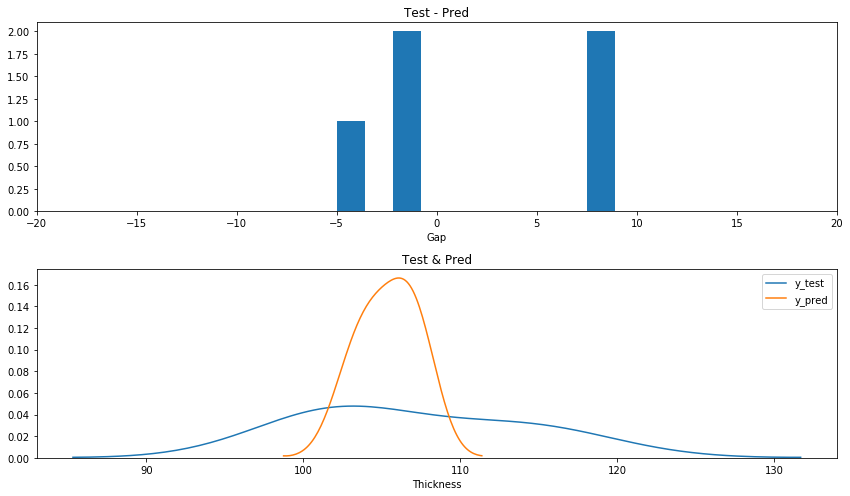

R SQR : -12.397456910504781
Min : 1.859
Max : 8.915
Mean :  5.201
Std :  6.439
------------------------------------------------------------------------------------------------------------------------


In [93]:
drop_list = ['MatlMaker','MatlG',"Model","PP"]
hist_lr,hist_ann = anal(data_pp,drop_list,"yes")

# 3. Blind test 돌리기

In [94]:
### 사용자함수 ANN을 통한 test

def ann_test3(testset,drop_list):
    """
    testset: 앞 부분에서 testset으로 뽑아낸 blind test 용 데이터
    drop_list: 분석에 필요없는 columns list
    """
    # pp층은 "matmaker"를 제거해야 함으로 제거 목록 추가
    drop_list_pp = drop_list + ["MatlMaker"]
    drop_list_ccl = drop_list
    
    # model_: pp 층용 데이터, model_2: ccl층 데이터
    model_ = testset.reset_index(drop=True)
    model_2 = make_ccl(model_,drop_list_ccl)
    thick_ = []
    
    ### testset의 한층씩 예측값 산출하기
    for i in range(len(model_)):
        # i 번째 층 불러오기
        target_data = model_.loc[i,:]
        # 해당층의 값들 정리하기
        maker_name = target_data["MatlMaker"]
        glass_name = str(target_data["MatlG"]).replace(".","_")
        
        full_1 = maker_name +"/"+glass_name
        full =  maker_name +"_"+glass_name
        ### CCL 층 값 예측하기
        if target_data["PP"] == 0:
            test_data = model_2.loc[i,:]
            # y값
            y_t = test_data["Thickness"]
            # x값
            x_t1 = test_data.drop("Thickness")
            x_t = np.array(x_t1).reshape(1, -1).astype('float32')
            # 값예측
            """
            위에서 학습한 CCL 분류기: model_ccl
            """
            prdi_ = model_ccl.predict(x_t)[0][0]
            # 결과저장
            thick_.append((full_1,prdi_,y_t))
            
        else:
            test_data = target_data.drop(drop_list_pp)
            # y값
            y_t = test_data["Thickness"]
            # x 값
            x_t1 = test_data.drop("Thickness")
            x_t = np.array(x_t1).reshape(1, -1).astype('float32')
            # 값예측
            """
            위에서 학습한 ANN 모델 불러오기
            """
            prdi_ = globals() ["ANN_{}".format(full)].predict(x_t)[0][0]
            # 결과 저장
            thick_.append((full_1,prdi_,y_t))

    return thick_

In [95]:
### 사용자함수 LR을 통한 blind test
## ANN 거의 동일해서 따로 위에 보면 될 것 같아 미영아
def lr_test3(testset,drop_list):
    drop_list_pp = drop_list + ["MatlMaker"]
    drop_list_ccl = drop_list
    model_ = testset.reset_index(drop=True)
    model_2 = make_ccl(model_,drop_list_ccl)
    thick_ = []
    for i in range(len(model_)):
        target_data = model_.loc[i,:]
        maker_name = target_data["MatlMaker"]
        glass_name = str(target_data["MatlG"]).replace(".","_")
        full_1 = maker_name +"/"+glass_name
        full =  maker_name +"_"+glass_name
        
        if target_data["PP"] == 0:
            test_data = model_2.loc[i,:]
            # y값
            y_t = test_data["Thickness"]
            x_t1 = test_data.drop("Thickness")
            x_t = np.array(x_t1).reshape(1, -1).astype('float32')
            
            prdi_ = model_ccl.predict(x_t)[0][0]
            thick_.append((full_1,prdi_,y_t))
            
        else:
            test_data = target_data.drop(drop_list_pp)
            # y값
            y_t = test_data["Thickness"]
            x_t1 = test_data.drop("Thickness")
            x_t = np.array(x_t1).reshape(1, -1).astype('float32')
            
            prdi_ = globals() ["LR_{}".format(full)].predict(x_t)[0]
            thick_.append((full_1,prdi_,y_t))
            
    return thick_

# 별첨 Version 3. 하나에 저장

In [96]:
dl = ["Model","PP","MatlG"]

## path_만 원하는 곳으로 고치면 될꺼야 
path_ = r"C:\Users\Samsung\jupyter\Project_PCB\result\0217\ANN_all.xlsx"
default_ = pd.DataFrame()

for mo in tqdm(sorted(model_list)):
    mo_,maker_,glass_,pr_,actual_ = [],[],[],[],[]

    target_ = globals()["model_{}".format(mo)]

    blind_test = ann_test3(target_,dl)
    for i in blind_test:
        maker,glass = i[0].split("/")
        maker_.append(maker)
        glass_.append(glass.replace("_","."))
        pr_.append(i[1])
        actual_.append(i[2])
        mo_.append(mo)

    out_put = pd.DataFrame([mo_,maker_,glass_,pr_,actual_]).T.rename(columns={0:"Model",1:"Maker",2:"Glass",3:"pred_",4:"actual"})
    default_ = pd.concat([default_,out_put])
default_ANN = default_.reset_index(drop=True)
default_ANN.to_excel(path_)

  0%|          | 0/65 [00:00<?, ?it/s]

In [97]:
dl = ["Model","PP","MatlG"]

## path_만 원하는 곳으로 고치면 될꺼야 
path_ = r"C:\Users\Samsung\jupyter\Project_PCB\result\0217\LR_all.xlsx"
default_ = pd.DataFrame()


for mo in tqdm(sorted(model_list)):
    mo_,maker_,glass_,pr_,actual_ = [],[],[],[],[]

    target_ = globals()["model_{}".format(mo)]

    blind_test = lr_test3(target_,dl)
    for i in blind_test:
        maker,glass = i[0].split("/")
        maker_.append(maker)
        glass_.append(glass.replace("_","."))
        pr_.append(i[1])
        actual_.append(i[2])
        mo_.append(mo)

    out_put = pd.DataFrame([mo_,maker_,glass_,pr_,actual_]).T.rename(columns={0:"Model",1:"Maker",2:"Glass",3:"pred_",4:"actual"})
    default_ = pd.concat([default_,out_put])
default_LR = default_.reset_index(drop=True)
default_LR.to_excel(path_)

  0%|          | 0/65 [00:00<?, ?it/s]

### ANN

In [98]:
tar_total = default_ANN

tar_total["error_rate"] = tar_total.apply(lambda x : error_abs(x["pred_"],x["actual"]),axis=1)
tar_total.head()

,Model,Maker,Glass,pred_,actual,error_rate
0,1,DS7402M,46.8,69.0598,67.7,0.019690
1,1,DS7402M,0.0,74.0854,73.71,0.005067
2,1,DS7402M,203.4,189.247,187.25,0.010554
3,1,DS7402M,0.0,74.9981,77.47,0.032959
4,1,DS7402M,81.4,79.4972,80.48,0.012363


DS7402M_46.8's Avg Error rate: 0.0361442787162225


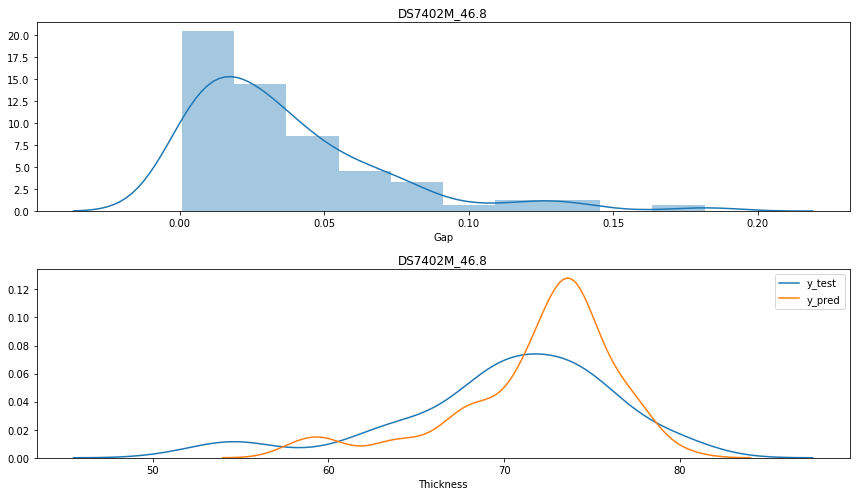

--------------------------------------------------
DS7402M_0.0's Avg Error rate: 0.022260133494642374


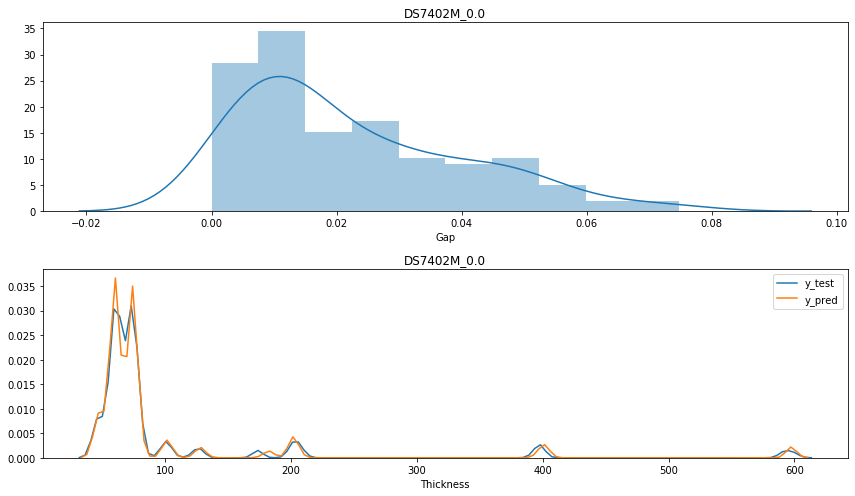

--------------------------------------------------
DS7402M_203.4's Avg Error rate: 0.037802129435044296


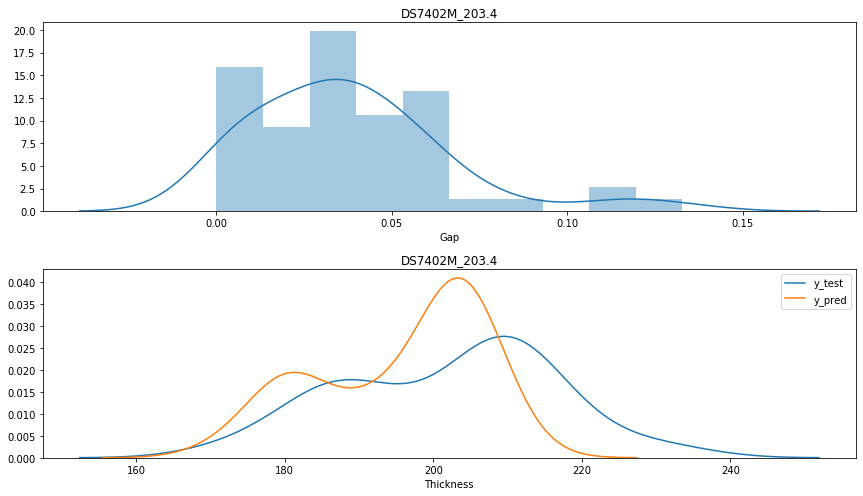

--------------------------------------------------
DS7402M_81.4's Avg Error rate: 0.03574667817538085


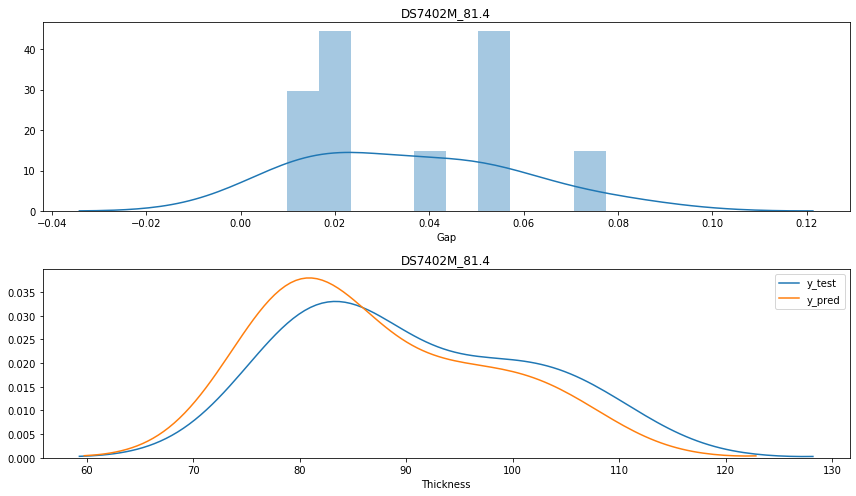

--------------------------------------------------
DS7402M_165.0's Avg Error rate: 0.0466638187135346


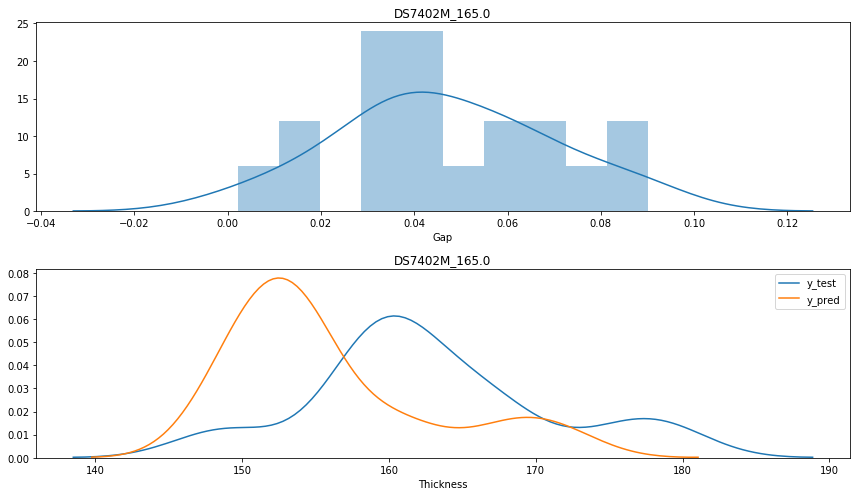

--------------------------------------------------
DS7402M_31.0's Avg Error rate: 0.05345440010844382


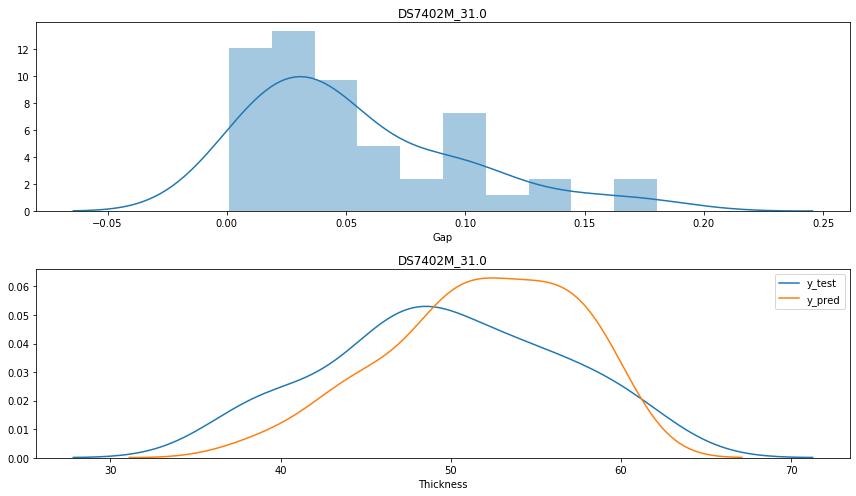

--------------------------------------------------
DS7402M_103.8's Avg Error rate: 0.03192308853441967


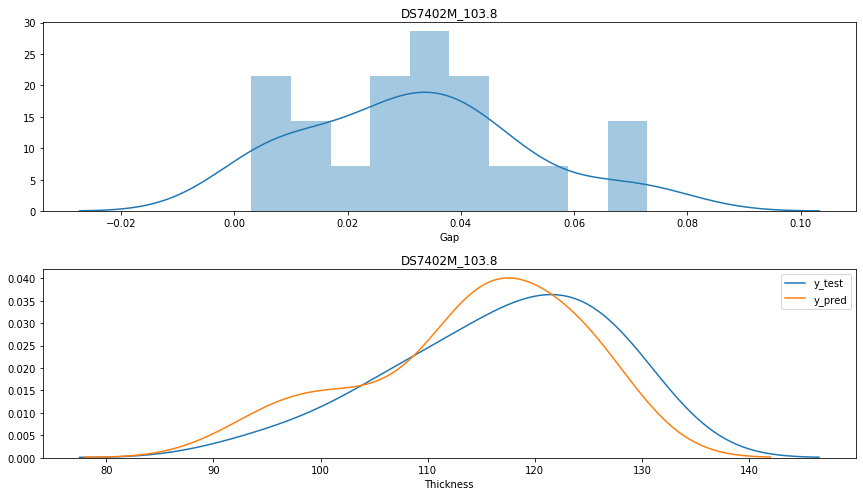

--------------------------------------------------
DS7402M_24.4's Avg Error rate: 0.07309829314345426


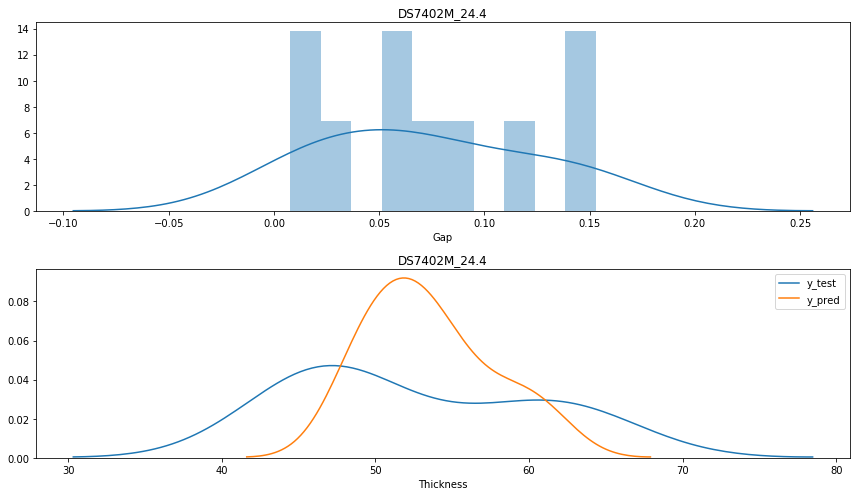

--------------------------------------------------
NPG-151_46.8's Avg Error rate: 0.038444299019369965


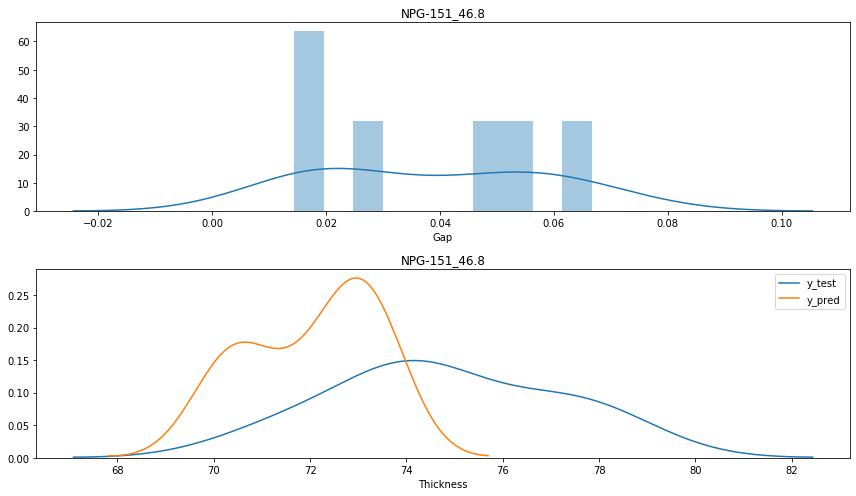

--------------------------------------------------
NPG-151_0.0's Avg Error rate: 0.021816966008810307


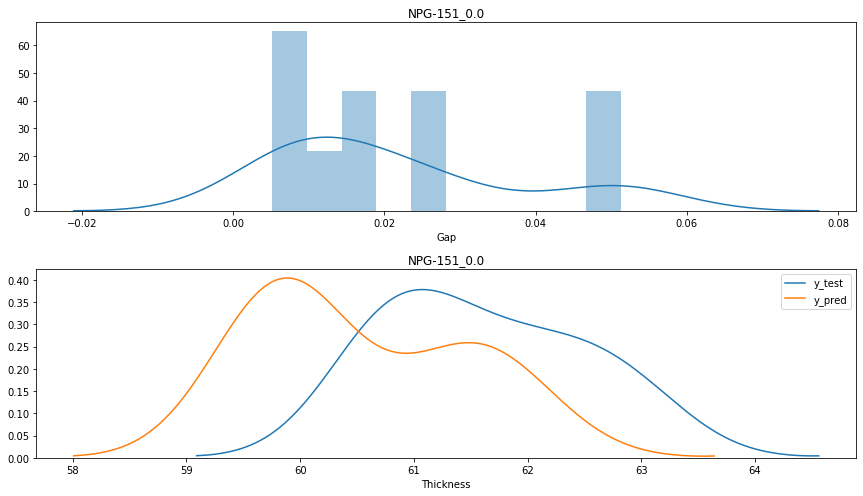

--------------------------------------------------
EM-370Z_46.8's Avg Error rate: 0.07948150857109233


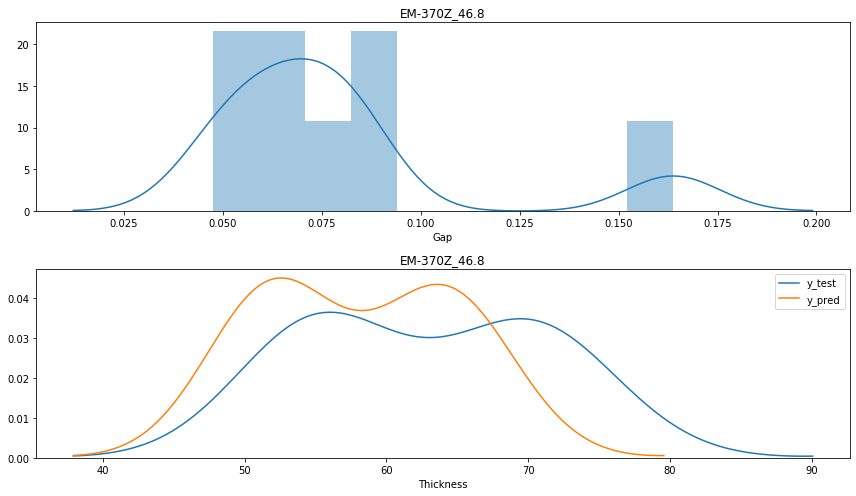

--------------------------------------------------
EM-370Z_48.0's Avg Error rate: 0.01040086563300433


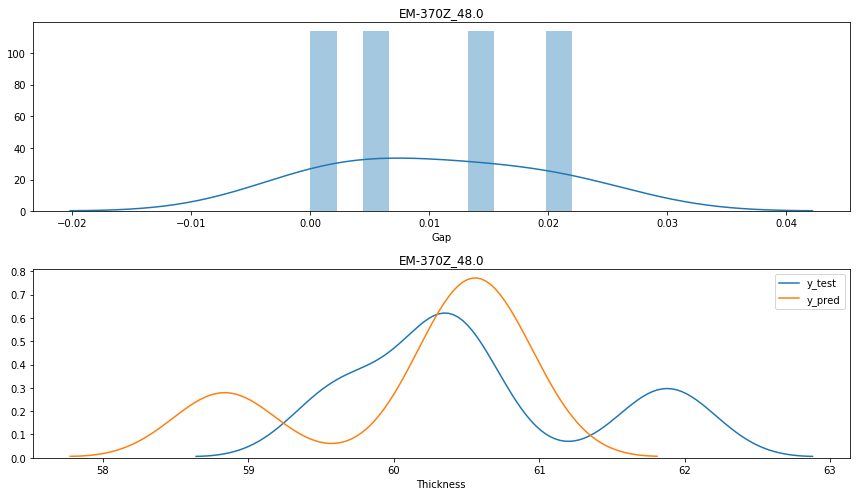

--------------------------------------------------
EM-370Z_103.8's Avg Error rate: 0.02276863160925848


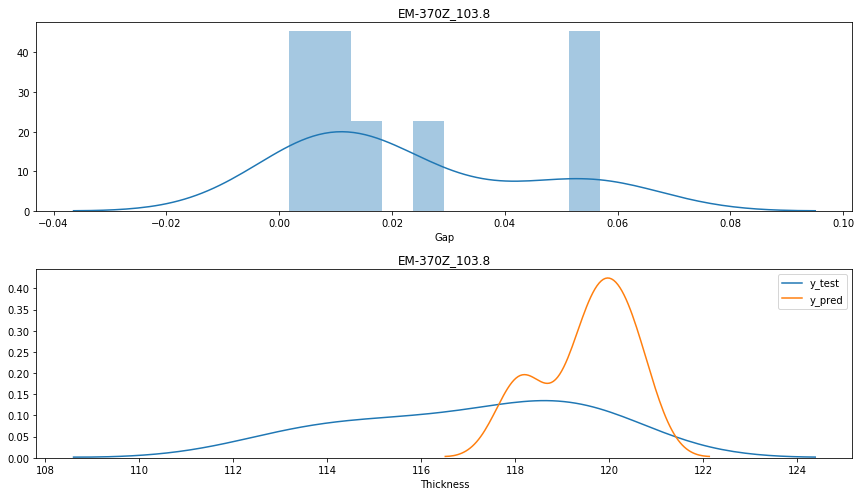

--------------------------------------------------
EM-370Z_81.4's Avg Error rate: 0.03353904657189643


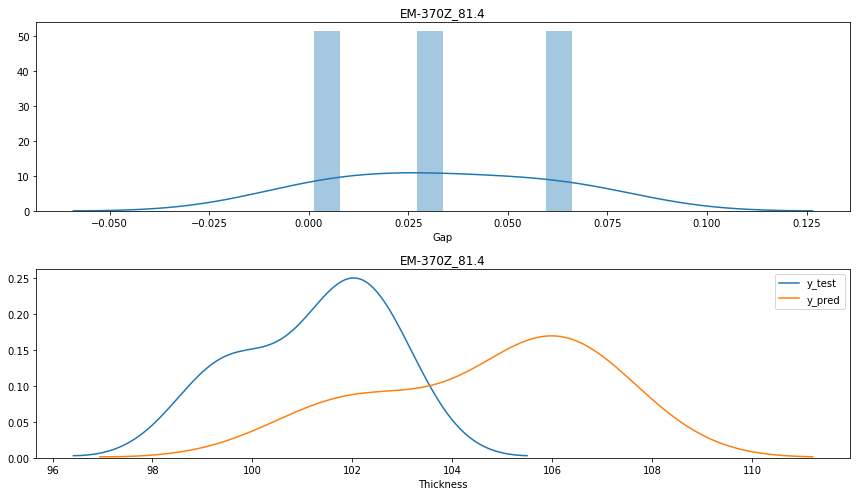

--------------------------------------------------
EM-370Z_31.0's Avg Error rate: 0.04425261911088627


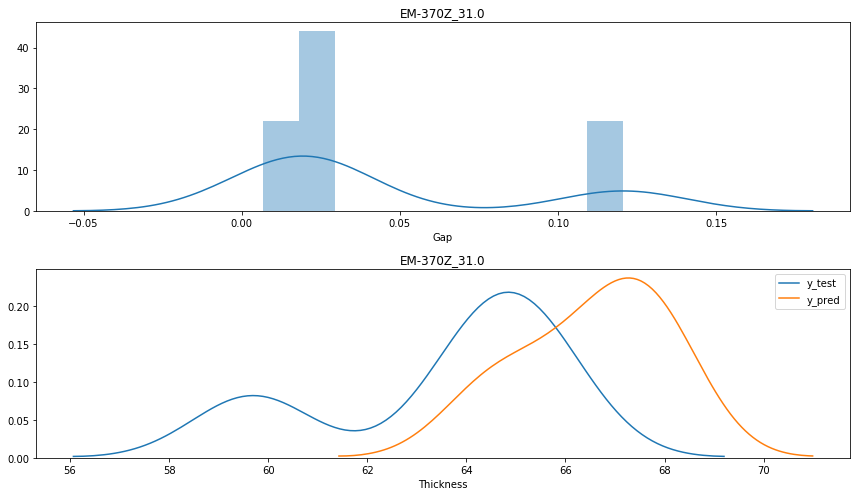

--------------------------------------------------
EM-370Z_0.0's Avg Error rate: 0.04161798928436879


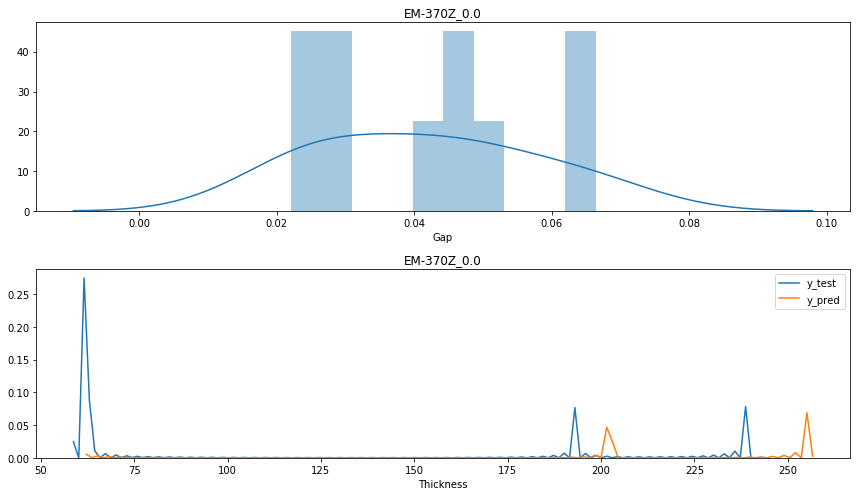

--------------------------------------------------
DS7402LC_31.0's Avg Error rate: 0.029775699011734977


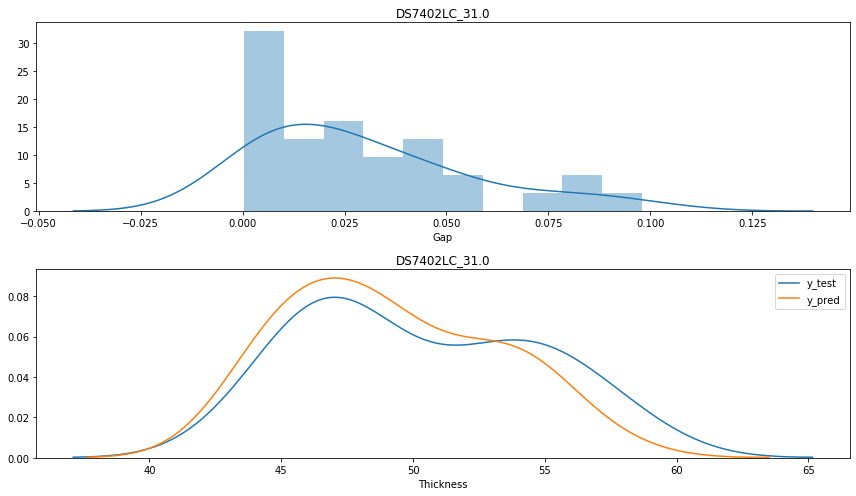

--------------------------------------------------
DS7402LC_0.0's Avg Error rate: 0.019227237794769248


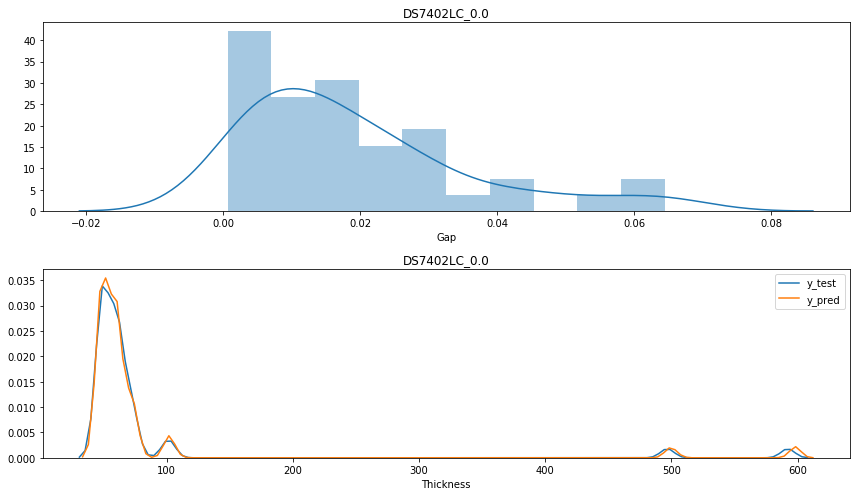

--------------------------------------------------
DS7402LC_103.8's Avg Error rate: 0.020410142919939072


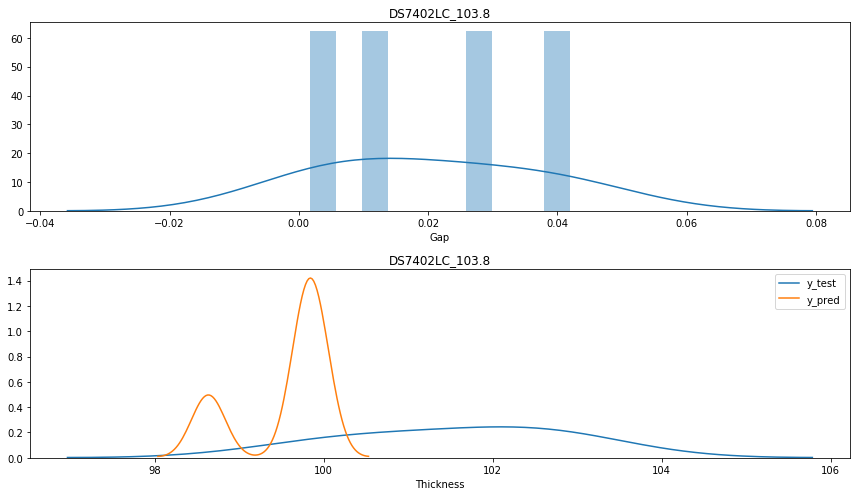

--------------------------------------------------
DS7402LC_46.8's Avg Error rate: 0.049581446218755085


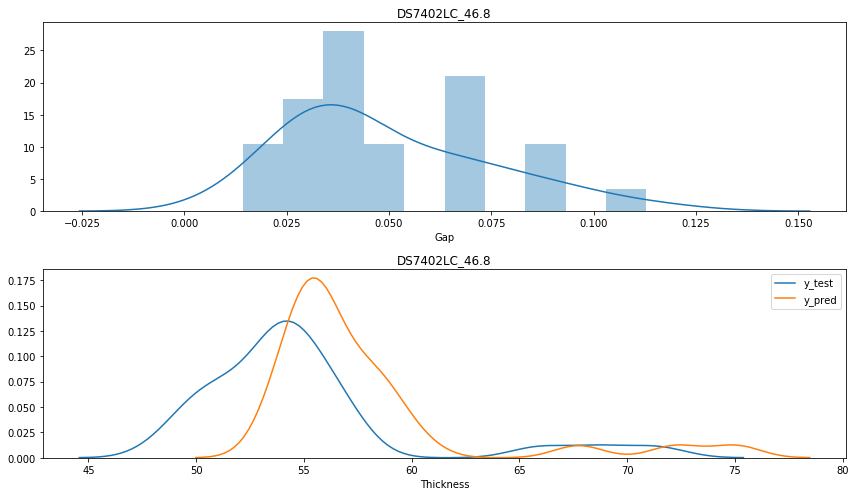

--------------------------------------------------
DS7402LC_24.4's Avg Error rate: 0.04606211456851939


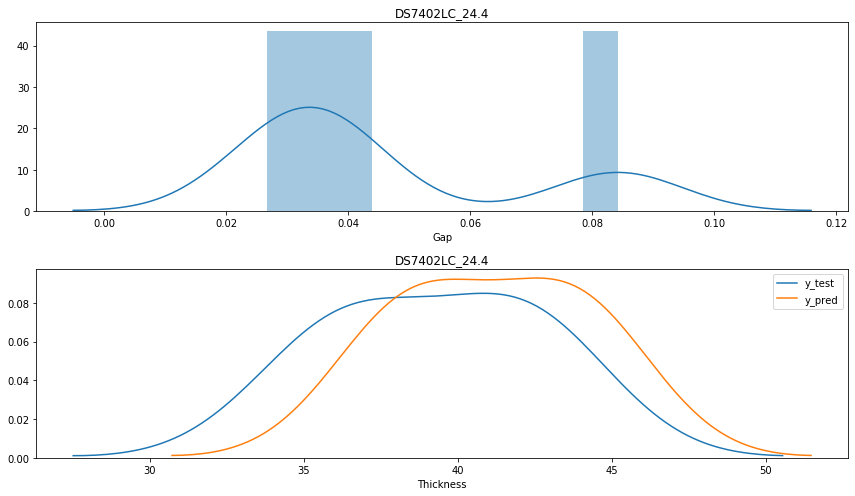

--------------------------------------------------
DS7402LC_81.4's Avg Error rate: 0.03573195068542783


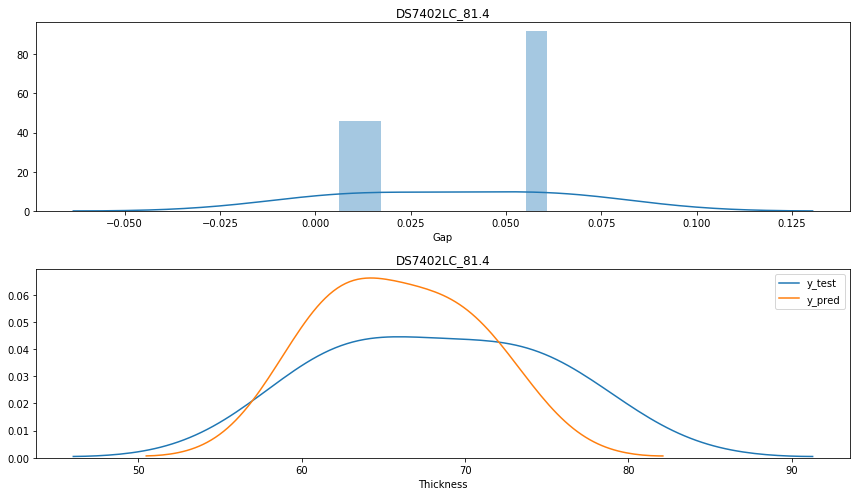

--------------------------------------------------
DS7402LC_165.0's Avg Error rate: 0.02885667389788117


C:\Users\Samsung\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning:

Data must have variance to compute a kernel density estimate.



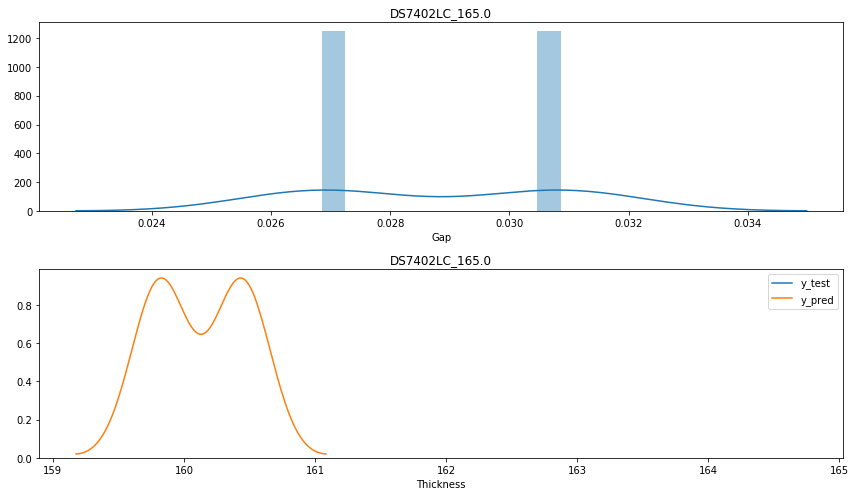

--------------------------------------------------
IT150G_46.8's Avg Error rate: 0.06210890714946142


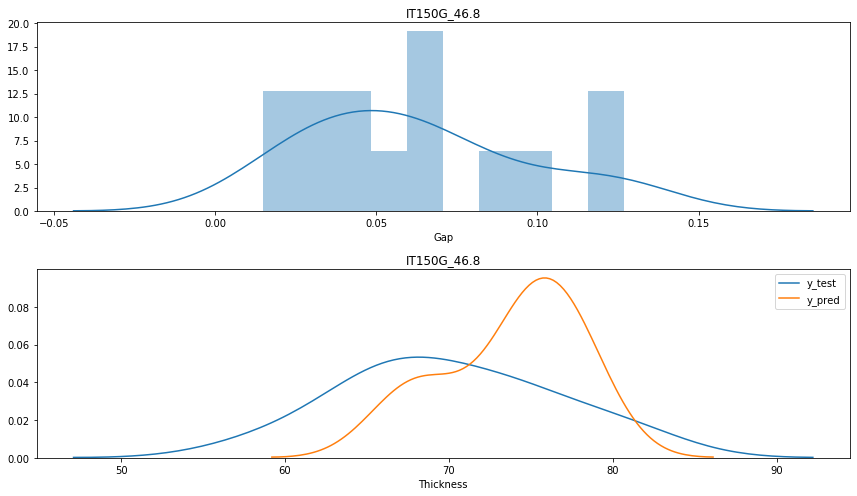

--------------------------------------------------
IT150G_0.0's Avg Error rate: 0.028682473627882364


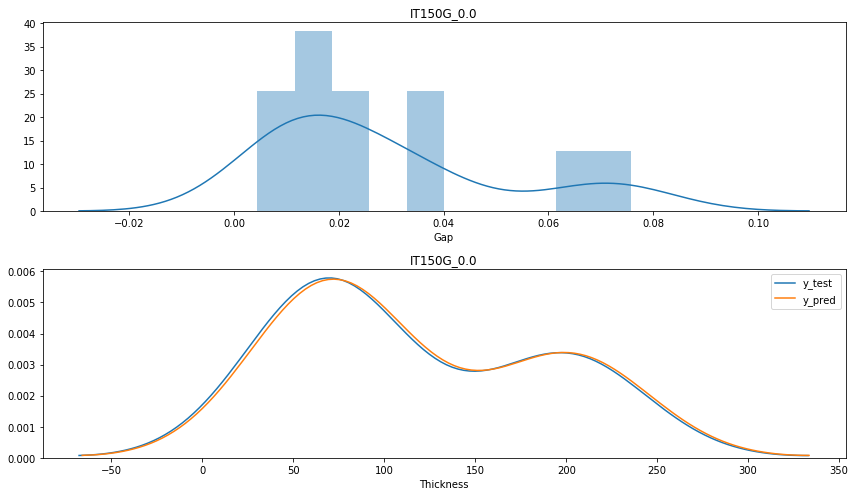

--------------------------------------------------
IT150G_203.4's Avg Error rate: 0.04110073381489437


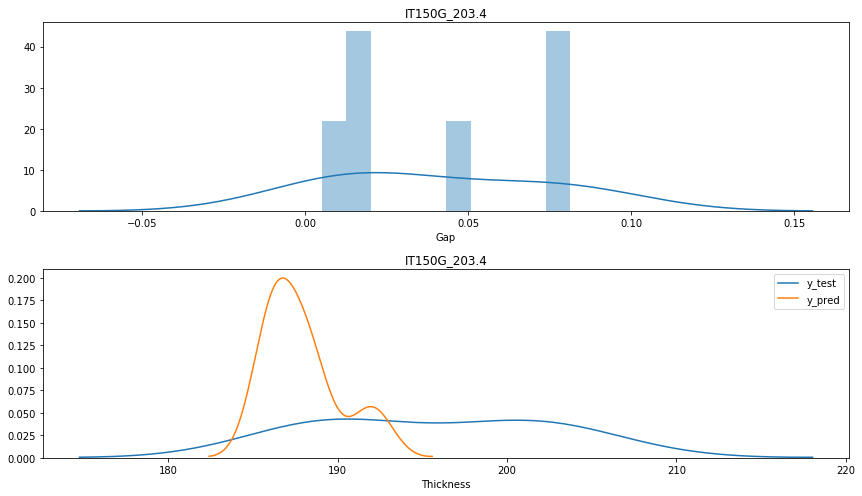

--------------------------------------------------
EM-526_46.8's Avg Error rate: 0.03507139911853283


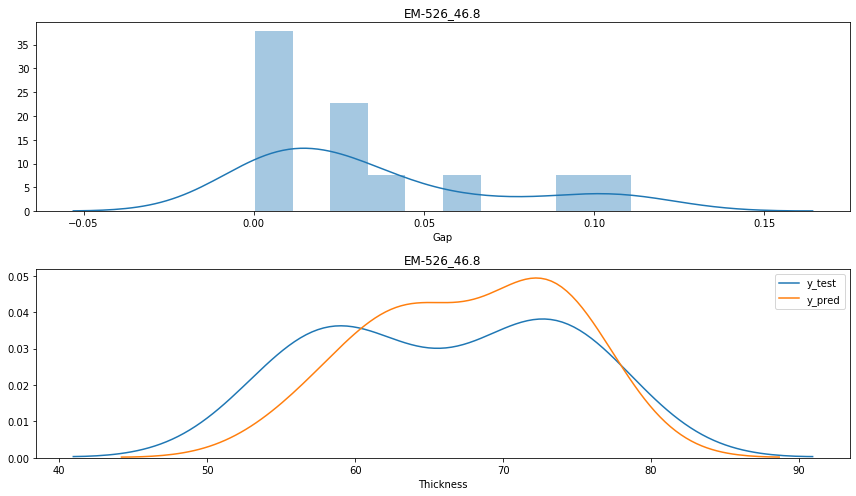

--------------------------------------------------
EM-526_0.0's Avg Error rate: 0.0329220744484798


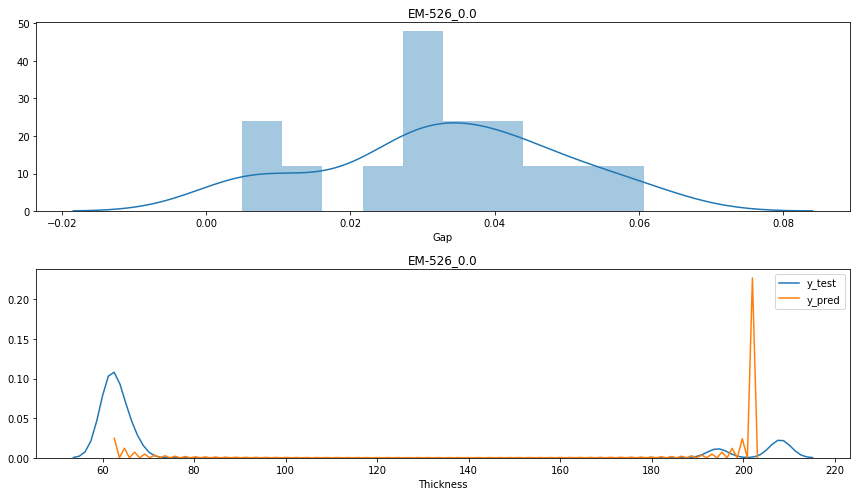

--------------------------------------------------
EM-526_103.8's Avg Error rate: 0.040652424270066316


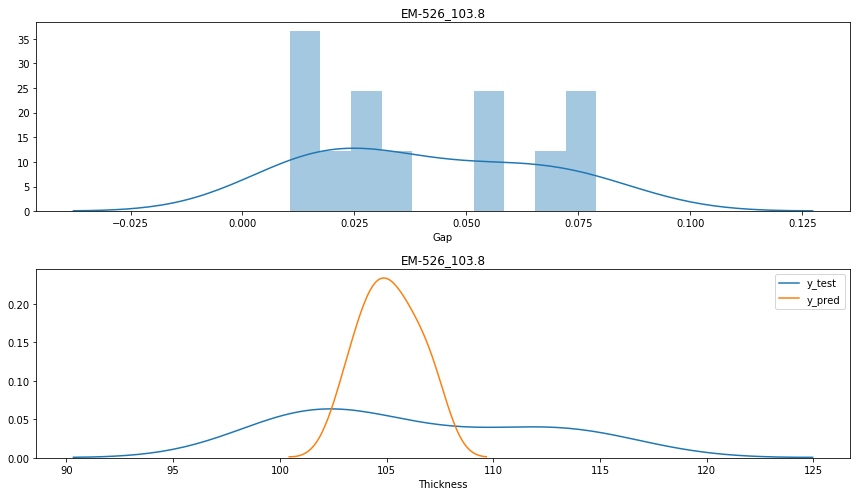

--------------------------------------------------


In [99]:
ta_ma = tar_total["Maker"].unique()
maker_,glass_,error_hist,error_rate = [],[],[],[]
for ma in ta_ma:
    df_ma = tar_total[tar_total["Maker"]==ma]
    ta_gl = df_ma["Glass"].unique()
    for gl in ta_gl:
        df_ = df_ma[df_ma["Glass"]==gl]
        maker_.append(ma)
        glass_.append(gl)
        error_hist.append(df_["error_rate"])
        error_rate.append(df_["error_rate"].mean())
        
        print("{}_{}'s Avg Error rate: {}".format(ma,gl,df_["error_rate"].mean()))

        plt.figure(figsize=(12, 7))
        plt.subplot(2,1,1)
        sns.distplot(df_["error_rate"],hist=True,label="{}_{}".format(ma,gl),bins=10)
        plt.xlabel("Gap")
        #plt.xlim([-40,40])
        plt.title("{}_{}".format(ma,gl))

        plt.subplot(2,1,2)
        sns.distplot(df_["actual"],hist=False, label="y_test")
        sns.distplot(df_["pred_"],hist=False,  label="y_pred")
        plt.xlabel("Thickness")
        plt.title("{}_{}".format(ma,gl))
        plt.tight_layout()
        plt.show()

        
        print("-"*50)

In [100]:
ann_result = pd.DataFrame([maker_,glass_,error_rate]).T.rename(columns={0:"Maker",1:"Glass",2:"Avg_Error"})
ann_result.to_excel(r"C:\Users\Samsung\jupyter\Project_PCB\result\0217\ANN_avg_error.xlsx")
ann_result.head()

,Maker,Glass,Avg_Error
0,DS7402M,46.8,0.0361443
1,DS7402M,0.0,0.0222601
2,DS7402M,203.4,0.0378021
3,DS7402M,81.4,0.0357467
4,DS7402M,165.0,0.0466638


### LR

In [101]:
tar_total = default_LR

tar_total["error_rate"] = tar_total.apply(lambda x : error_abs(x["pred_"],x["actual"]),axis=1)
tar_total.head()

,Model,Maker,Glass,pred_,actual,error_rate
0,1,DS7402M,46.8,69.9803,67.7,0.032585
1,1,DS7402M,0.0,74.0854,73.71,0.005067
2,1,DS7402M,203.4,198.405,187.25,0.056222
3,1,DS7402M,0.0,74.9981,77.47,0.032959
4,1,DS7402M,81.4,82.0393,80.48,0.019007


DS7402M_46.8's Avg Error rate: 0.05816570874752093


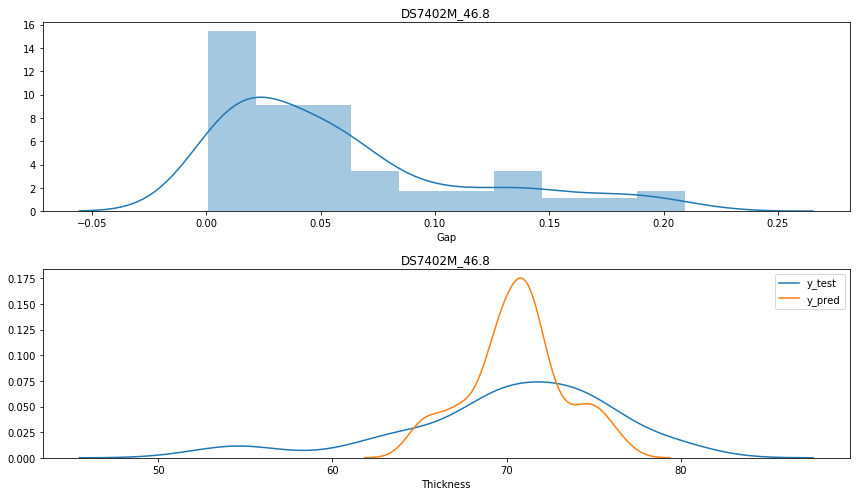

--------------------------------------------------
DS7402M_0.0's Avg Error rate: 0.022260133494642374


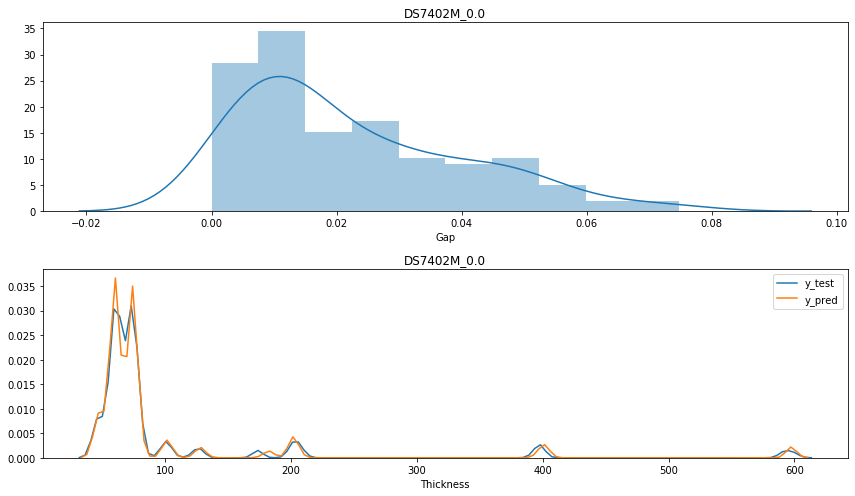

--------------------------------------------------
DS7402M_203.4's Avg Error rate: 0.027994829529991726


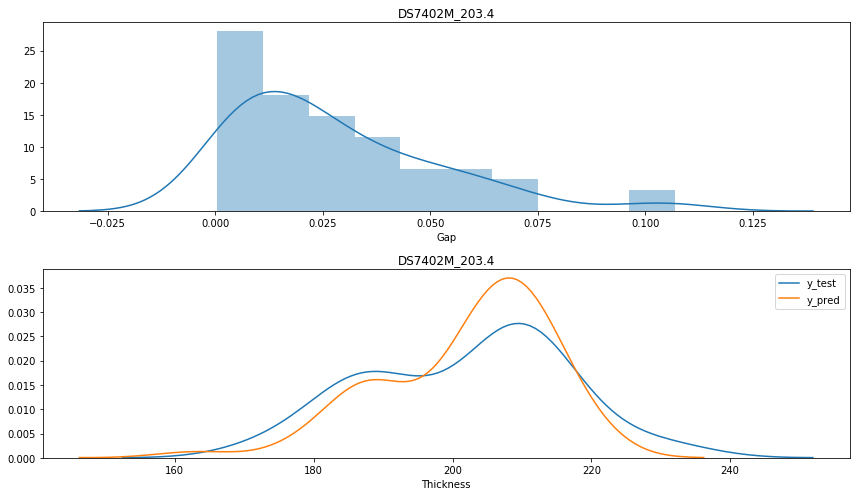

--------------------------------------------------
DS7402M_81.4's Avg Error rate: 0.01382517682604974


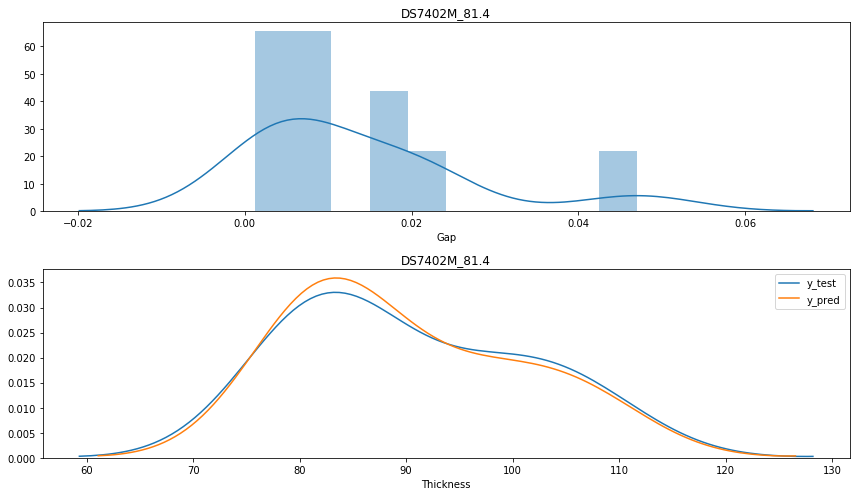

--------------------------------------------------
DS7402M_165.0's Avg Error rate: 0.01841064602858769


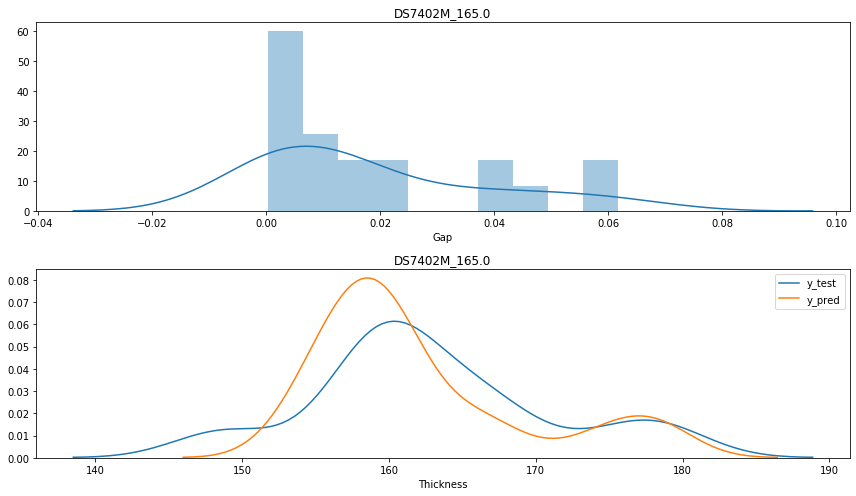

--------------------------------------------------
DS7402M_31.0's Avg Error rate: 0.07592168883491845


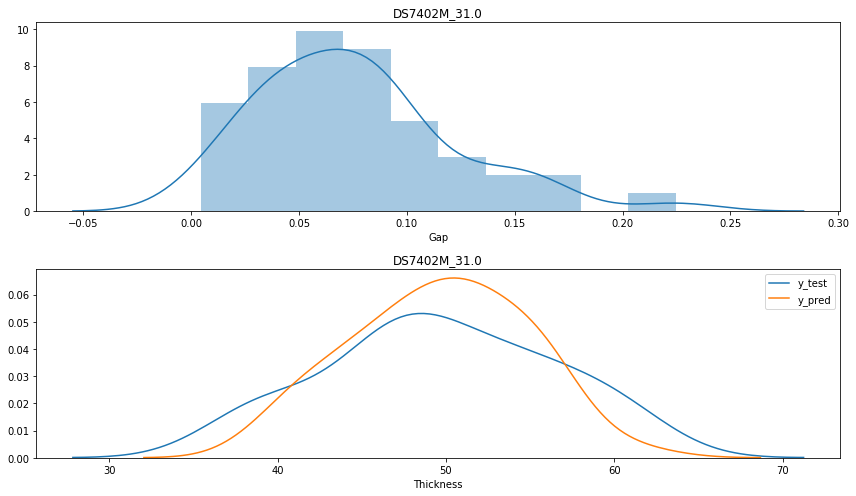

--------------------------------------------------
DS7402M_103.8's Avg Error rate: 0.025076173822123026


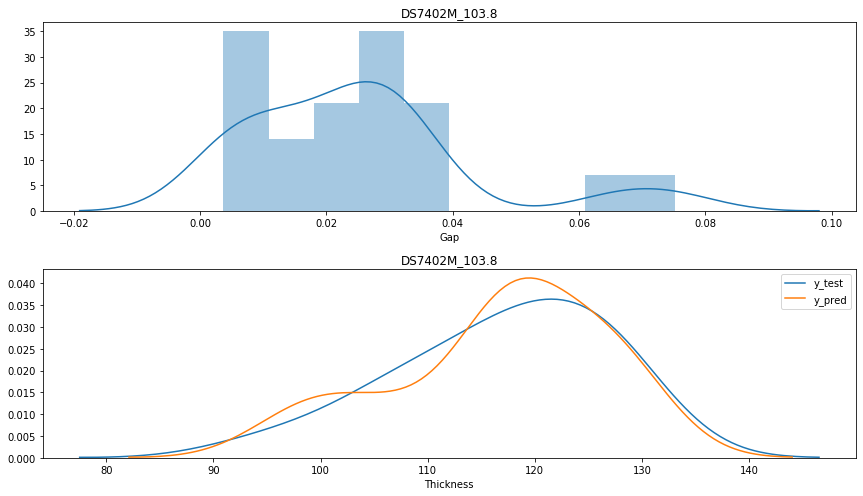

--------------------------------------------------
DS7402M_24.4's Avg Error rate: 0.025141493019388655


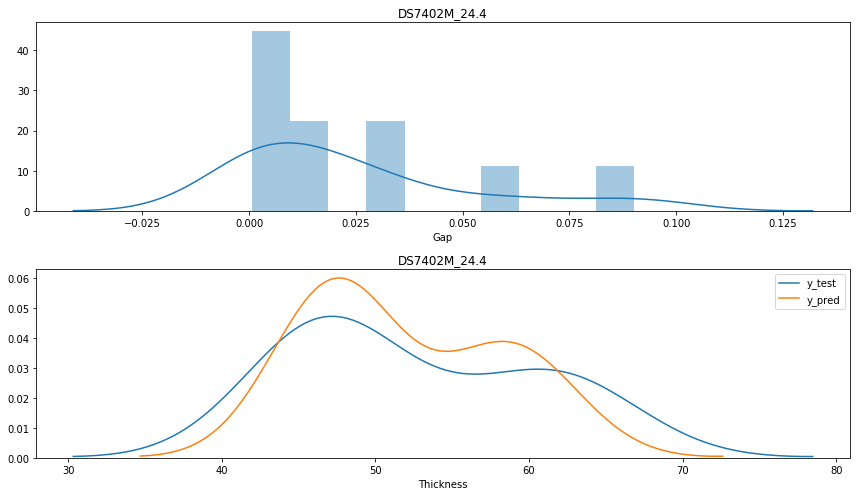

--------------------------------------------------
NPG-151_46.8's Avg Error rate: 0.01020756508380435


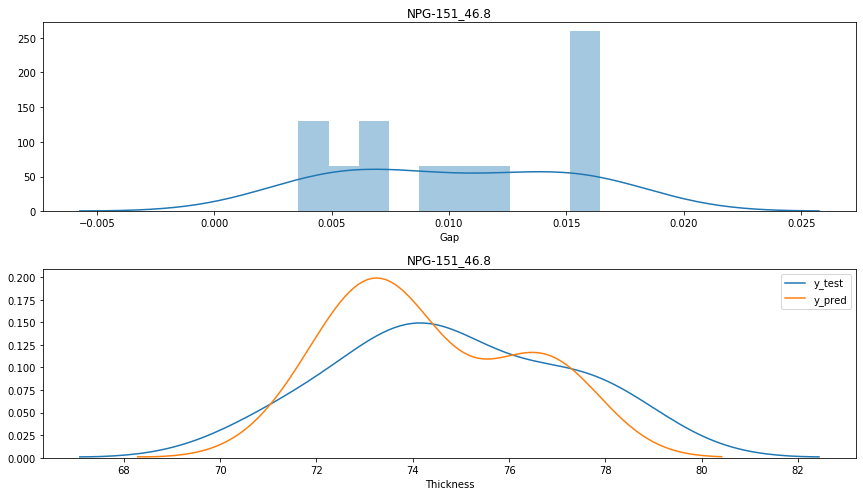

--------------------------------------------------
NPG-151_0.0's Avg Error rate: 0.021816966008810307


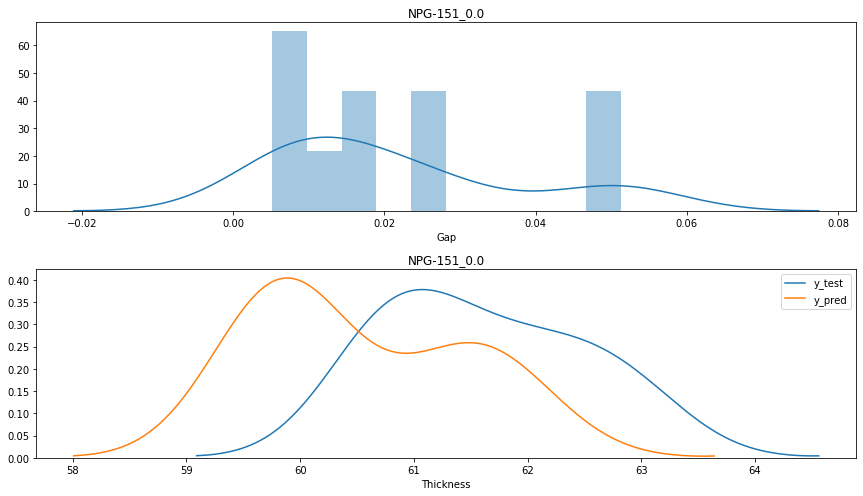

--------------------------------------------------
EM-370Z_46.8's Avg Error rate: 0.027678613008288014


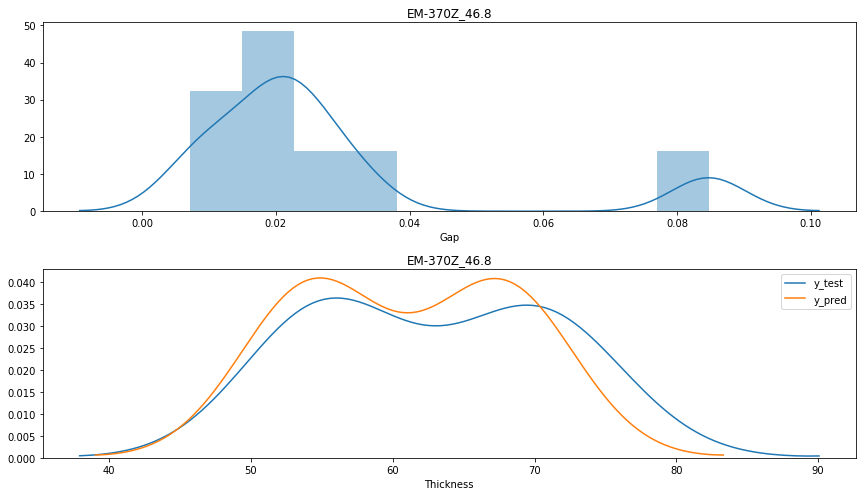

--------------------------------------------------
EM-370Z_48.0's Avg Error rate: 0.01040086563300433


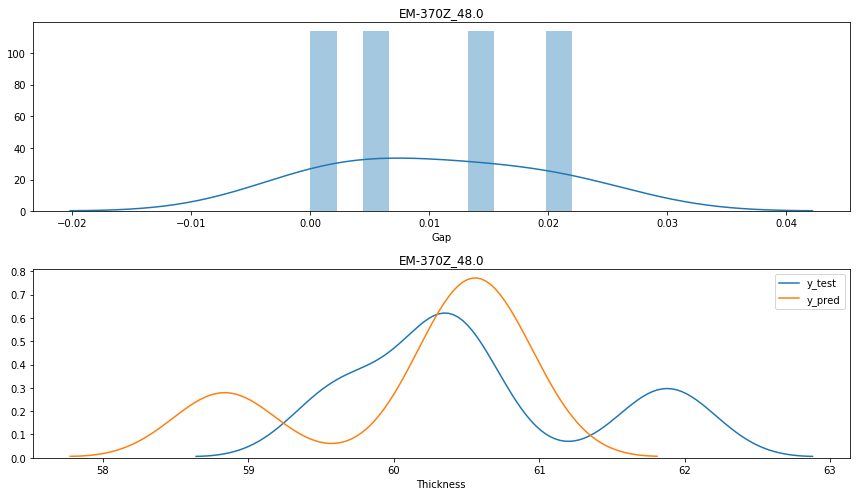

--------------------------------------------------
EM-370Z_103.8's Avg Error rate: 0.020155006301209855


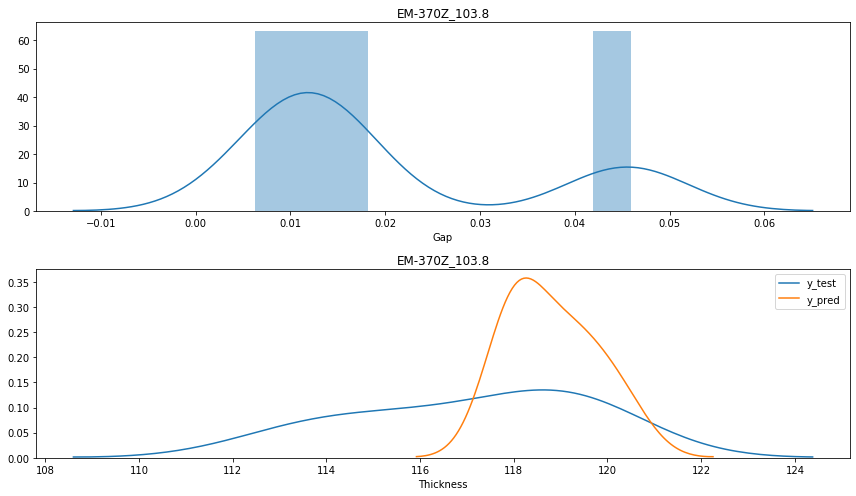

--------------------------------------------------
EM-370Z_81.4's Avg Error rate: 0.01935524441854602


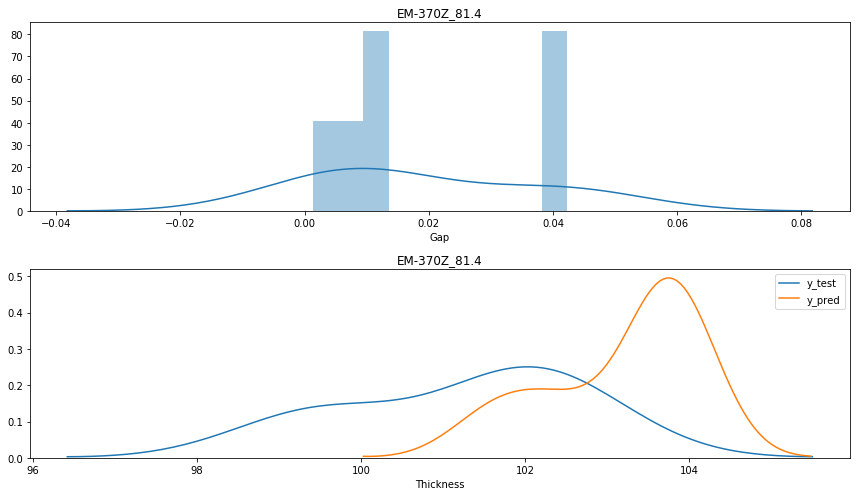

--------------------------------------------------
EM-370Z_31.0's Avg Error rate: -0.2393238585461836


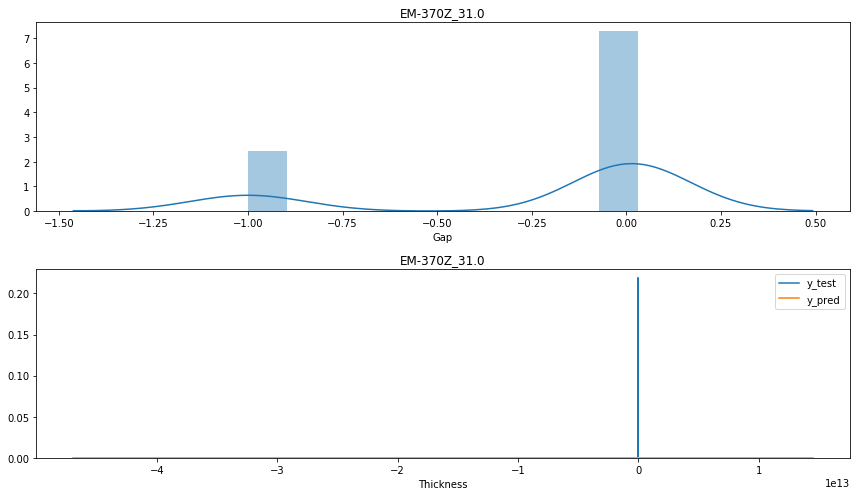

--------------------------------------------------
EM-370Z_0.0's Avg Error rate: 0.04161798928436879


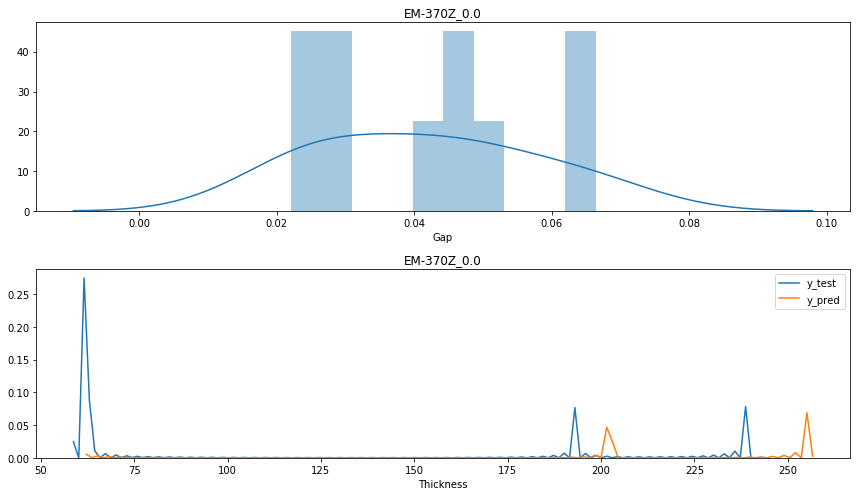

--------------------------------------------------
DS7402LC_31.0's Avg Error rate: 0.044110697736837574


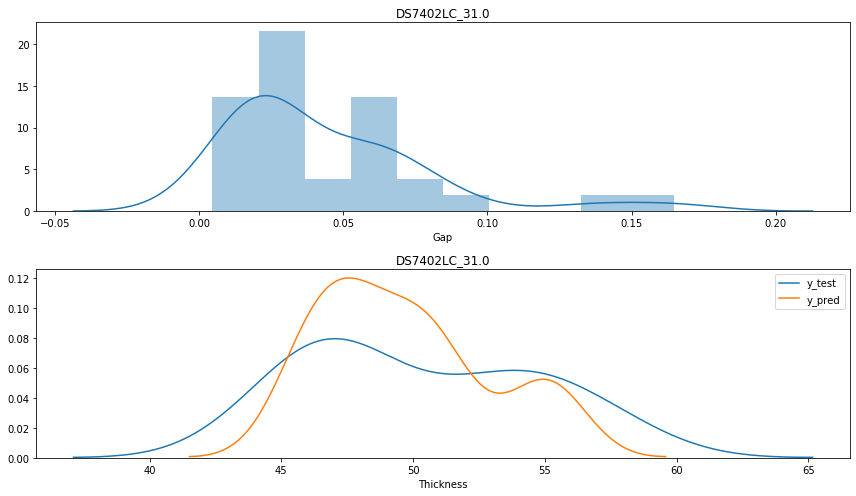

--------------------------------------------------
DS7402LC_0.0's Avg Error rate: 0.019227237794769248


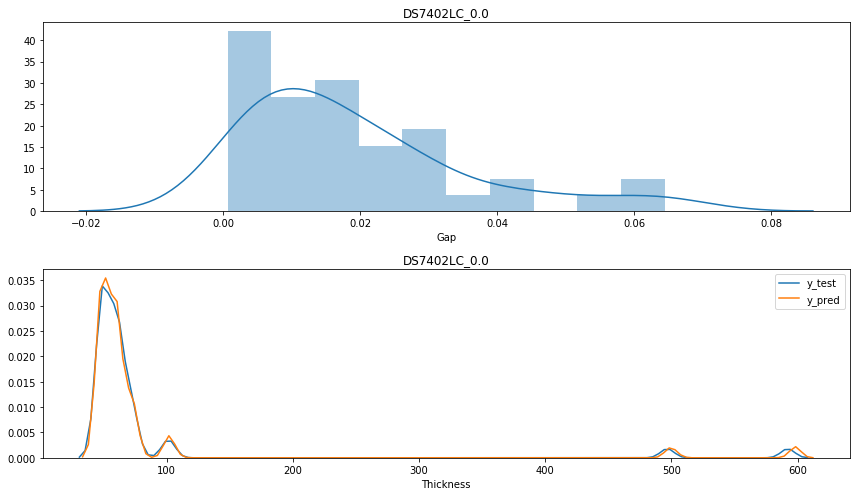

--------------------------------------------------
DS7402LC_103.8's Avg Error rate: 0.01994257233627769


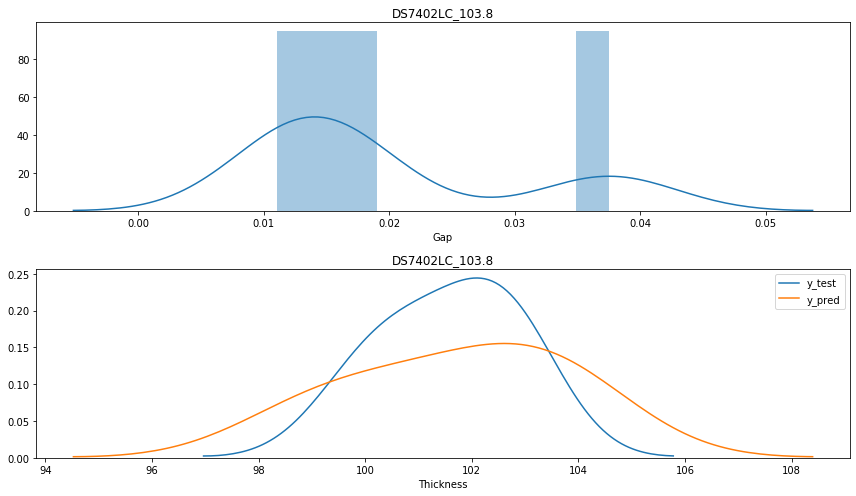

--------------------------------------------------
DS7402LC_46.8's Avg Error rate: 0.02311138437418314


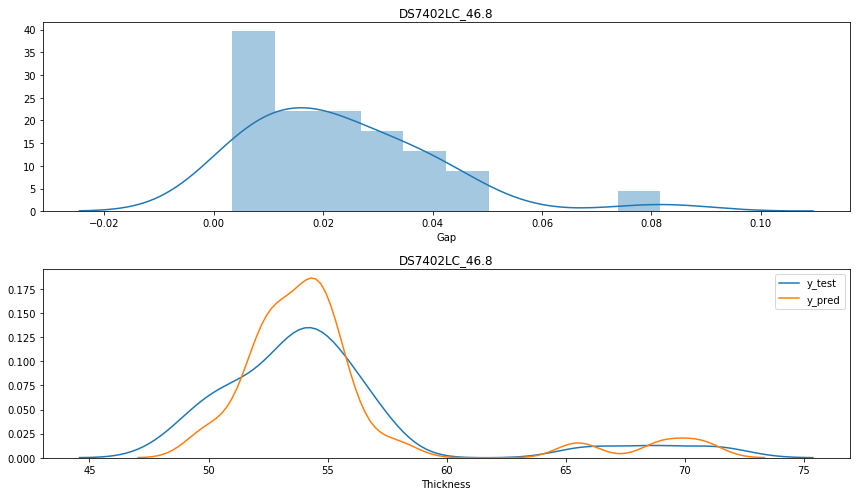

--------------------------------------------------
DS7402LC_24.4's Avg Error rate: 0.018741557559314656


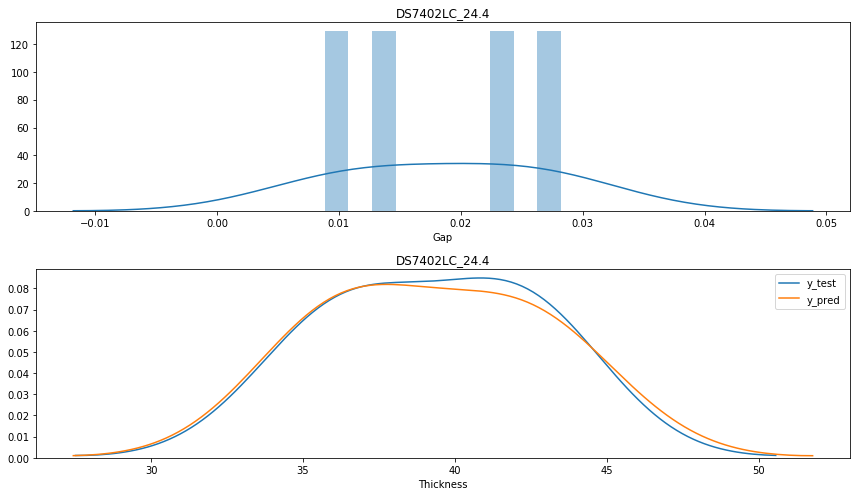

--------------------------------------------------
DS7402LC_81.4's Avg Error rate: 0.015606576188225894


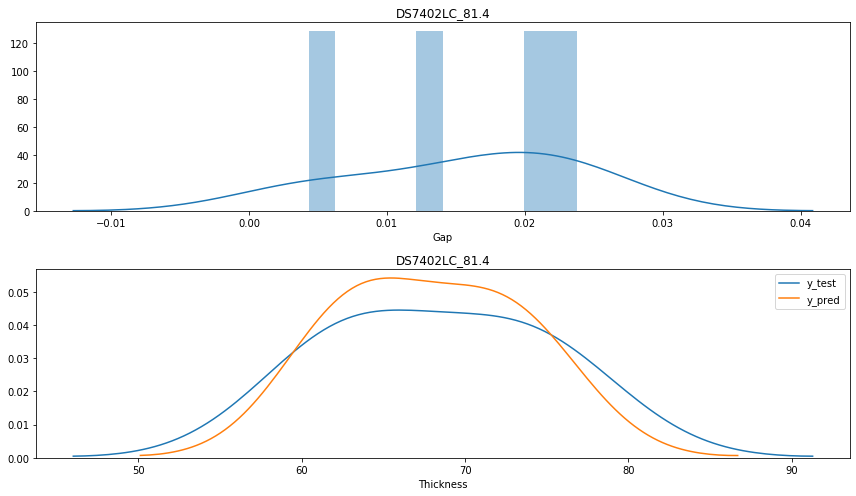

--------------------------------------------------
DS7402LC_165.0's Avg Error rate: 0.013130604675214333


C:\Users\Samsung\anaconda3\lib\site-packages\seaborn\distributions.py:288: UserWarning:

Data must have variance to compute a kernel density estimate.



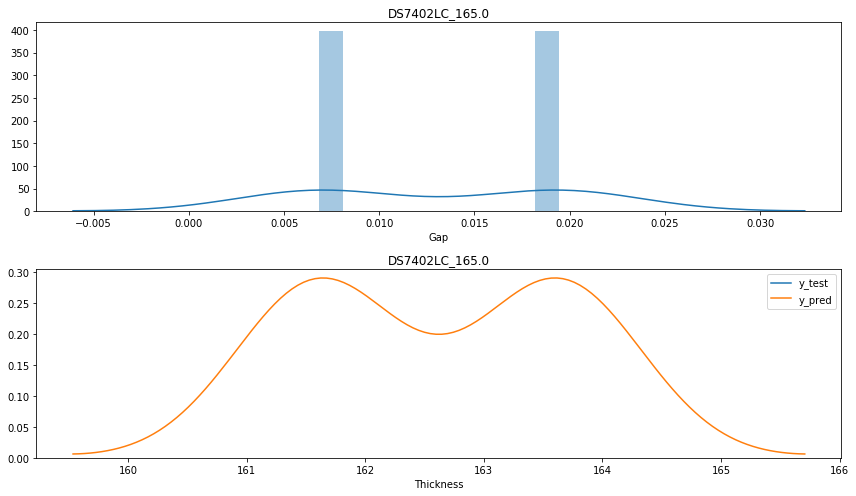

--------------------------------------------------
IT150G_46.8's Avg Error rate: 0.06723483561663564


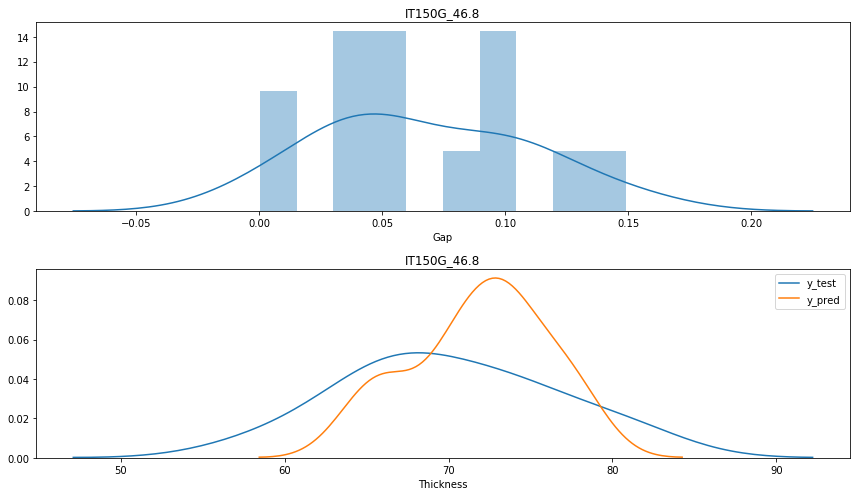

--------------------------------------------------
IT150G_0.0's Avg Error rate: 0.028682473627882364


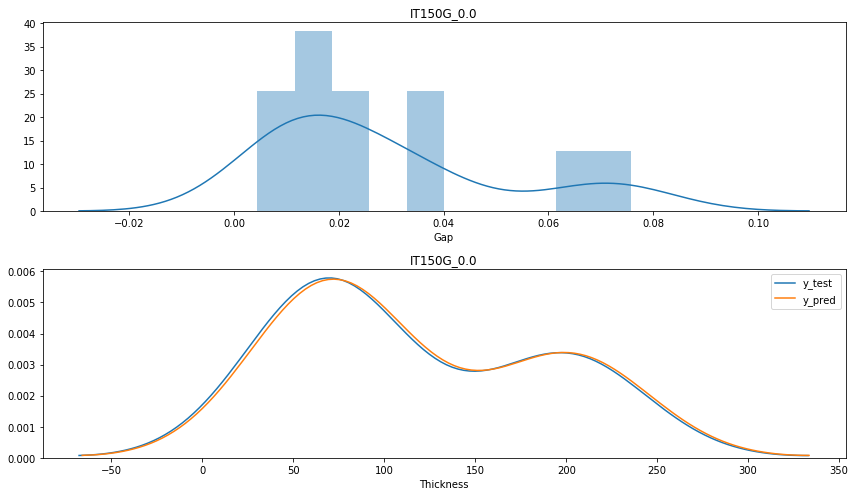

--------------------------------------------------
IT150G_203.4's Avg Error rate: 0.020444390391059872


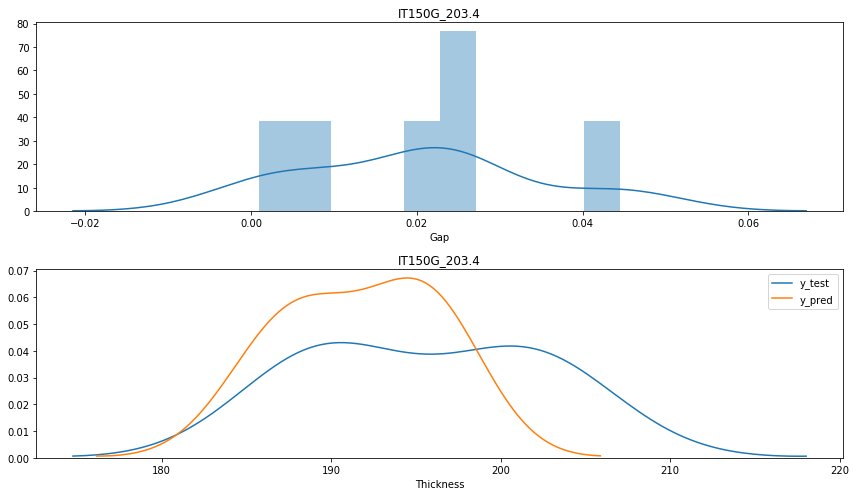

--------------------------------------------------
EM-526_46.8's Avg Error rate: 0.025750371745700034


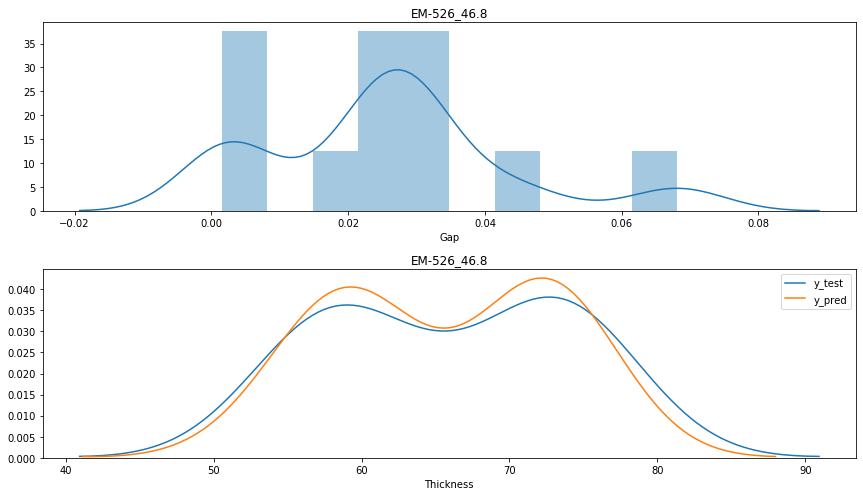

--------------------------------------------------
EM-526_0.0's Avg Error rate: 0.0329220744484798


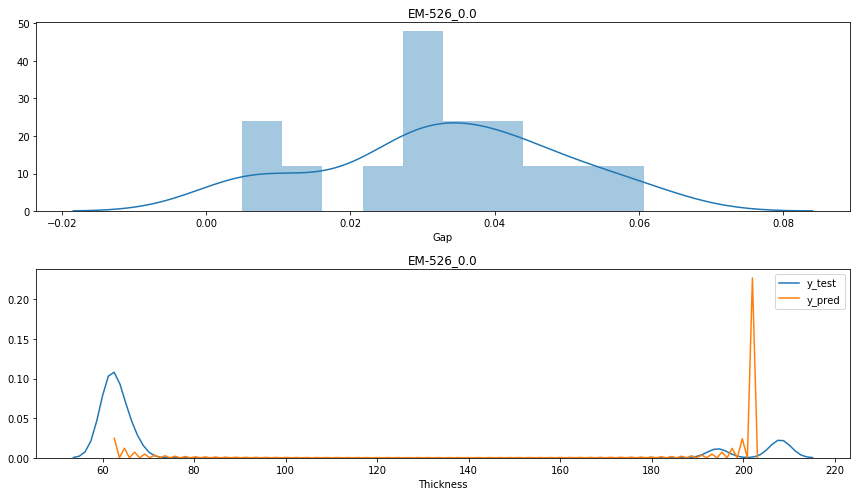

--------------------------------------------------
EM-526_103.8's Avg Error rate: 0.030793222593517956


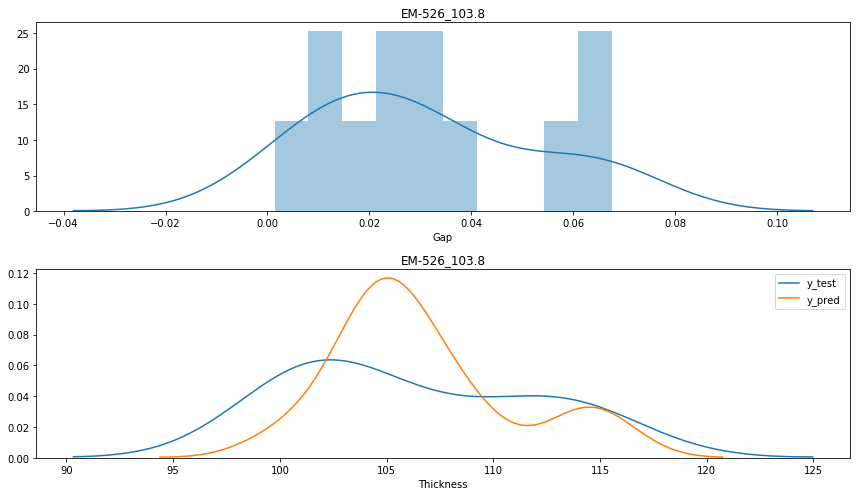

--------------------------------------------------


In [102]:
ta_ma = tar_total["Maker"].unique()
maker_,glass_,error_hist,error_rate = [],[],[],[]
for ma in ta_ma:
    df_ma = tar_total[tar_total["Maker"]==ma]
    ta_gl = df_ma["Glass"].unique()
    for gl in ta_gl:
        df_ = df_ma[df_ma["Glass"]==gl]
        maker_.append(ma)
        glass_.append(gl)
        error_hist.append(df_["error_rate"])
        error_rate.append(df_["error_rate"].mean())
        
        print("{}_{}'s Avg Error rate: {}".format(ma,gl,df_["error_rate"].mean()))

        plt.figure(figsize=(12, 7))
        plt.subplot(2,1,1)
        sns.distplot(df_["error_rate"],hist=True,label="{}_{}".format(ma,gl),bins=10)
        plt.xlabel("Gap")
        #plt.xlim([-40,40])
        plt.title("{}_{}".format(ma,gl))

        plt.subplot(2,1,2)
        sns.distplot(df_["actual"],hist=False, label="y_test")
        sns.distplot(df_["pred_"],hist=False,  label="y_pred")
        plt.xlabel("Thickness")
        plt.title("{}_{}".format(ma,gl))
        plt.tight_layout()
        plt.show()

        
        print("-"*50)

In [103]:
lr_result = pd.DataFrame([maker_,glass_,error_rate]).T.rename(columns={0:"Maker",1:"Glass",2:"Avg_Error"})
lr_result.to_excel(r"C:\Users\Samsung\jupyter\Project_PCB\result\0217\LR_avg_error.xlsx")
lr_result.head()

,Maker,Glass,Avg_Error
0,DS7402M,46.8,0.0581657
1,DS7402M,0.0,0.0222601
2,DS7402M,203.4,0.0279948
3,DS7402M,81.4,0.0138252
4,DS7402M,165.0,0.0184106


##  결과해석

0.01856559450286789 0.052076846990944045


(-0.3, 0.4)

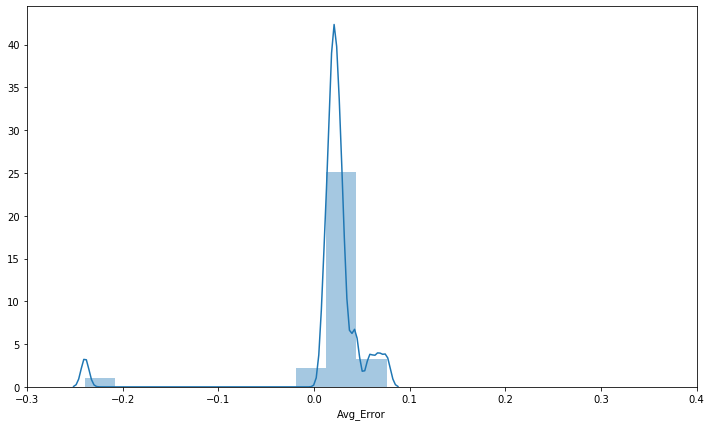

In [104]:
ta_result = lr_result
print(ta_result["Avg_Error"].mean(),ta_result["Avg_Error"].std())
data_g = ta_result["Avg_Error"]
plt.figure(figsize=(12, 7))
sns.distplot(data_g,hist=True,bins=10)
plt.xlim([-0.3,0.4])

0.06709113167510666 0.05196721536712112


(-0.3, 0.4)

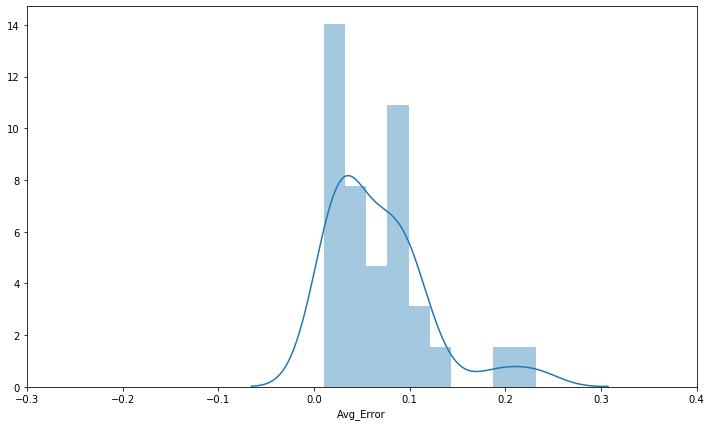

In [105]:
ta_result = lr_total_result
print(ta_result["Avg_Error"].mean(),ta_result["Avg_Error"].std())
data_g = ta_result["Avg_Error"]
plt.figure(figsize=(12, 7))
sns.distplot(data_g,hist=True,bins=10)
plt.xlim([-0.3,0.4])

0.037917173229523204 0.015380667436913091


(-0.3, 0.4)

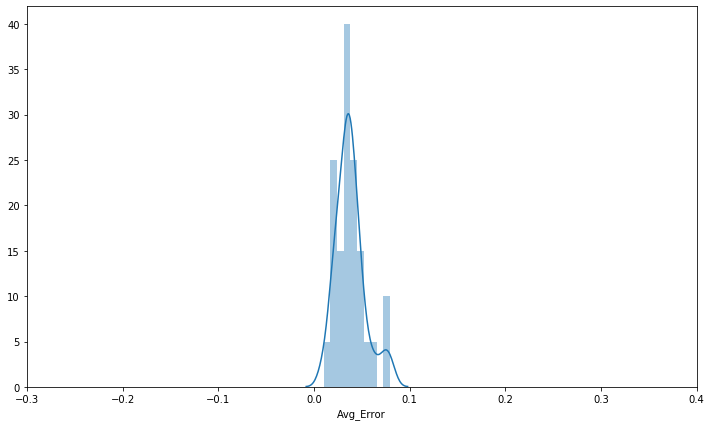

In [106]:
ta_result = ann_result
print(ta_result["Avg_Error"].mean(),ta_result["Avg_Error"].std())
data_g = ta_result["Avg_Error"]
plt.figure(figsize=(12, 7))
sns.distplot(data_g,hist=True,bins=10)
plt.xlim([-0.3,0.4])

0.03593484455123969 0.020597993146225967


(-0.3, 0.4)

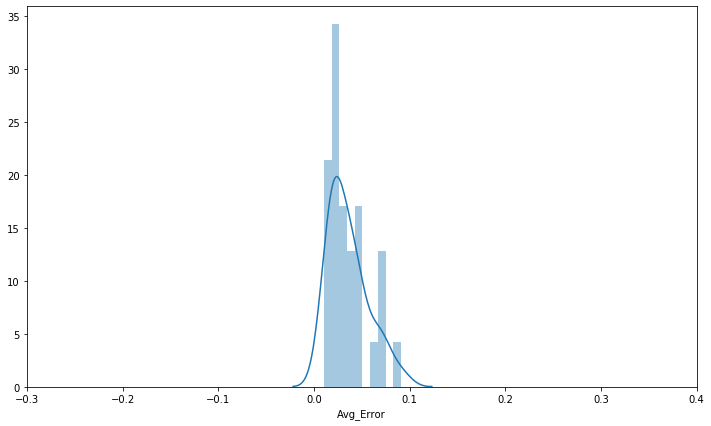

In [107]:
ta_result = ann_total_result
print(ta_result["Avg_Error"].mean(),ta_result["Avg_Error"].std())
data_g = ta_result["Avg_Error"]
plt.figure(figsize=(12, 7))
sns.distplot(data_g,hist=True,bins=10)
plt.xlim([-0.3,0.4])